In [1]:
from math import ceil
import re
from joblib import Memory
from datetime import timedelta
import pickle
import hashlib
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from tqdm.auto import tqdm
from mmocc.config import (
    fig_column_width,
    fig_page_width,
    golden_ratio,
    silver_ratio,
    bronze_ratio,
    default_image_backbone,
    default_sat_backbone,
    figures_path,
    image_feature_dims,
    sat_feature_dims,
    cache_path,
)
from mmocc.plot_utils import setup_matplotlib
from mmocc.train_utils import img_model_labels, sat_model_labels
from mmocc.utils import (
    get_focal_species_ids,
    powerset,
    experiment_to_filename,
    get_scientific_taxon_map,
    get_taxon_map,
)

setup_matplotlib()


fa_icon_map = {
    "covariates": chr(int("f0ac", 16)),  # globe
    "sat": chr(int("f7bf", 16)),  # satellite
    "sat_feature": chr(int("f7bf", 16)),  # satellite
    "image": chr(int("f030", 16)),  # camera
}

fa_icon_map_latex = {
    "covariates": r"\faGlobe[solid]",  # globe
    "sat": r"\faSatellite[solid]",  # satellite
    "sat_feature": r"\faSatellite[solid]",  # satellite
    "image": r"\faCamera[solid]",  # camera
}

fa_icon_colors = {
    k: plt.rcParams["axes.prop_cycle"].by_key()["color"][i]
    for i, k in enumerate(fa_icon_map.keys())
}


def get_fontawesome_font():
    return FontProperties(
        fname=cache_path
        / "fonts"
        / "fontawesome-free-7.1.0-desktop"
        / "fontawesome-free-7.1.0-desktop"
        / "otfs"
        / "Font Awesome 7 Free-Solid-900.otf"
    )


# disable jax pre-allocation
import os

os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
os.environ["CUDA_VISIBLE_DEVICES"] = ""

figures_dir = str(figures_path)
os.makedirs(figures_dir, exist_ok=True)
use_nonlinear_regressors = False

memory = Memory(cache_path / "joblib_figures")

In [2]:
image_backbones = sorted(list(image_feature_dims.keys()))
sat_backbones = sorted(list(sat_feature_dims.keys()))

modalities = ["image", "sat", "covariates"]
modalities_subsets = [set(m) for m in powerset(modalities) if len(m) > 0]


def get_experiment_paths():
    experiment_paths = []
    for taxon_id in get_focal_species_ids():
        for modalities_subset in modalities_subsets:

            modality_image_backbones = (
                image_backbones if "image" in modalities_subset else [None]
            )
            modality_sat_backbones = (
                sat_backbones if "sat" in modalities_subset else [None]
            )
            for image_backbone in modality_image_backbones:
                for sat_backbone in modality_sat_backbones:

                    if (
                        image_backbone is not None
                        and image_backbone != default_image_backbone
                    ) and (
                        sat_backbone is not None
                        and sat_backbone != default_sat_backbone
                    ):
                        continue

                    filename = experiment_to_filename(
                        taxon_id,
                        modalities_subset,
                        image_backbone,
                        sat_backbone,
                        "pkl",
                    )
                    filepath = cache_path / "fit_results" / filename
                    if not filepath.exists():
                        print(f"Skipping missing experiment {filename}")
                        continue

                    experiment_paths.append(filepath)

    return experiment_paths


@memory.cache
def load_df(experiment_paths):
    df = []
    for filepath in tqdm(experiment_paths):
        with open(filepath, "rb") as f:
            data = pickle.load(f)
            del data["mcmc_samples"]  # dont need to keep this in df
            df.append(data)

    df = pd.DataFrame(df)

    return df


# # uncomment to re-generate cached dataframe
# df = load_df(get_experiment_paths())
# df.to_pickle(cache_path / "figure_data.pkl")

df = pd.read_pickle(cache_path / "figure_data.pkl")
df_raw = df.copy()

df

,taxon_id,scientific_name,common_name,modalities,image_backbone,sat_backbone,limit_to_range,modalities_scaler,modalities_pca,mean_naive_occupancy_train,...,biolith_ap_oracle_train,biolith_ap_oracle_test,biolith_roc_auc_train,biolith_roc_auc_test,biolith_roc_auc_null_train,biolith_roc_auc_null_test,biolith_roc_auc_oracle_train,biolith_roc_auc_oracle_test,biolith_errors,best_params
0,00804e75-09ef-44e5-8984-85e365377d47,Antilocapra americana,pronghorn,[image],bioclip,None,True,{'image': StandardScaler()},{'image': PCA(n_components=128)},0.041719,...,NaN,0.994929,0.962444,0.811854,0.5,0.5,NaN,0.999684,[],"{'prior_type': 'normal', 'occ_params': {'loc':..."
1,00804e75-09ef-44e5-8984-85e365377d47,Antilocapra americana,pronghorn,[image],clip_vitbigg14,None,True,{'image': StandardScaler()},{'image': PCA(n_components=128)},0.041719,...,NaN,0.994929,0.969406,0.840056,0.5,0.5,NaN,0.999684,[],"{'prior_type': 'laplace', 'occ_params': {'loc'..."
2,00804e75-09ef-44e5-8984-85e365377d47,Antilocapra americana,pronghorn,[image],dinov2_vitb14,None,True,{'image': StandardScaler()},{'image': PCA(n_components=128)},0.041719,...,NaN,0.994929,0.967541,0.833322,0.5,0.5,NaN,0.999684,[],"{'prior_type': 'laplace', 'occ_params': {'loc'..."
3,00804e75-09ef-44e5-8984-85e365377d47,Antilocapra americana,pronghorn,[image],dinov2_vits14,None,True,{'image': StandardScaler()},{'image': PCA(n_components=128)},0.041719,...,NaN,0.994929,0.968933,0.846473,0.5,0.5,NaN,0.999684,[],"{'prior_type': 'laplace', 'occ_params': {'loc'..."
4,00804e75-09ef-44e5-8984-85e365377d47,Antilocapra americana,pronghorn,[image],dinov3_vitb16,None,True,{'image': StandardScaler()},{'image': PCA(n_components=128)},0.041719,...,NaN,0.994929,0.969391,0.814456,0.5,0.5,NaN,0.999684,[],"{'prior_type': 'laplace', 'occ_params': {'loc'..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1912,ffe603fc-4920-4302-96d0-65f708bd5b2d,Urocyon cinereoargenteus,grey fox,"[covariates, image, sat]",dinov3_vitl16,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.061603,...,NaN,1.000000,0.867519,0.709445,0.5,0.5,NaN,1.000000,[],"{'prior_type': 'normal', 'occ_params': {'loc':..."
1913,ffe603fc-4920-4302-96d0-65f708bd5b2d,Urocyon cinereoargenteus,grey fox,"[covariates, image, sat]",fully_random,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.061603,...,NaN,1.000000,0.849212,0.679918,0.5,0.5,NaN,1.000000,[],"{'prior_type': 'normal', 'occ_params': {'loc':..."
1914,ffe603fc-4920-4302-96d0-65f708bd5b2d,Urocyon cinereoargenteus,grey fox,"[covariates, image, sat]",megadetector,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.061603,...,NaN,1.000000,0.846621,0.711294,0.5,0.5,NaN,1.000000,[],"{'prior_type': 'normal', 'occ_params': {'loc':..."
1915,ffe603fc-4920-4302-96d0-65f708bd5b2d,Urocyon cinereoargenteus,grey fox,"[covariates, image, sat]",random_resnet50,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.061603,...,NaN,1.000000,0.857384,0.672874,0.5,0.5,NaN,1.000000,[],"{'prior_type': 'laplace', 'occ_params': {'loc'..."


In [3]:
df["lppd_test_norm"] = (df["lppd_test"] - df["lppd_null_test"]) / (
    df["lppd_oracle_test"] - df["lppd_null_test"]
)

In [4]:
# filter out image backbones
df = df[
    (
        ~df["image_backbone"].isin(
            [
                "dinov3_vitl16",
                "dinov3_vitb16",
                "dinov2_vits14",
            ]
        )
    )
]

df = df[
    (
        ~df["sat_backbone"].isin(
            [
                "dinov3",
            ]
        )
    )
]

In [5]:
def transform_species_name(name):
    return str(name).strip()


taxon_map_common_name = get_taxon_map()
taxon_map_common_name = {
    k: transform_species_name(v) for k, v in taxon_map_common_name.items()
}
taxon_map = get_scientific_taxon_map()
taxon_map = {k: transform_species_name(v) for k, v in taxon_map.items()}

min_occupancy = 0.1  # TODO
low_occupancy_mask = df["mean_naive_occupancy_test"] < min_occupancy
print(
    f"Removing {df[low_occupancy_mask]['taxon_id'].nunique()} species with low occupancy (< 0.1)"
)
df = df[(df["mean_naive_occupancy_test"] >= min_occupancy)]

missing_taxon_mask_common_name = ~df["taxon_id"].isin(taxon_map_common_name.keys())
print(
    f"Removing {df[missing_taxon_mask_common_name]['taxon_id'].nunique()} species with missing common name taxon mapping"
)
df = df[~missing_taxon_mask_common_name]

missing_taxon_mask = ~df["taxon_id"].isin(taxon_map.keys())
print(
    f"Removing {df[missing_taxon_mask]['taxon_id'].nunique()} species with missing taxon mapping"
)
df = df[~missing_taxon_mask]

# save final list of species to cache
final_species_ids = sorted(df["taxon_id"].unique().tolist())
with open(cache_path / "final_species_ids.txt", "w") as f:
    f.write(",".join(final_species_ids))

# use seaborn color palette
palette = sns.color_palette("crest", n_colors=df["taxon_id"].nunique())

# Sort taxon IDs by mean naive occupancy to create a consistent color mapping
sorted_taxa = (
    df.groupby("taxon_id")["mean_naive_occupancy_test"].mean().sort_values().index
)

# Create a color map from taxon ID to a color in the palette
taxon_color_map = {taxon_id: color for taxon_id, color in zip(sorted_taxa, palette)}

# Add the taxon_color column to the DataFrame
df["taxon_color"] = df["taxon_id"].map(taxon_color_map)

print(f'Remaining species: {df["taxon_id"].nunique()}')

Removing 10 species with low occupancy (< 0.1)
Removing 1 species with missing common name taxon mapping
Removing 0 species with missing taxon mapping
Remaining species: 16


In [6]:
metric_labels = {
    "lppd_test_norm": r"$\text{LPPD}_\text{norm}^\text{test}$",
    "lppd_test": r"$\text{LPPD}^\text{test}$",
    "lppd_train": r"$\text{LPPD}^\text{train}$",
    "waic_test_waic": r"$\text{WAIC}^\text{test}$",
    "waic_train_waic": r"$\text{WAIC}^\text{train}$",
    "map_test_lr": r"$\text{PR-AUC}^\text{test}$",
    "map_train_lr": r"$\text{PR-AUC}^\text{train}$",
    "lr_map_test": r"$\text{PR-AUC}^\text{test}$",
    "lr_map_train": r"$\text{PR-AUC}^\text{train}$",
}

In [7]:
import jax.numpy as jnp


def _to_numpy(x):
    return np.asarray(x) if isinstance(x, jnp.ndarray) else x


df = df.applymap(_to_numpy)


def _to_item(x):
    return x.item() if isinstance(x, np.ndarray) and x.ndim == 0 else x


df = df.applymap(_to_item)

for k in df["waic_test"].iloc[0].keys():
    df[f"waic_test_{k}"] = df["waic_test"].apply(lambda x: x[k])

for k in df["waic_train"].iloc[0].keys():
    df[f"waic_train_{k}"] = df["waic_train"].apply(lambda x: x[k])


missing_rows = df["modalities"].isna()
if len(missing_rows) > 0:
    print(f"Warning: {missing_rows.sum()} rows have missing modalities. Filtering out.")
    df = df[~missing_rows]


def modality_sort(modality):
    acc = len(modality.split(","))
    if "env" in modality:
        acc += 0.01
    if "sat" in modality:
        if not "satf" in modality and not "sat_feature" in modality:
            acc += 0.02
        else:
            acc += 0.03
    if "img" in modality or "image" in modality:
        acc += 0.04
    return acc


# sort dfn by number of modalities
df["modalities"] = df["modalities"].apply(
    lambda x: ",".join(sorted(x, key=modality_sort))
)
df["modality_sort_key"] = df["modalities"].apply(modality_sort)
df = df.sort_values(by="modality_sort_key", ascending=True)

satf_label = "sat"
subscript_map = {
    "covariates": "env",
    "sat_feature": satf_label,
    "sat": "sat",
    "image": "img",
}


def modality_to_label(modality):
    return r"X_\text{" + subscript_map[modality] + "}"


df["modalities_label"] = df["modalities"].apply(
    lambda x: "$" + ",".join([modality_to_label(e) for e in x.split(",")]) + "$"
)

df["modalities_latex_icon"] = df["modalities"].apply(
    lambda x: "$+$".join([fa_icon_map_latex[e] for e in x.split(",")])
)

# df["taxon_name"] = df["taxon_id"].map(taxon_map)
df["taxon_name"] = df["scientific_name"]

/tmp/ipykernel_2406484/437606996.py:8: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(_to_numpy)
/tmp/ipykernel_2406484/437606996.py:15: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(_to_item)


In [8]:
dfn = df[
    ((df["image_backbone"] == default_image_backbone) ^ (df["image_backbone"].isna()))
    & ((df["sat_backbone"] == default_sat_backbone) ^ (df["sat_backbone"].isna()))
].copy()

dfn_raw = df_raw[
    ((df["image_backbone"] == default_image_backbone) ^ (df["image_backbone"].isna()))
    & ((df_raw["sat_backbone"] == default_sat_backbone) ^ (df["sat_backbone"].isna()))
].copy()

dfn

,taxon_id,scientific_name,common_name,modalities,image_backbone,sat_backbone,limit_to_range,modalities_scaler,modalities_pca,mean_naive_occupancy_train,...,waic_test_waic,waic_test_p_waic,waic_test_lppd,waic_train_waic,waic_train_p_waic,waic_train_lppd,modality_sort_key,modalities_label,modalities_latex_icon,taxon_name
1793,febff896-db40-4ac8-bcfe-5bb99a600950,Odocoileus hemionus,mule deer,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.171047,...,7508.441956,126.826691,-3627.394287,7241.213570,38.693455,-3581.913330,1.00,$X_\text{env}$,\faGlobe[solid],Odocoileus hemionus
1296,b57debc1-dff2-48d3-a400-f2b5021e71b0,Procyon lotor,northern raccoon,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.227420,...,28031.587585,390.114105,-13625.679688,20037.830666,40.400684,-9978.514648,1.00,$X_\text{env}$,\faGlobe[solid],Procyon lotor
302,1db1c6e2-2ea9-45a6-ab69-a730133298eb,Tamias striatus,eastern chipmunk,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.024390,...,8484.503601,257.275238,-3984.976562,2083.889454,28.972986,-1012.971741,1.00,$X_\text{env}$,\faGlobe[solid],Tamias striatus
1225,ac0e8ba7-7261-4d17-8645-11ed3d02165a,Vulpes vulpes,red fox,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.053237,...,8821.431458,222.761139,-4187.954590,6374.411575,33.235817,-3153.969971,1.00,$X_\text{env}$,\faGlobe[solid],Vulpes vulpes
1651,f67c4346-bbbd-43d5-9b19-b541d493019b,Tamiasciurus douglasii,douglas's squirrel,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.009259,...,3357.101318,956.309021,-722.241638,320.843935,14.517106,-145.904861,1.00,$X_\text{env}$,\faGlobe[solid],Tamiasciurus douglasii
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
624,5acf63fb-339d-42b1-af7e-95f6151ae5fb,Pecari tajacu,collared peccary,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.166667,...,3754.550781,1374.755615,-502.519775,65.706303,2.275913,-30.577238,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Pecari tajacu
553,436ddfdd-bc43-44c3-a25d-34671d3430a0,Ursus americanus,american black bear,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.083498,...,6293.615051,274.501373,-2872.306152,7545.381439,193.440964,-3579.249756,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Ursus americanus
1689,f67c4346-bbbd-43d5-9b19-b541d493019b,Tamiasciurus douglasii,douglas's squirrel,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.009259,...,21959.864502,10454.215820,-525.716431,344.317696,19.184742,-152.974106,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Tamiasciurus douglasii
340,1db1c6e2-2ea9-45a6-ab69-a730133298eb,Tamias striatus,eastern chipmunk,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.024390,...,8379.779785,981.989746,-3207.900146,1942.986115,144.372025,-827.121033,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Tamias striatus


In [9]:
# Calculate average improvement of full model over covariates-only model across species
species_improvements = []

for species in dfn["taxon_name"].unique():
    if pd.isna(species):
        continue

    species_data = dfn[dfn["taxon_name"] == species]

    # Get full model (all modalities)
    full_model = species_data[
        species_data["modalities"].apply(
            lambda x: set(x.split(","))
            == {"covariates", "sat", "image"}
            or set(x.split(",")) == {"covariates", "sat_feature", "image"}
        )
    ]
    
    # Get covariates-only model
    cov_model = species_data[species_data["modalities"] == "covariates"]

    if not full_model.empty and not cov_model.empty:
        # Take the best full model if there are multiple (e.g. slight variations) though usually one per backbone combo
        full_score = full_model["lppd_test_norm"].max()
        cov_score = cov_model["lppd_test_norm"].max()
        
        improvement = full_score - cov_score
        species_improvements.append(improvement)

avg_improvement = np.mean(species_improvements)
print(f"Average improvement of full model over covariates-only model: {avg_improvement:.4f}")
print(f"Number of species included in calculation: {len(species_improvements)}")

Average improvement of full model over covariates-only model: 0.2713
Number of species included in calculation: 16


<Axes: xlabel='lppd_train', ylabel='lppd_numpyro_train'>

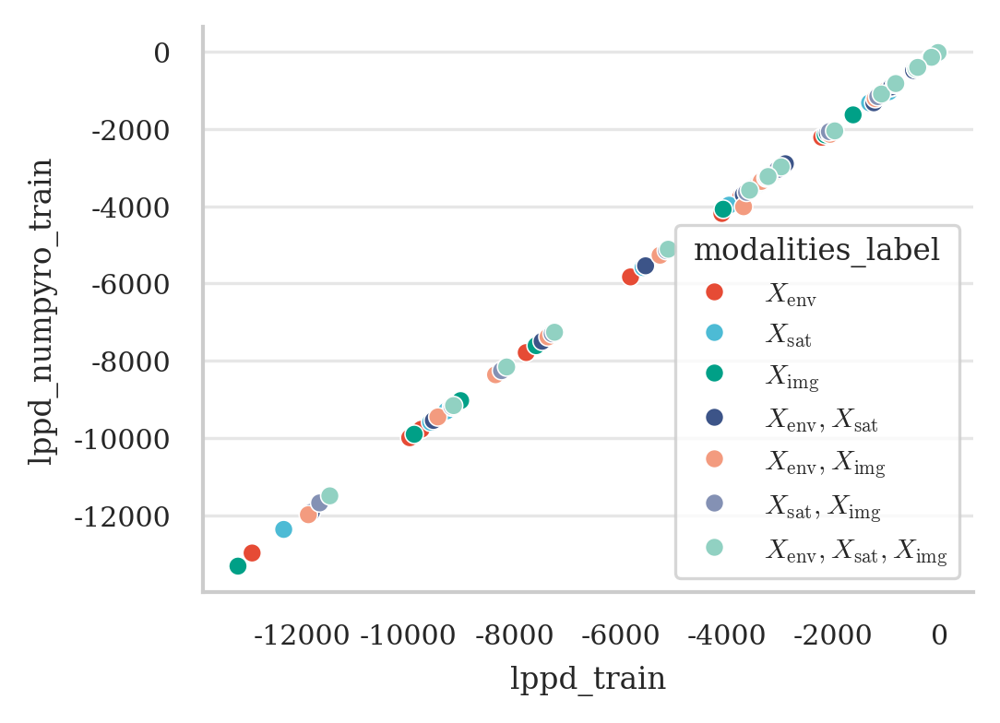

In [10]:
# Just seeing whether manual and numpyro lppd calculations match up
sns.scatterplot(
    data=dfn,
    x="lppd_train",
    y="lppd_numpyro_train",
    hue="modalities_label",
)

In [11]:
df

,taxon_id,scientific_name,common_name,modalities,image_backbone,sat_backbone,limit_to_range,modalities_scaler,modalities_pca,mean_naive_occupancy_train,...,waic_test_waic,waic_test_p_waic,waic_test_lppd,waic_train_waic,waic_train_p_waic,waic_train_lppd,modality_sort_key,modalities_label,modalities_latex_icon,taxon_name
1793,febff896-db40-4ac8-bcfe-5bb99a600950,Odocoileus hemionus,mule deer,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.171047,...,7508.441956,126.826691,-3627.394287,7241.213570,38.693455,-3581.913330,1.00,$X_\text{env}$,\faGlobe[solid],Odocoileus hemionus
1296,b57debc1-dff2-48d3-a400-f2b5021e71b0,Procyon lotor,northern raccoon,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.227420,...,28031.587585,390.114105,-13625.679688,20037.830666,40.400684,-9978.514648,1.00,$X_\text{env}$,\faGlobe[solid],Procyon lotor
302,1db1c6e2-2ea9-45a6-ab69-a730133298eb,Tamias striatus,eastern chipmunk,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.024390,...,8484.503601,257.275238,-3984.976562,2083.889454,28.972986,-1012.971741,1.00,$X_\text{env}$,\faGlobe[solid],Tamias striatus
1225,ac0e8ba7-7261-4d17-8645-11ed3d02165a,Vulpes vulpes,red fox,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.053237,...,8821.431458,222.761139,-4187.954590,6374.411575,33.235817,-3153.969971,1.00,$X_\text{env}$,\faGlobe[solid],Vulpes vulpes
1651,f67c4346-bbbd-43d5-9b19-b541d493019b,Tamiasciurus douglasii,douglas's squirrel,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.009259,...,3357.101318,956.309021,-722.241638,320.843935,14.517106,-145.904861,1.00,$X_\text{env}$,\faGlobe[solid],Tamiasciurus douglasii
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,07843615-e1fc-49d8-9821-fd1d7ff2e773,Dasypus novemcinctus,nine-banded armadillo,"covariates,sat,image",dinov2_vitb14,tessera,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.220657,...,20867.426758,7050.351074,-3383.362305,968.214317,40.608410,-443.498749,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Dasypus novemcinctus
138,07843615-e1fc-49d8-9821-fd1d7ff2e773,Dasypus novemcinctus,nine-banded armadillo,"covariates,sat,image",fully_random,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.220657,...,154711.499023,73734.382812,-3621.366699,888.154507,17.044783,-427.032471,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Dasypus novemcinctus
139,07843615-e1fc-49d8-9821-fd1d7ff2e773,Dasypus novemcinctus,nine-banded armadillo,"covariates,sat,image",megadetector,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.220657,...,14977.830078,4020.824707,-3468.090332,1049.701508,54.750504,-470.100250,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Dasypus novemcinctus
140,07843615-e1fc-49d8-9821-fd1d7ff2e773,Dasypus novemcinctus,nine-banded armadillo,"covariates,sat,image",random_resnet50,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.220657,...,62416.061523,27738.138672,-3469.892090,924.500576,30.379133,-431.871155,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Dasypus novemcinctus


/tmp/ipykernel_2406484/3205242560.py:57: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for legend
2026-02-06 20:27:50,043 INFO maxp pruned
2026-02-06 20:27:50,049 INFO cmap pruned
2026-02-06 20:27:50,053 INFO kern dropped
2026-02-06 20:27:50,054 INFO post pruned
2026-02-06 20:27:50,055 INFO FFTM dropped
2026-02-06 20:27:50,058 INFO GPOS pruned
2026-02-06 20:27:50,059 INFO GSUB pruned
2026-02-06 20:27:50,087 INFO glyf pruned
2026-02-06 20:27:50,088 INFO Added gid0 to subset
2026-02-06 20:27:50,088 INFO Added first four glyphs to subset
2026-02-06 20:27:50,088 INFO Closing glyph list over 'MATH': 39 glyphs before
2026-02-06 20:27:50,089 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'F', 'M', 'P', 'S', 'T', 'a', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
2026-

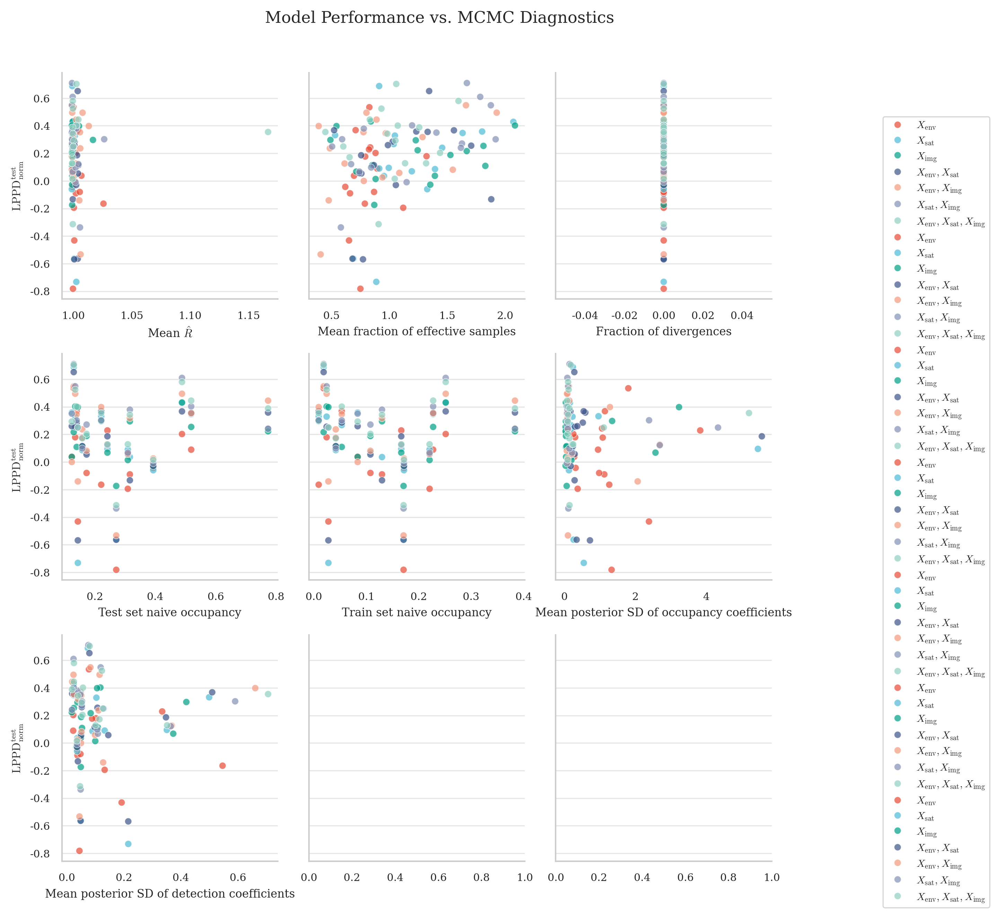

In [12]:
diagnostic_metrics = [
    ("mean_r_hat", r"Mean $\hat{R}$"),
    ("mean_frac_eff", "Mean fraction of effective samples"),
    ("frac_diverging", "Fraction of divergences"),
    ("mean_naive_occupancy_test", "Test set naive occupancy"),
    ("mean_naive_occupancy_train", "Train set naive occupancy"),
    ("mean_beta_sd", "Mean posterior SD of occupancy coefficients"),
    ("mean_alpha_sd", "Mean posterior SD of detection coefficients"),
    ("num_train_sites", "Number of training sites"),
    ("num_test_sites", "Number of test sites"),
]

# Define number of columns and calculate rows needed
n_cols = 3
n_rows = ceil(len(diagnostic_metrics) / n_cols)

fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(fig_page_width, fig_page_width), sharey=True
)
# Flatten axes array for easy iteration
if n_rows > 1:
    axes = axes.flatten()

for i, (metric, label) in enumerate(diagnostic_metrics):

    if metric not in dfn.columns:
        print(f"Warning: Metric '{metric}' not found in DataFrame columns. Skipping.")
        continue

    ax = axes[i]
    sns.scatterplot(
        data=dfn,
        x=metric,
        y="lppd_test_norm",
        hue="modalities_label",
        ax=ax,
        alpha=0.7,
    )
    ax.set_xlabel(label)
    if i % n_cols == 0:
        ax.set_ylabel(metric_labels["lppd_test_norm"])
    else:
        ax.set_ylabel("")

    # Hide legend for all but the last plot to avoid redundancy
    if ax.get_legend() is not None:
        ax.get_legend().remove()

# Move the last legend outside the plot
fig.legend(bbox_to_anchor=(1.0, 0.9), loc="upper left", borderaxespad=0.0)

# Hide any unused subplots
for j in range(len(diagnostic_metrics), len(axes)):
    axes[j].set_visible(False)

fig.suptitle("Model Performance vs. MCMC Diagnostics", y=1.02)
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for legend
plt.savefig(
    f"{figures_dir}/diagnostics_vs_lppd.pdf",
    bbox_inches="tight",
    dpi=300,
    transparent=True,
)
plt.show()
plt.close()

/tmp/ipykernel_2406484/379697420.py:56: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


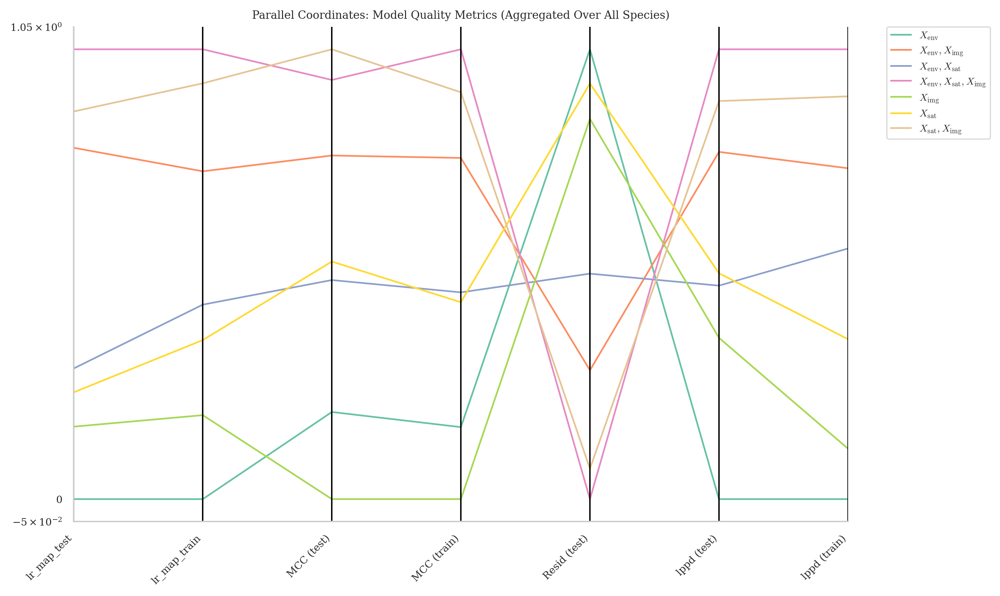

In [13]:
from pandas.plotting import parallel_coordinates

# Aggregate relevant metrics by model over all species
df_agg = (
    dfn.groupby("modalities_label")[
        [
            "lr_map_test",
            "lr_map_train",
            "lr_mcc_test",
            "lr_mcc_train",
            "mean_absolute_residuals_test_occ",
            "lppd_test",
            "lppd_train",
            "waic_train",
        ]
    ]
    .mean(numeric_only=True)
    .reset_index()
)

# Rename columns for clarity in the plot
df_agg = df_agg.rename(
    columns={
        "map_test_lr": "AP (test)",
        "map_train_lr": "AP (train)",
        "lr_mcc_test": "MCC (test)",
        "lr_mcc_train": "MCC (train)",
        "mean_absolute_residuals_test_occ": "Resid (test)",
        "lppd_test": "lppd (test)",
        "lppd_train": "lppd (train)",
        "waic_train": "WAIC (train)",
    }
)

# Scale all metric columns (except the 'model' identifier) for parallel coordinates
metrics_cols = df_agg.columns.drop("modalities_label")

# If scikit-learn is available, you can use MinMaxScaler for clearer separation:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_scaled = df_agg.copy()
for col in metrics_cols:
    df_scaled[col] = scaler.fit_transform(df_scaled[[col]])
# df_scaled.insert(0, "modalities_label", df_agg["modalities_label"])


plt.figure(figsize=(10, 6))
parallel_coordinates(
    df_scaled, class_column="modalities_label", color=sns.color_palette("Set2")
)
plt.xticks(rotation=45, ha="right")
plt.yscale("symlog")
plt.title("Parallel Coordinates: Model Quality Metrics (Aggregated Over All Species)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0)
plt.tight_layout()
plt.show()

/tmp/ipykernel_2406484/363101211.py:37: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:51,453 INFO maxp pruned
2026-02-06 20:27:51,456 INFO cmap pruned
2026-02-06 20:27:51,457 INFO kern dropped
2026-02-06 20:27:51,457 INFO post pruned
2026-02-06 20:27:51,457 INFO FFTM dropped
2026-02-06 20:27:51,458 INFO GPOS pruned
2026-02-06 20:27:51,459 INFO GSUB pruned
2026-02-06 20:27:51,461 INFO glyf pruned
2026-02-06 20:27:51,462 INFO Added gid0 to subset
2026-02-06 20:27:51,462 INFO Added first four glyphs to subset
2026-02-06 20:27:51,462 INFO Closing glyph list over 'MATH': 38 glyphs before
2026-02-06 20:27:51,463 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 'f', 'five', 'g', 'h', 'i', 'j', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'v', 'x', 'y', 'zero']
2026-02-06 20:27:51,463 INFO Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 38, 39, 47, 50, 51, 

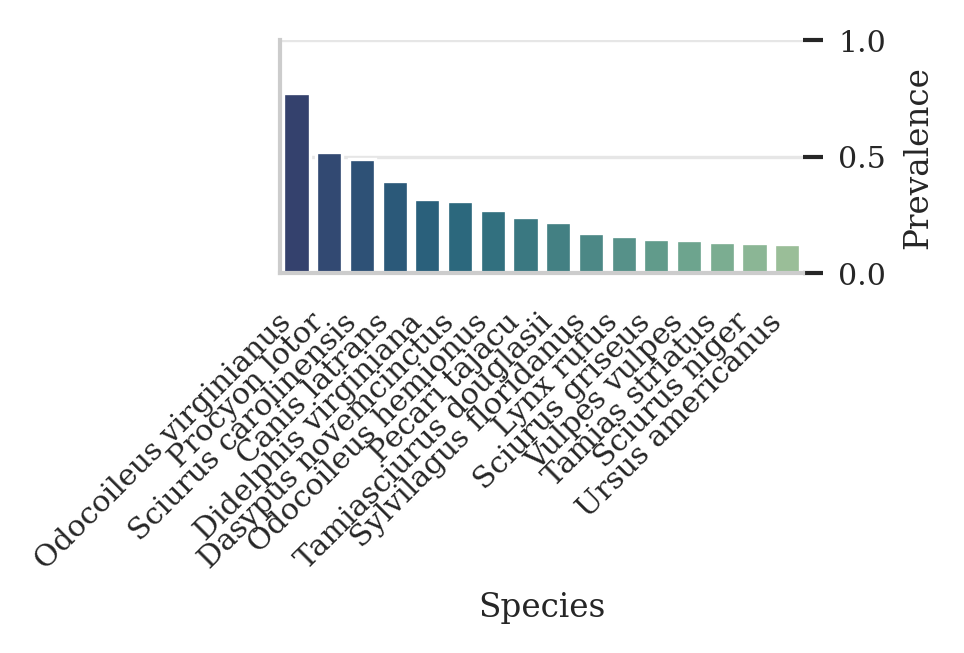

In [14]:
# Compute mean naive occupancy (test) by species
occ_df = (
    dfn.groupby("taxon_name")
    .agg({"mean_naive_occupancy_test": "mean", "taxon_color": "first"})
    .reset_index()
)

# Sort by occupancy for plotting
occ_df = occ_df.sort_values("mean_naive_occupancy_test", ascending=False)

# Plot mean naive occupancy for each species
# Create a color map from taxon name to color
color_map = pd.Series(occ_df.taxon_color.values, index=occ_df.taxon_name).to_dict()

# set size of the figure
plt.figure(figsize=(fig_column_width / 1.25, fig_column_width))
sns.barplot(
    data=occ_df,
    x="taxon_name",
    y="mean_naive_occupancy_test",
    hue="taxon_name",
    palette=color_map,
    legend=False,
)

plt.xticks(rotation=45, ha="right")

ax = plt.gca()
ax.set_box_aspect(1 / 2.25)
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")

plt.ylim(0, 1)

plt.xlabel("Species")
plt.ylabel("Prevalence")
plt.tight_layout()
plt.savefig(
    f"{figures_dir}/species_mean_naive_occupancy.pdf",
    bbox_inches="tight",
    dpi=300,
    transparent=True,
)
plt.show()
plt.close()

/tmp/ipykernel_2406484/3550882375.py:3: FutureWarning: Logical ops (and, or, xor) between Pandas objects and dtype-less sequences (e.g. list, tuple) are deprecated and will raise in a future version. Wrap the object in a Series, Index, or np.array before operating instead.
  (df["sat_backbone"] == default_sat_backbone)
/tmp/ipykernel_2406484/3550882375.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


/tmp/ipykernel_2406484/3550882375.py:50: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:51,971 INFO maxp pruned
2026-02-06 20:27:51,974 INFO cmap pruned
2026-02-06 20:27:51,975 INFO kern dropped
2026-02-06 20:27:51,975 INFO post pruned
2026-02-06 20:27:51,976 INFO FFTM dropped
2026-02-06 20:27:51,976 INFO GPOS pruned
2026-02-06 20:27:51,977 INFO GSUB pruned
2026-02-06 20:27:51,980 INFO glyf pruned
2026-02-06 20:27:51,981 INFO Added gid0 to subset
2026-02-06 20:27:51,981 INFO Added first four glyphs to subset
2026-02-06 20:27:51,981 INFO Closing glyph list over 'MATH': 45 glyphs before
2026-02-06 20:27:51,981 INFO Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'G', 'I', 'L', 'M', 'N', 'O', 'P', 'S', 'T', 'V', 'a', 'b', 'c', 'e', 'five', 'four', 'g', 'hyphen', 'i', 'k', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'slash', 'space', 't', 'two', 'u', 'v', 'zero']
2026-02-06 20:27:51,

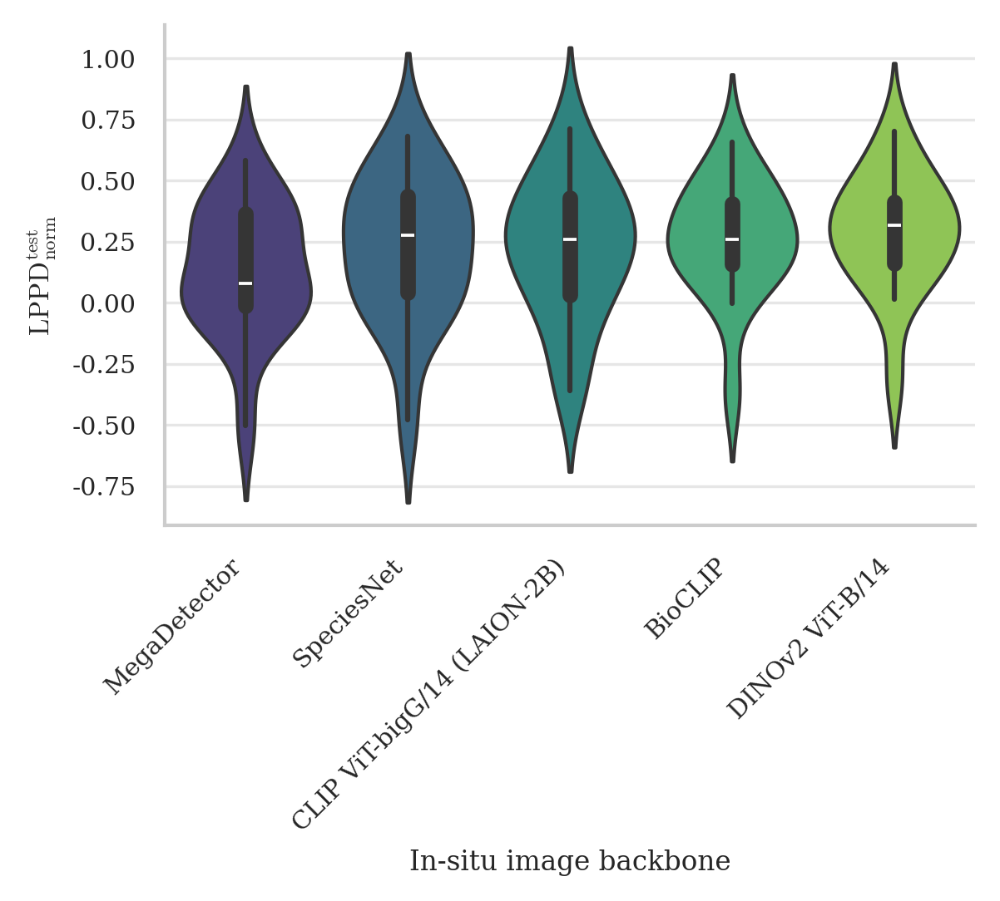

LaTeX table saved to /data/vision/beery/scratch/timm/multimodal_occupancy/figures/lppd_by_ground_model_species.tex
\begin{tabular}{lrrrrr}
\toprule
 & DINOv2 ViT-B/14 & BioCLIP & CLIP ViT-bigG/14 (LAION-2B) & SpeciesNet & MegaDetector \\
\midrule
Sciurus niger & 0.70 & 0.66 & \bfseries 0.71 & 0.68 & 0.58 \\
Sciurus carolinensis & \bfseries 0.58 & 0.52 & 0.57 & 0.56 & 0.40 \\
Procyon lotor & \bfseries 0.44 & 0.43 & 0.43 & 0.43 & 0.36 \\
Odocoileus virginianus & 0.39 & 0.40 & \bfseries 0.51 & 0.44 & 0.31 \\
Vulpes vulpes & 0.40 & 0.39 & \bfseries 0.43 & 0.35 & 0.38 \\
Tamias striatus & \bfseries 0.52 & 0.49 & 0.23 & -0.08 & 0.38 \\
Ursus americanus & 0.29 & \bfseries 0.29 & 0.25 & 0.27 & 0.24 \\
Didelphis virginiana & \bfseries 0.34 & 0.22 & 0.31 & 0.31 & 0.04 \\
Tamiasciurus douglasii & \bfseries 0.35 & 0.30 & 0.27 & 0.28 & -0.12 \\
Sciurus griseus & 0.25 & 0.21 & -0.36 & \bfseries 0.53 & -0.04 \\
Lynx rufus & 0.17 & \bfseries 0.19 & 0.04 & 0.08 & 0.12 \\
Sylvilagus floridanus & \bfseri

,DINOv2 ViT-B/14,BioCLIP,CLIP ViT-bigG/14 (LAION-2B),SpeciesNet,MegaDetector
Sciurus niger,0.70,0.66,0.71,0.68,0.58
Sciurus carolinensis,0.58,0.52,0.57,0.56,0.40
Procyon lotor,0.44,0.43,0.43,0.43,0.36
Odocoileus virginianus,0.39,0.40,0.51,0.44,0.31
Vulpes vulpes,0.40,0.39,0.43,0.35,0.38
Tamias striatus,0.52,0.49,0.23,-0.08,0.38
Ursus americanus,0.29,0.29,0.25,0.27,0.24
Didelphis virginiana,0.34,0.22,0.31,0.31,0.04
Tamiasciurus douglasii,0.35,0.30,0.27,0.28,-0.12
Sciurus griseus,0.25,0.21,-0.36,0.53,-0.04


In [15]:
# Filter for models that include covariates and a satellite component
df_img_lppd = df[
    (df["sat_backbone"] == default_sat_backbone)
    & (~df["image_backbone"].isin(["fully_random", "random_resnet50"]))
    & (
        [
            set(m.split(","))
            in [
                set(["covariates", "sat_feature", "image"]),
                set(["covariates", "sat", "image"]),
            ]
            for m in df["modalities"]
        ]
    )
    # (df["modalities"].isin(["covariates,sat", "covariates,sat_feature"]))
].copy()


# Create a more descriptive label for the models
def create_model_label(row):
    return f"{img_model_labels[row['image_backbone']]}"


df_img_lppd["model_label"] = df_img_lppd.apply(create_model_label, axis=1)

# Create the bar plot
plt.figure(figsize=(fig_column_width, 100))
sns.violinplot(
    data=df_img_lppd,
    x="model_label",
    y="lppd_test_norm",
    palette="viridis",
    order=df_img_lppd.groupby("model_label")["lppd_test_norm"]
    .mean()
    .sort_values()
    .index,
    # errorbar=('ci', 95)
)

plt.gca().set_box_aspect(1 / golden_ratio)

# plt.yscale('symlog')

# plt.ylim(0, 1)

# Customize the plot
plt.xticks(rotation=45, ha="right")
plt.xlabel("In-situ image backbone")
plt.ylabel(r"$\text{LPPD}_\text{norm}^\text{test}$")
plt.tight_layout()

# Save and show the plot
plt.savefig(
    f"{figures_dir}/lppd_by_ground_model.pdf",
    bbox_inches="tight",
    dpi=300,
    transparent=True,
)
plt.show()
plt.close()


model_order = (
    df_img_lppd.groupby("model_label")["lppd_test_norm"]
    .mean()
    .sort_values(ascending=False)
    .index
)

lppd_pivot_table = df_img_lppd.pivot_table(
    index="taxon_name", columns="model_label", values="lppd_test_norm"
).reindex(columns=model_order)

# Best-performing model (highest mean across species)
best_model = model_order[0]


def mean_ci_latex(row):
    data = row.dropna()
    n = len(data)
    if n == 0:
        return "-", np.nan
    if n == 1:
        value = float(data.iloc[0])
        return f"{value:.2f}", value
    mean = float(np.mean(data))
    sem = stats.sem(data)
    ci = float(sem * stats.t.ppf((1 + 0.95) / 2.0, n - 1))
    return f"{mean:.2f} $\\pm$ {ci:.2f}", mean


# Sort species (rows) by their mean performance across models
row_means = lppd_pivot_table.mean(axis=1, skipna=True)
lppd_pivot_table = lppd_pivot_table.loc[row_means.sort_values(ascending=False).index]

# Compute per-model mean (95% CI) across species and add as a bottom row
col_summary = lppd_pivot_table.apply(mean_ci_latex, axis=0)
mean_row_display = {col: col_summary[col][0] for col in lppd_pivot_table.columns}
lppd_pivot_table.loc["Mean (95% CI)"] = mean_row_display

lppd_pivot_table.index.name = None
lppd_pivot_table.columns.name = None

value_columns = list(lppd_pivot_table.columns)
data_rows = lppd_pivot_table.index[lppd_pivot_table.index != "Mean (95% CI)"]

styled_table = lppd_pivot_table.style.format(
    "{:.2f}", na_rep="-", subset=(data_rows, value_columns)
).highlight_max(axis=1, props="font-weight: bold;", subset=(data_rows, value_columns))

latex_output = styled_table.to_latex(
    hrules=True,
    convert_css=True,
    column_format="l" + "r" * len(value_columns),
)

latex_output = latex_output.replace("taxon_name", "").replace("model_label", "")

latex_output = latex_output.replace("%", "\\%")

table_path = f"{figures_dir}/lppd_by_ground_model_species.tex"
with open(table_path, "w") as f:
    f.write(latex_output)

print(f"LaTeX table saved to {table_path}")
print(latex_output)

styled_table

/tmp/ipykernel_2406484/1088558121.py:3: FutureWarning: Logical ops (and, or, xor) between Pandas objects and dtype-less sequences (e.g. list, tuple) are deprecated and will raise in a future version. Wrap the object in a Series, Index, or np.array before operating instead.
  (df["image_backbone"] == default_image_backbone)
/tmp/ipykernel_2406484/1088558121.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2406484/1088558121.py:50: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:52,808 INFO maxp pruned
2026-02-06 20:27:52,813 INFO cmap pruned
2026-02-06 20:27:52,813 INFO kern dropped
2026-02-06 20:27:52,813 INFO post pruned
2026-02-06 20:27:52,814 INFO FFTM dropped
2026-02-06 20:27:52,814 INFO GPOS pruned
2026-02-06 20:27:52,815 INFO GSUB pruned
2026-02-06 20:27:52,818 INFO g

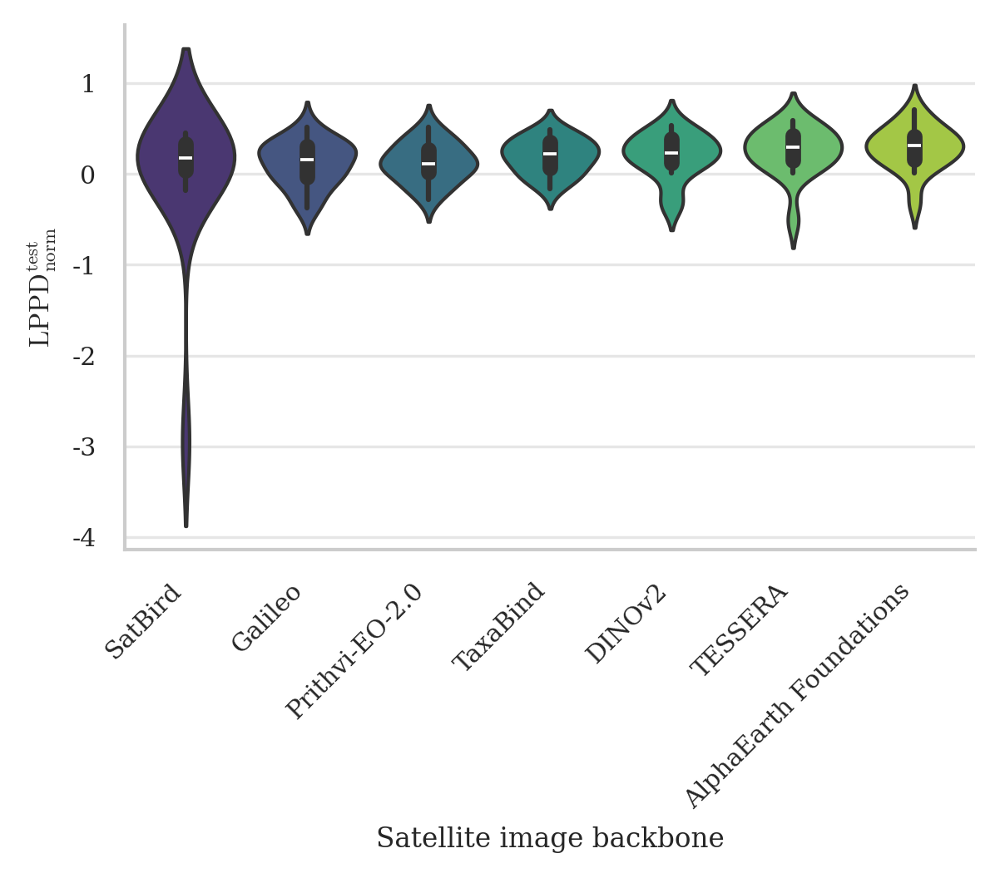

LaTeX table saved to /data/vision/beery/scratch/timm/multimodal_occupancy/figures/lppd_by_satellite_model_species.tex
\begin{tabular}{lrrrrrrr}
\toprule
 & AlphaEarth Foundations & TESSERA & DINOv2 & TaxaBind & Prithvi-EO-2.0 & Galileo & SatBird \\
\midrule
Sciurus carolinensis & 0.58 & \bfseries 0.59 & 0.53 & 0.48 & 0.51 & 0.51 & 0.45 \\
Sciurus niger & \bfseries 0.70 & 0.53 & 0.42 & 0.46 & 0.33 & 0.32 & 0.23 \\
Procyon lotor & \bfseries 0.44 & 0.37 & 0.38 & 0.37 & 0.34 & 0.35 & 0.32 \\
Odocoileus virginianus & 0.39 & 0.42 & \bfseries 0.48 & 0.38 & 0.12 & 0.33 & 0.43 \\
Vulpes vulpes & 0.40 & 0.42 & 0.40 & 0.34 & 0.22 & 0.29 & \bfseries 0.44 \\
Tamiasciurus douglasii & 0.35 & 0.29 & 0.26 & 0.28 & 0.05 & 0.21 & \bfseries 0.36 \\
Didelphis virginiana & \bfseries 0.34 & 0.31 & 0.30 & 0.22 & 0.13 & 0.21 & 0.12 \\
Tamias striatus & 0.52 & \bfseries 0.53 & -0.30 & 0.25 & 0.25 & -0.02 & 0.21 \\
Ursus americanus & \bfseries 0.29 & 0.16 & 0.26 & 0.22 & 0.09 & 0.07 & 0.14 \\
Lynx rufus & \bfser

,AlphaEarth Foundations,TESSERA,DINOv2,TaxaBind,Prithvi-EO-2.0,Galileo,SatBird
Sciurus carolinensis,0.58,0.59,0.53,0.48,0.51,0.51,0.45
Sciurus niger,0.70,0.53,0.42,0.46,0.33,0.32,0.23
Procyon lotor,0.44,0.37,0.38,0.37,0.34,0.35,0.32
Odocoileus virginianus,0.39,0.42,0.48,0.38,0.12,0.33,0.43
Vulpes vulpes,0.40,0.42,0.40,0.34,0.22,0.29,0.44
Tamiasciurus douglasii,0.35,0.29,0.26,0.28,0.05,0.21,0.36
Didelphis virginiana,0.34,0.31,0.30,0.22,0.13,0.21,0.12
Tamias striatus,0.52,0.53,-0.30,0.25,0.25,-0.02,0.21
Ursus americanus,0.29,0.16,0.26,0.22,0.09,0.07,0.14
Lynx rufus,0.17,0.17,0.14,0.09,0.06,0.10,0.14


In [16]:
# Filter for models that include covariates and a satellite component
df_sat_lppd = df[
    (df["image_backbone"] == default_image_backbone)
    & (
        [
            set(m.split(","))
            in [
                set(["covariates", "sat_feature", "image"]),
                set(["covariates", "sat", "image"]),
            ]
            for m in df["modalities"]
        ]
    )
    # (df["modalities"].isin(["covariates,sat", "covariates,sat_feature"]))
].copy()


# Create a more descriptive label for the models
def create_model_label(row):
    modality_type = "satf" if "sat_feature" in row["modalities"] else "sat"
    return f"{sat_model_labels[row['sat_backbone']]}"


df_sat_lppd["model_label"] = df_sat_lppd.apply(create_model_label, axis=1)

# Create the bar plot
plt.figure(figsize=(fig_column_width, 100))
sns.violinplot(
    data=df_sat_lppd,
    x="model_label",
    y="lppd_test_norm",
    palette="viridis",
    order=df_sat_lppd.groupby("model_label")["lppd_test_norm"]
    .mean()
    .sort_values()
    .index,
    # errorbar=('ci', 95)
)

plt.gca().set_box_aspect(1 / golden_ratio)

# plt.yscale('symlog')

# plt.ylim(0, 1)

# Customize the plot
plt.xticks(rotation=45, ha="right")
plt.xlabel("Satellite image backbone")
plt.ylabel(r"$\text{LPPD}_\text{norm}^\text{test}$")
plt.tight_layout()

# Save and show the plot
plt.savefig(
    f"{figures_dir}/lppd_norm_by_satellite_model.pdf",
    bbox_inches="tight",
    dpi=300,
    transparent=True,
)
plt.show()
plt.close()


model_order = (
    df_sat_lppd.groupby("model_label")["lppd_test_norm"]
    .mean()
    .sort_values(ascending=False)
    .index
)

lppd_pivot_table = df_sat_lppd.pivot_table(
    index="taxon_name", columns="model_label", values="lppd_test_norm"
).reindex(columns=model_order)

# Best-performing model (highest mean across species)
best_model = model_order[0]


def mean_ci_latex(row):
    data = row.dropna()
    n = len(data)
    if n == 0:
        return "-", np.nan
    if n == 1:
        value = float(data.iloc[0])
        return f"{value:.2f}", value
    mean = float(np.mean(data))
    sem = stats.sem(data)
    ci = float(sem * stats.t.ppf((1 + 0.95) / 2.0, n - 1))
    return f"{mean:.2f} $\\pm$ {ci:.2f}", mean


# Sort species (rows) by their mean performance across models
row_means = lppd_pivot_table.mean(axis=1, skipna=True)
lppd_pivot_table = lppd_pivot_table.loc[row_means.sort_values(ascending=False).index]

# Compute per-model mean (95% CI) across species and add as a bottom row
col_summary = lppd_pivot_table.apply(mean_ci_latex, axis=0)
mean_row_display = {col: col_summary[col][0] for col in lppd_pivot_table.columns}
lppd_pivot_table.loc["Mean (95% CI)"] = mean_row_display

lppd_pivot_table.index.name = None
lppd_pivot_table.columns.name = None

value_columns = list(lppd_pivot_table.columns)
data_rows = lppd_pivot_table.index[lppd_pivot_table.index != "Mean (95% CI)"]

styled_table = lppd_pivot_table.style.format(
    "{:.2f}", na_rep="-", subset=(data_rows, value_columns)
).highlight_max(axis=1, props="font-weight: bold;", subset=(data_rows, value_columns))

latex_output = styled_table.to_latex(
    hrules=True,
    convert_css=True,
    column_format="l" + "r" * len(value_columns),
)

latex_output = latex_output.replace("taxon_name", "").replace("model_label", "")

latex_output = latex_output.replace("%", "\\%")

table_path = f"{figures_dir}/lppd_by_satellite_model_species.tex"
with open(table_path, "w") as f:
    f.write(latex_output)

print(f"LaTeX table saved to {table_path}")
print(latex_output)

styled_table

\begin{tabular}{lrrrrrrr}
\toprule
 & \faGlobe[solid] & \faSatellite[solid] & \faCamera[solid] & \faGlobe[solid]$+$\faSatellite[solid] & \faGlobe[solid]$+$\faCamera[solid] & \faSatellite[solid]$+$\faCamera[solid] & \faGlobe[solid]$+$\faSatellite[solid]$+$\faCamera[solid] \\
\midrule
Canis latrans &{-0.04} &{-0.06} &{-0.03} &{-0.03} &{\textbf{0.03}} &{-0.01} &{0.02} \\
Dasypus novemcinctus &{-0.19} &{0.09} &{0.01} &{0.06} &{0.06} &{0.07} &{\textbf{0.13}} \\
Didelphis virginiana &{-0.09} &{0.04} &{0.29} &{-0.13} &{0.32} &{\textbf{0.38}} &{0.34} \\
Lynx rufus &{0.18} &{0.09} &{0.11} &{0.11} &{\textbf{0.24}} &{0.10} &{0.17} \\
Odocoileus hemionus &{-0.78} &{-0.56} &{\textbf{-0.17}} &{-0.56} &{-0.53} &{-0.34} &{-0.31} \\
Odocoileus virginianus &{0.24} &{0.24} &{0.22} &{0.36} &{\textbf{0.44}} &{0.24} &{0.39} \\
Pecari tajacu &{\textbf{0.23}} &{0.09} &{0.07} &{0.19} &{0.13} &{0.12} &{0.13} \\
Procyon lotor &{0.09} &{0.35} &{0.25} &{0.36} &{0.35} &{0.40} &{\textbf{0.44}} \\
Sciurus carolinensi

/tmp/ipykernel_2406484/1337369770.py:431: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.99], pad=0.4)
/tmp/ipykernel_2406484/1337369770.py:431: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0, 1, 0.99], pad=0.4)
2026-02-06 20:27:53,896 INFO maxp pruned
2026-02-06 20:27:53,900 INFO cmap pruned
2026-02-06 20:27:53,900 INFO kern dropped
2026-02-06 20:27:53,901 INFO post pruned
2026-02-06 20:27:53,901 INFO FFTM dropped
2026-02-06 20:27:53,902 INFO GPOS pruned
2026-02-06 20:27:53,906 INFO GSUB pruned
2026-02-06 20:27:54,207 INFO glyf pruned
2026-02-06 20:27:54,208 INFO Added gid0 to subset
2026-02-06 20:27:54,208 INFO Added first four glyphs to subset
2026-02-06 20:27:54,209 INFO Closing glyph list over 'GSUB': 21 glyphs before
2026-02-06 20:27:54,209 INFO Glyph names: ['.notdef', '.null', 'a', 'asterisk', 'b', 'c', 'eight', 'five', 'four', 'hyphen', 'nonm

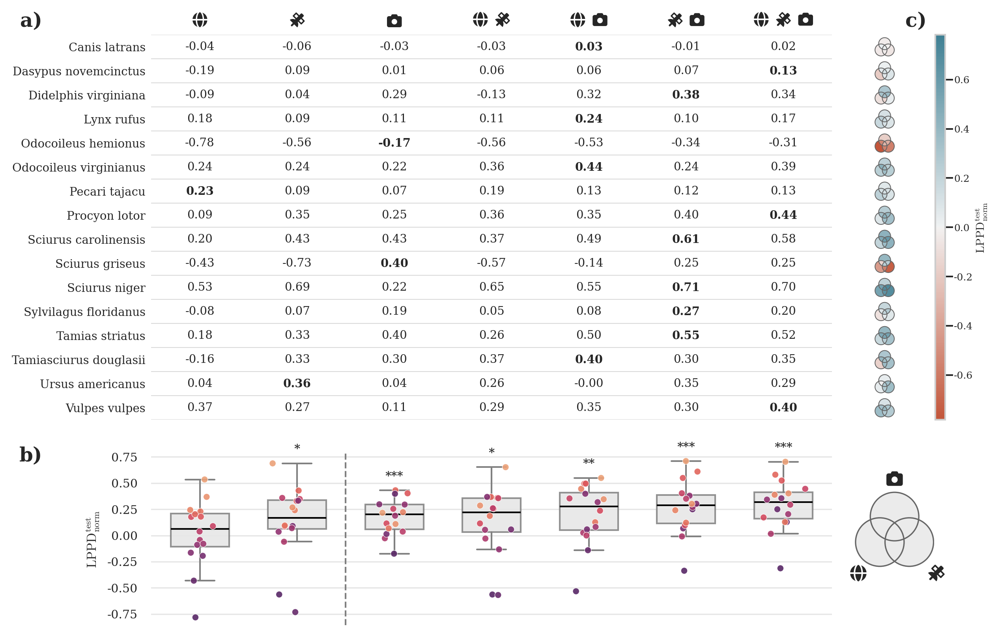

Combined LPPD table saved to /data/vision/beery/scratch/timm/multimodal_occupancy/figures/lppd_norm_by_species_combined.pdf


modalities_latex_icon,\faGlobe[solid],\faSatellite[solid],\faCamera[solid],\faGlobe[solid]$+$\faSatellite[solid],\faGlobe[solid]$+$\faCamera[solid],\faSatellite[solid]$+$\faCamera[solid],\faGlobe[solid]$+$\faSatellite[solid]$+$\faCamera[solid]
taxon_name,,,,,,,
Canis latrans,-0.04,-0.06,-0.03,-0.03,0.03,-0.01,0.02
Dasypus novemcinctus,-0.19,0.09,0.01,0.06,0.06,0.07,0.13
Didelphis virginiana,-0.09,0.04,0.29,-0.13,0.32,0.38,0.34
Lynx rufus,0.18,0.09,0.11,0.11,0.24,0.10,0.17
Odocoileus hemionus,-0.78,-0.56,-0.17,-0.56,-0.53,-0.34,-0.31
Odocoileus virginianus,0.24,0.24,0.22,0.36,0.44,0.24,0.39
Pecari tajacu,0.23,0.09,0.07,0.19,0.13,0.12,0.13
Procyon lotor,0.09,0.35,0.25,0.36,0.35,0.40,0.44
Sciurus carolinensis,0.20,0.43,0.43,0.37,0.49,0.61,0.58


In [17]:
deviance_pivot = dfn.copy()

# # wrap each icon in multicol
# deviance_pivot["modalities_latex_icon"] = dfn["modalities_latex_icon"].apply(
#     lambda x: r"\multicolumn{1}{c}{" + x + r"}"
# )


# Create pivot table with modalities as columns and species as rows
deviance_pivot = deviance_pivot.pivot_table(
    index="taxon_name",
    columns="modalities_latex_icon",
    values="lppd_test_norm",
    aggfunc="mean",
)

# Get the sorted list of columns to maintain order
sorted_columns = (
    dfn.groupby("modalities_latex_icon")["modality_sort_key"].mean().sort_values().index
)

# Reindex the pivot table columns to match the desired order
deviance_pivot = deviance_pivot.reindex(columns=sorted_columns)


# TODO: rename
deviance_improvement = deviance_pivot

# Create a red-to-green colormap
cmap = sns.diverging_palette(10, 130, as_cmap=True, center="light")


def highlight_max(s):
    is_max = s == s.max()
    return ["font-weight: bold" if v else "" for v in is_max]


# Determine the range for color mapping
vmin = 0
vmax = 1
# Use a symmetric range around 0 for the colormap
abs_max = max(abs(vmin), abs(vmax))
norm = plt.Normalize(-abs_max, abs_max)
enable_color = False


def color_text(val):
    if pd.isna(val):
        return ""
    # Normalize value and get color from colormap
    rgba = cmap(norm(val))
    # Convert RGBA to CSS color string
    return f"color: rgb({int(rgba[0]*255)}, {int(rgba[1]*255)}, {int(rgba[2]*255)})"


if enable_color:
    # Apply styling: color gradient for values, bold for max value, and format numbers
    styled_df = (
        deviance_improvement.style.applymap(color_text)
        .apply(highlight_max, axis=1)
        .format("{:.2f}", na_rep="-")
    )
else:
    styled_df = deviance_improvement.style.apply(highlight_max, axis=1).format(
        "{:.2f}", na_rep="-"
    )


# Create LaTeX table
latex_deviance_table = styled_df.to_latex(
    # na_rep='-',
    column_format="l" + "r" * len(deviance_improvement.columns),
    # caption='Normalized LPPD improvement over covariates-only baseline for different modality combinations across species. Higher values indicate better performance. Best results per species are bolded. Positive (green) values indicate improvement, negative (red) values indicate degradation.',
    # label='tab:lppd_improvement_by_species',
    position="!htbp",
    hrules=True,
)


def convert_colorrgb_to_textcolor(text):
    # Handles optional \font-weightbold
    pattern = (
        r"\\colorrgb\((\d+),\s*(\d+),\s*(\d+)\)(?:\s*\\font-weightbold)?\s*(-?[0-9.]+)"
    )

    def replacer(match):
        r, g, b, value = match.group(1), match.group(2), match.group(3), match.group(4)
        if "\\font-weightbold" in match.group(0):
            return f"\\cellcolor[RGB]{{{r}, {g}, {b}}}{{\\textbf{{{value}}}}}"
        else:
            return f"\\cellcolor[RGB]{{{r}, {g}, {b}}}{{{value}}}"

    return re.sub(pattern, replacer, text)


def convert_bold(text):
    # Handles optional \font-weightbold
    pattern = r"(?:\s*\\font-weightbold)?\s*(-?[0-9.]+)"

    def replacer(match):
        value = match.group(1)
        if "\\font-weightbold" in match.group(0):
            return f"{{\\textbf{{{value}}}}}"
        else:
            return f"{{{value}}}"

    return re.sub(pattern, replacer, text)


if enable_color:
    latex_deviance_table = convert_colorrgb_to_textcolor(latex_deviance_table)
else:
    latex_deviance_table = convert_bold(latex_deviance_table)

latex_deviance_table = latex_deviance_table.replace("modalities_latex_icon", "")
latex_deviance_table = "\n".join(
    [
        l
        for l in latex_deviance_table.splitlines()
        if not l.startswith("taxon_name")
        and not l.startswith(r"\begin{table}")
        and not l.startswith(r"\end{table}")
    ]
)

with open(f"{figures_dir}/lppd_norm_by_species.tex", "w") as f:
    f.write(latex_deviance_table)

print(latex_deviance_table)


from shapely.geometry import Point
from shapely.ops import unary_union
from matplotlib.patches import Polygon, Circle
from matplotlib.transforms import Affine2D
from scipy import stats

# Build a combined table + venn indicator + boxplot figure
base_modalities = ["env", "sat", "img"]
modality_alias = {
    "covariates": "env",
    "sat": "sat",
    "sat_feature": "sat",
    "image": "img",
}


def modalities_to_key(modalities_str):
    if pd.isna(modalities_str):
        return None
    ordered = []
    for key in modalities_str.split(","):
        alias = modality_alias.get(key, key)
        if alias in base_modalities and alias not in ordered:
            ordered.append(alias)
    return "+".join([m for m in base_modalities if m in ordered])


def modalities_to_icons(modalities_str):
    if pd.isna(modalities_str):
        return ""
    icons = [fa_icon_map.get(key, "") for key in modalities_str.split(",")]
    icons = [icon for icon in icons if icon]
    if len(icons) <= 1:
        return icons[0] if icons else modalities_str
    # FIX 1: Use space instead of small plus sign which is missing from Font Awesome
    return " ".join(icons)


icon_to_modalities = (
    dfn.groupby("modalities_latex_icon")["modalities"].first().reindex(sorted_columns)
)
column_icons = []
for col in sorted_columns:
    modalities_str = icon_to_modalities.get(col)
    column_icons.append(modalities_to_icons(modalities_str) or col)

try:
    fa_font = get_fontawesome_font()
except Exception:
    fa_font = None

if fa_font is None:
    column_icons = [
        modalities_to_key(icon_to_modalities.get(col)) or col for col in sorted_columns
    ]

venn_order = [
    "env",
    "sat",
    "img",
    "env+sat",
    "env+img",
    "sat+img",
    "env+sat+img",
]

venn_df = (
    dfn.assign(mod_key=dfn["modalities"].apply(modalities_to_key))
    .groupby(["taxon_name", "mod_key"])["lppd_test_norm"]
    .mean()
    .unstack()
    .reindex(index=deviance_improvement.index, columns=venn_order)
)

abs_max = np.nanmax(np.abs(deviance_improvement.values))
if not np.isfinite(abs_max) or abs_max == 0:
    abs_max = 1.0
venn_norm = plt.Normalize(-abs_max, abs_max)
venn_cmap = sns.diverging_palette(20, 220, as_cmap=True, center="light")


# Precompute venn regions in local coordinates
venn_distance = 0.85
venn_radius = 0.7
venn_centers = {
    "env": (0.0, 0.0),
    "sat": (venn_distance, 0.0),
    "img": (venn_distance / 2.0, venn_distance * np.sqrt(3) / 2.0),
}

venn_circles = {
    key: Point(center).buffer(venn_radius, resolution=64)
    for key, center in venn_centers.items()
}
venn_union = unary_union(list(venn_circles.values()))
venn_bounds = venn_union.bounds

venn_regions = {
    "env": venn_circles["env"].difference(
        venn_circles["sat"].union(venn_circles["img"])
    ),
    "sat": venn_circles["sat"].difference(
        venn_circles["env"].union(venn_circles["img"])
    ),
    "img": venn_circles["img"].difference(
        venn_circles["env"].union(venn_circles["sat"])
    ),
    "env+sat": venn_circles["env"]
    .intersection(venn_circles["sat"])
    .difference(venn_circles["img"]),
    "env+img": venn_circles["env"]
    .intersection(venn_circles["img"])
    .difference(venn_circles["sat"]),
    "sat+img": venn_circles["sat"]
    .intersection(venn_circles["img"])
    .difference(venn_circles["env"]),
    "env+sat+img": venn_circles["env"]
    .intersection(venn_circles["sat"])
    .intersection(venn_circles["img"]),
}


def add_geometry(ax, geom, facecolor, edgecolor="none", lw=0.5, transform=None):
    if geom.is_empty:
        return
    if geom.geom_type == "Polygon":
        coords = np.asarray(geom.exterior.coords)
        patch = Polygon(
            coords,
            closed=True,
            facecolor=facecolor,
            edgecolor=edgecolor,
            linewidth=lw,
        )
        if transform is not None:
            patch.set_transform(transform + ax.transAxes)
        ax.add_patch(patch)
    elif geom.geom_type == "MultiPolygon":
        for part in geom.geoms:
            add_geometry(
                ax,
                part,
                facecolor=facecolor,
                edgecolor=edgecolor,
                lw=lw,
                transform=transform,
            )


def draw_venn_row(ax, y_center, values, scale_x, scale_y, x_center=0.5):
    minx, miny, maxx, maxy = venn_bounds
    center_x = (minx + maxx) / 2.0
    center_y = (miny + maxy) / 2.0
    tx = x_center - center_x * scale_x
    ty = y_center - center_y * scale_y
    transform = Affine2D().scale(scale_x, scale_y).translate(tx, ty)

    for key, geom in venn_regions.items():
        value = values.get(key)
        if value is None or pd.isna(value):
            facecolor = (1, 1, 1, 0)
        else:
            facecolor = venn_cmap(venn_norm(value))
        add_geometry(
            ax,
            geom,
            facecolor=facecolor,
            edgecolor="none",
            transform=transform,
        )

    for center in venn_centers.values():
        outline = Circle(
            center,
            venn_radius,
            facecolor="none",
            edgecolor="0.4",
            linewidth=0.5,
        )
        outline.set_transform(transform + ax.transAxes)
        ax.add_patch(outline)


# Layout: table + venn on top, boxplot below
row_labels = deviance_improvement.index.tolist()
col_labels = sorted_columns
nrows, ncols = deviance_improvement.shape

row_height = 0.28
table_height = max(2.0, nrows * row_height)
boxplot_height = 2.0  # Increased to make room for significance symbols

fig_width = fig_page_width
fig_height = table_height + boxplot_height

fig = plt.figure(figsize=(fig_width, fig_height))
# FIX 2: Reduce spacing between components
gs = fig.add_gridspec(
    nrows=2,
    ncols=2,
    height_ratios=[table_height, boxplot_height],
    width_ratios=[5.5, 0.8],  # More space for table, less for venn/legend
    hspace=0.12,  # Slightly increased to prevent overlap with significance symbols
    wspace=0.008,  # Further reduced horizontal spacing
)

ax_table = fig.add_subplot(gs[0, 0])
ax_venn = fig.add_subplot(gs[0, 1])
ax_box = fig.add_subplot(gs[1, 0], sharex=ax_table)
ax_box_pad = fig.add_subplot(gs[1, 1])
ax_box_pad.axis("off")

# Add subfigure labels
ax_table.text(
    -0.16,
    1.06,
    "a)",
    transform=ax_table.transAxes,
    fontsize=12,
    fontweight="bold",
    va="top",
    ha="right",
)
ax_box.text(
    -0.16,
    1.04,
    "b)",
    transform=ax_box.transAxes,
    fontsize=12,
    fontweight="bold",
    va="top",
    ha="right",
)
ax_venn.text(
    0.925,
    1.06,
    "c)",
    transform=ax_venn.transAxes,
    fontsize=12,
    fontweight="bold",
    va="top",
    ha="right",
)

# Table grid + values
ax_table.set_xlim(-0.5, ncols - 0.5)
ax_table.set_ylim(nrows - 0.5, -0.5)
ax_table.set_xticks(np.arange(ncols))
ax_table.set_yticks(np.arange(nrows))
ax_table.set_xticklabels(["" for _ in range(ncols)])
ax_table.set_yticklabels(row_labels)
ax_table.tick_params(
    axis="x", top=False, bottom=False, labeltop=False, labelbottom=False, length=0
)
ax_table.tick_params(axis="y", length=0)

for tick in ax_table.get_yticklabels():
    tick.set_fontsize(7)

# Draw modality icons above the table to avoid clipping
for j, label in enumerate(column_icons):
    text_kwargs = {
        "fontsize": 9,
        "ha": "center",
        "va": "bottom",
        "linespacing": 0.9,
        "clip_on": False,
        "transform": ax_table.transAxes,
    }
    if fa_font is not None:
        text_kwargs["fontproperties"] = fa_font
    ax_table.text((j + 0.5) / ncols, 1.02, label, **text_kwargs)

for y in np.arange(-0.5, nrows, 1):
    ax_table.hlines(y, -0.5, ncols - 0.5, colors="0.85", linewidth=0.5)

row_max = deviance_improvement.max(axis=1)
for i, species in enumerate(row_labels):
    for j, col in enumerate(col_labels):
        value = deviance_improvement.iloc[i, j]
        text = "-" if pd.isna(value) else f"{value:.2f}"
        fontweight = (
            "bold" if pd.notna(value) and value == row_max.iloc[i] else "normal"
        )
        ax_table.text(
            j,
            i,
            text,
            ha="center",
            va="center",
            fontsize=7,
            fontweight=fontweight,
        )

for spine in ax_table.spines.values():
    spine.set_visible(False)

ax_table.grid(False)

fig.tight_layout(rect=[0, 0, 1, 0.99], pad=0.4)

# Venn indicators aligned to table rows
ax_venn.set_xlim(0, 1)
ax_venn.set_ylim(0, 1)
ax_venn.axis("off")

fig.canvas.draw()
axes_bbox = ax_venn.get_window_extent()
axes_aspect = axes_bbox.height / axes_bbox.width if axes_bbox.width else 1.0

base_width = venn_bounds[2] - venn_bounds[0]
base_height = venn_bounds[3] - venn_bounds[1]
row_height_axes = 1.0 / nrows
scale = 0.8 * row_height_axes / max(base_width, base_height)
scale_x = scale * axes_aspect
scale_y = scale

for i, species in enumerate(row_labels):
    values = {}
    if species in venn_df.index:
        values = venn_df.loc[species].to_dict()
    y_center = 1.0 - (i + 0.5) / nrows
    draw_venn_row(ax_venn, y_center, values, scale_x, scale_y, x_center=0.5)

# Colorbar for venn indicators
sm = plt.cm.ScalarMappable(cmap=venn_cmap, norm=venn_norm)
sm.set_array([])
venn_pos = ax_venn.get_position()
cbar_width = 0.010
# FIX 2: Reduce colorbar padding
cbar_pad = 0.001  # Further reduced
cbar_left = venn_pos.x1 + cbar_pad
cbar_bottom = venn_pos.y0
cbar_height = venn_pos.height
cax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
cbar = fig.colorbar(sm, cax=cax)
cbar.ax.tick_params(labelsize=6, pad=0.5)
cbar.set_label(r"$\text{LPPD}_\text{norm}^\text{test}$", fontsize=7, labelpad=1)

# Boxplot across species per modality
boxplot_data = [deviance_improvement[col].dropna().values for col in col_labels]
boxplot = ax_box.boxplot(
    boxplot_data,
    positions=np.arange(ncols),
    widths=0.6,
    patch_artist=True,
    showfliers=False,
    medianprops={"color": "black", "linewidth": 1},
)

for patch in boxplot["boxes"]:
    patch.set_facecolor("0.9")
    patch.set_edgecolor("0.5")
    patch.set_alpha(0.85)

for element in ("whiskers", "caps"):
    for item in boxplot[element]:
        item.set_color("0.5")

# Species color map based on covariates-only ordering
covariates_col = None
for col in col_labels:
    modalities_str = icon_to_modalities.get(col)
    if pd.isna(modalities_str):
        continue
    if set(modalities_str.split(",")) == {"covariates"}:
        covariates_col = col
        break
if covariates_col is None and len(col_labels) > 0:
    covariates_col = col_labels[0]

cov_series = deviance_improvement[covariates_col]
species_order = cov_series.sort_values(na_position="last", kind="mergesort").index
species_colors = sns.color_palette("flare_r", n_colors=len(species_order))
species_color_map = dict(zip(species_order, species_colors))

rng = np.random.default_rng(7)
jitter = 0.1

for j, col in enumerate(col_labels):
    values = deviance_improvement[col]
    xs = []
    ys = []
    cs = []
    for species in row_labels:
        value = values.loc[species]
        if pd.isna(value):
            continue
        xs.append(j + rng.normal(0, jitter))
        ys.append(value)
        cs.append(species_color_map.get(species, (0.2, 0.2, 0.2, 0.7)))
    if xs:
        ax_box.scatter(
            xs,
            ys,
            s=16,
            c=cs,
            edgecolor="white",
            linewidth=0.3,
            alpha=0.9,
            zorder=3,
        )

# Add significance testing vs. intercept-only null model (LPPD_norm = 0)
# Null model has LPPD_norm = 0 for every species, so we can do a one-sample test vs 0.


def get_significance_symbol(p_value):
    """Convert p-value to significance symbol"""
    if p_value < 0.001:
        return "***"
    elif p_value < 0.01:
        return "**"
    elif p_value < 0.05:
        return "*"
    else:
        return ""  # Don't show ns


# Calculate y position for significance annotations
y_max_per_col = []
for data in boxplot_data:
    if len(data) > 0:
        y_max_per_col.append(np.nanmax(data))
    else:
        y_max_per_col.append(0)

for j, col in enumerate(col_labels):
    # Get data for this modality
    test_vals = deviance_improvement[col].dropna().values
    if len(test_vals) < 3:
        continue  # Need at least 3 samples for meaningful test

    # Perform one-sample Wilcoxon signed-rank test vs 0 (null model)
    if np.allclose(test_vals, 0):
        p_value = 1.0
    else:
        try:
            statistic, p_value = stats.wilcoxon(
                test_vals,
                np.zeros_like(test_vals),
                alternative="greater",
                zero_method="wilcox",
            )
        except Exception:
            continue

    sig_symbol = get_significance_symbol(p_value)

    # Only show if significant
    if sig_symbol:
        # Position text above the boxplot
        y_range = ax_box.get_ylim()[1] - ax_box.get_ylim()[0]
        y_pos = y_max_per_col[j] + 0.05 * y_range

        ax_box.text(
            j,
            y_pos,
            sig_symbol,
            ha="center",
            va="bottom",
            fontsize=7,
            fontweight="bold",
            color="0.2",
            clip_on=False,
        )

image_start_idx = next(
    (
        i
        for i, col in enumerate(col_labels)
        if pd.notna(icon_to_modalities.get(col))
        and "image" in icon_to_modalities[col].split(",")
    ),
    None,
)
if image_start_idx not in (None, 0, len(col_labels)):
    ax_box.axvline(x=image_start_idx - 0.5, color="grey", linestyle="--", linewidth=1)

ax_box.set_xlim(-0.5, ncols - 0.5)
ax_box.set_ylabel(r"$\text{LPPD}_\text{norm}^\text{test}$")
ax_box.set_xticks(np.arange(ncols))
ax_box.set_xticklabels(["" for _ in col_labels])
ax_box.tick_params(axis="x", length=0)

for spine in ax_box.spines.values():
    spine.set_visible(False)

# FIX 3: Add legend with enlarged venn diagram in bottom right
# Use the ax_box_pad subplot for the legend
legend_ax = ax_box_pad
legend_ax.set_xlim(0, 1)
legend_ax.set_ylim(0, 1)
legend_ax.set_aspect("equal")  # Ensure circles are not ellipses
legend_ax.axis("off")

# Draw enlarged venn diagram for legend
legend_scale = 0.35  # Size of legend venn diagram
legend_x_center = 0.6
legend_y_center = 0.6

# Create transform for legend venn
minx, miny, maxx, maxy = venn_bounds
center_x = (minx + maxx) / 2.0
center_y = (miny + maxy) / 2.0
tx = legend_x_center - center_x * legend_scale
ty = legend_y_center - center_y * legend_scale
legend_transform = Affine2D().scale(legend_scale, legend_scale).translate(tx, ty)

# Draw venn regions with grey fill (not overlapping circles)
grey_fill = "0.92"
for key, geom in venn_regions.items():
    add_geometry(
        legend_ax,
        geom,
        facecolor=grey_fill,
        edgecolor="none",
        transform=legend_transform,
    )

# Draw circle outlines
for center in venn_centers.values():
    circle = Circle(
        center,
        venn_radius,
        facecolor="none",
        edgecolor="0.4",
        linewidth=0.8,
    )
    circle.set_transform(legend_transform + legend_ax.transAxes)
    legend_ax.add_patch(circle)

# Add icons to indicate which circle is which modality
if fa_font is not None:
    icon_fontsize = 10
    icon_offset_y = 0.15  # Vertical distance from circle edge in local coords
    bottom_factor = 1.25

    # Env (bottom-left circle) - position icon below
    env_center = venn_centers["env"]
    env_icon_x = env_center[0] - 1.5 * venn_radius
    env_icon_y = env_center[1] - bottom_factor * venn_radius - icon_offset_y
    legend_ax.text(
        legend_x_center + env_icon_x * legend_scale,
        legend_y_center + env_icon_y * legend_scale,
        fa_icon_map.get("covariates", ""),
        fontproperties=fa_font,
        fontsize=icon_fontsize,
        ha="center",
        va="top",
        transform=legend_ax.transAxes,
    )

    # Sat (bottom-right circle) - position icon below
    sat_center = venn_centers["sat"]
    sat_icon_x = sat_center[0] + 0.5 * venn_radius
    sat_icon_y = sat_center[1] - bottom_factor * venn_radius - icon_offset_y
    legend_ax.text(
        legend_x_center + sat_icon_x * legend_scale,
        legend_y_center + sat_icon_y * legend_scale,
        fa_icon_map.get("sat", ""),
        fontproperties=fa_font,
        fontsize=icon_fontsize,
        ha="center",
        va="top",
        transform=legend_ax.transAxes,
    )

    # Img (top circle) - position icon above
    img_center = venn_centers["img"]
    img_icon_x = img_center[0]
    img_icon_y = img_center[1] + 0.75 * venn_radius
    legend_ax.text(
        legend_x_center,
        legend_y_center + img_icon_y * legend_scale,
        fa_icon_map.get("image", ""),
        fontproperties=fa_font,
        fontsize=icon_fontsize,
        ha="center",
        va="bottom",
        transform=legend_ax.transAxes,
    )

combined_table_path = f"{figures_dir}/lppd_norm_by_species_combined.pdf"
plt.savefig(combined_table_path, bbox_inches="tight", dpi=300, transparent=True)
plt.show()
plt.close()
print(f"Combined LPPD table saved to {combined_table_path}")

# Display the styled DataFrame in the notebook
styled_df

/tmp/ipykernel_2406484/3336628748.py:26: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:55,055 INFO maxp pruned
2026-02-06 20:27:55,059 INFO cmap pruned
2026-02-06 20:27:55,060 INFO kern dropped
2026-02-06 20:27:55,060 INFO post pruned
2026-02-06 20:27:55,060 INFO FFTM dropped
2026-02-06 20:27:55,061 INFO GPOS pruned
2026-02-06 20:27:55,063 INFO GSUB pruned
2026-02-06 20:27:55,066 INFO glyf pruned
2026-02-06 20:27:55,066 INFO Added gid0 to subset
2026-02-06 20:27:55,067 INFO Added first four glyphs to subset
2026-02-06 20:27:55,067 INFO Closing glyph list over 'MATH': 30 glyphs before
2026-02-06 20:27:55,067 INFO Glyph names: ['.notdef', '.null', 'A', 'M', 'a', 'd', 'e', 'five', 'g', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'period', 'r', 's', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'w', 'y', 'zero']
2026-02-06 20:27:55,068 INFO Glyph IDs:   [0, 1, 2, 3, 16, 17, 18, 19, 20, 21, 22, 24, 36, 48, 68, 71, 72, 74, 76, 

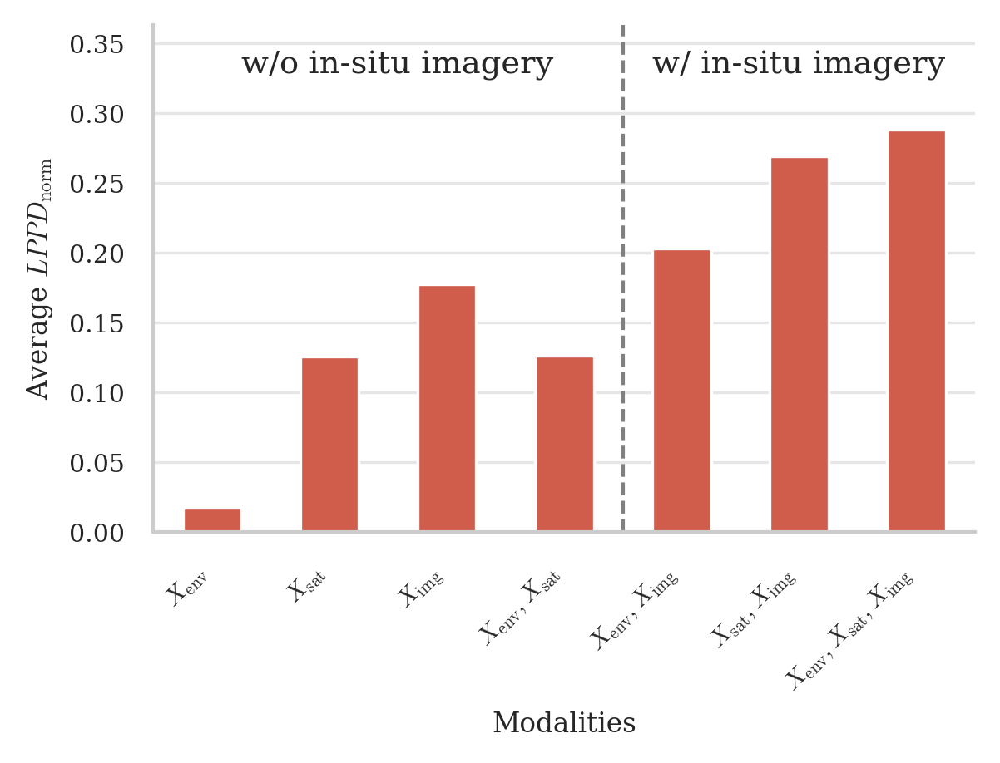

In [18]:
# Sort the dataframe by modality_sort_key to match the order used elsewhere
avg_lppd_norm = (
    dfn.groupby("modalities_label")[["lppd_test_norm", "modality_sort_key"]]
    .mean()
    .sort_values("modality_sort_key")["lppd_test_norm"]
)

# Create bar plot
plt.figure(figsize=(fig_column_width, 100))
# plt.figure(figsize=(10, 6))
sns.barplot(
    x=avg_lppd_norm.index,
    y=avg_lppd_norm.values,
    width=0.5,
)

# Add a vertical dashed line as a separator
plt.axvline(x=3.5, color="grey", linestyle="--", linewidth=1)
plt.ylim(0, plt.ylim()[1] * 1.2)  # Extend y-axis to make space for text
plt.text(3.75, plt.ylim()[1] * 0.95, "w/ in-situ imagery", verticalalignment="top")
plt.text(0.25, plt.ylim()[1] * 0.95, "w/o in-situ imagery", verticalalignment="top")

plt.xticks(rotation=45, ha="right")
plt.xlabel("Modalities")
plt.ylabel(r"Average $LPPD_\text{norm}$")
plt.tight_layout()

plt.gca().set_box_aspect(1 / golden_ratio)  # Maintain golden ratio aspect ratio

# Save the plot
plt.savefig(
    f"{figures_dir}/avg_normalized_lppd_test_monochrome.pdf",
    bbox_inches="tight",
    transparent=True,
)
plt.show()
plt.close()

/tmp/ipykernel_2406484/3390903474.py:119: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:55,382 INFO maxp pruned
2026-02-06 20:27:55,385 INFO cmap pruned
2026-02-06 20:27:55,386 INFO kern dropped
2026-02-06 20:27:55,386 INFO post pruned
2026-02-06 20:27:55,386 INFO FFTM dropped
2026-02-06 20:27:55,387 INFO GPOS pruned
2026-02-06 20:27:55,388 INFO GSUB pruned
2026-02-06 20:27:55,390 INFO glyf pruned
2026-02-06 20:27:55,390 INFO Added gid0 to subset
2026-02-06 20:27:55,391 INFO Added first four glyphs to subset
2026-02-06 20:27:55,391 INFO Closing glyph list over 'MATH': 30 glyphs before
2026-02-06 20:27:55,391 INFO Glyph names: ['.notdef', '.null', 'A', 'M', 'a', 'd', 'e', 'five', 'g', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'period', 'r', 's', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'w', 'y', 'zero']
2026-02-06 20:27:55,391 INFO Glyph IDs:   [0, 1, 2, 3, 16, 17, 18, 19, 20, 21, 22, 24, 36, 48, 68, 71, 72, 74, 76,

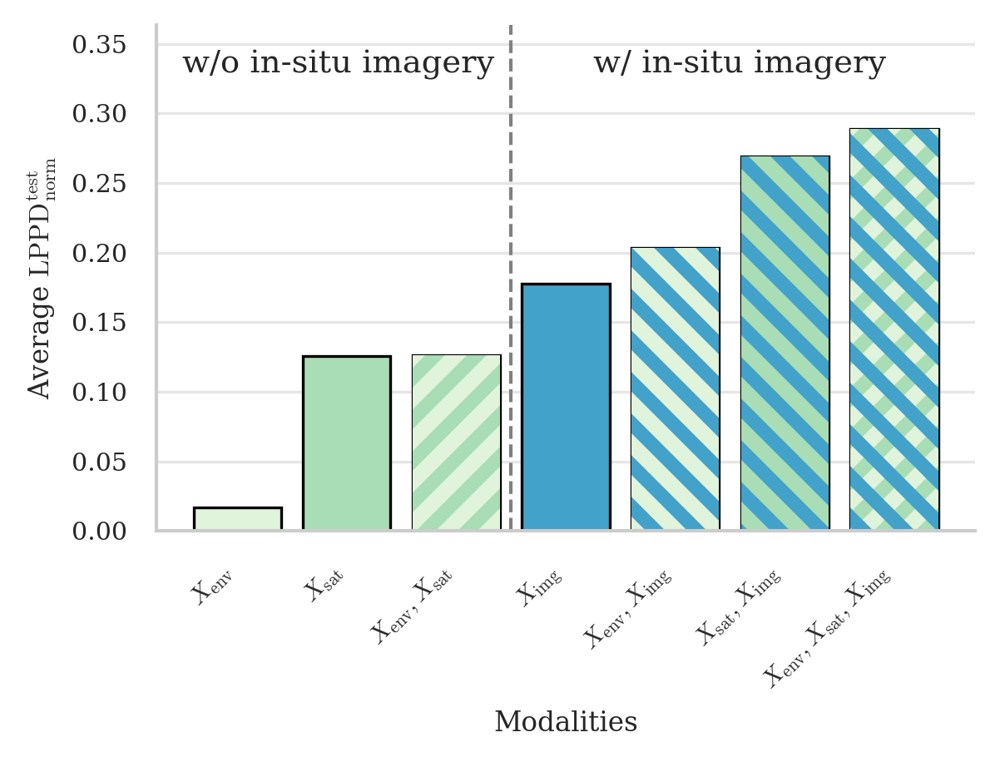

In [19]:
import matplotlib.patches as mpatches

# Define a color map for the base modalities
modality_colors = {
    "covariates": "#e0f3db",
    "sat": "#a8ddb5",
    "sat_feature": "#a8ddb5",
    "image": "#43a2ca",
}

dfn_barplot = dfn.copy()
dfn_barplot.loc[
    dfn_barplot["modalities_label"] == r"$X_\text{img}$", "modality_sort_key"
] = (
    dfn_barplot[dfn_barplot["modalities_label"] == r"$X_\text{env},X_\text{sat}$"][
        "modality_sort_key"
    ].mean()
    + 1e-6
)

# Get the data to plot
avg_lppd_norm = (
    dfn_barplot.groupby("modalities_label")[
        ["lppd_test_norm", "modality_sort_key", "modalities"]
    ]
    .agg(
        {"lppd_test_norm": "mean", "modality_sort_key": "first", "modalities": "first"}
    )
    .sort_values("modality_sort_key")
)

# Create the plot
fig, ax = plt.subplots(figsize=(fig_column_width, 3))

bar_width = 0.8

# Plot the base bars (these will be mostly covered by hatches)
bars = ax.bar(
    avg_lppd_norm.index,
    avg_lppd_norm["lppd_test_norm"],
    width=bar_width,
    color="white",
    edgecolor="black",
)

# Set hatch linewidth
plt.rcParams["hatch.linewidth"] = 4.0

# Iterate over each bar to apply colored hatches for each modality
for i, (bar, (label, row)) in enumerate(zip(bars, avg_lppd_norm.iterrows())):
    modalities = row["modalities"].split(",")

    if len(modalities) == 1:
        # Single modality: fill with solid color
        bar.set_facecolor(modality_colors[modalities[0]])
        continue

    # Apply hatches for each modality
    for j, modality in enumerate(modalities):
        # Create a copy of the bar for each hatch layer
        if "sat" in modality and "covariates" in modalities:
            bar_copy = plt.Rectangle(
                (bar.get_x(), bar.get_y()),
                bar.get_width(),
                bar.get_height(),
                facecolor="none",  # Transparent face
                edgecolor=modality_colors[modality],
                hatch="//",
                linewidth=0,
            )
        elif "covariates" in modality or (
            "sat" in modality
            and any("sat" in m for m in modalities)
            and "image" in modalities
        ):
            bar_copy = plt.Rectangle(
                (bar.get_x(), bar.get_y()),
                bar.get_width(),
                bar.get_height(),
                facecolor=modality_colors[modality],  # Colored face
                linewidth=0,
            )
        elif "image" in modality:
            bar_copy = plt.Rectangle(
                (bar.get_x(), bar.get_y()),
                bar.get_width(),
                bar.get_height(),
                facecolor="none",  # Transparent face
                edgecolor=modality_colors[modality],
                hatch=r"\\",
                linewidth=0,
            )
        ax.add_patch(bar_copy)

# Create legend
legend_patches = [
    mpatches.Patch(
        color=color,
        label=modality.replace("_", " ").replace("sat feature", satf_label).title(),
    )
    for modality, color in modality_colors.items()
]
# ax.legend(handles=legend_patches)

# Add a vertical dashed line as a separator
ax.axvline(x=2.5, color="grey", linestyle="--", linewidth=1)
ax.set_ylim(0, ax.get_ylim()[1] * 1.2)  # Extend y-axis to make space for text
ax.text(3.25, ax.get_ylim()[1] * 0.95, "w/ in-situ imagery", verticalalignment="top")
ax.text(-0.5, ax.get_ylim()[1] * 0.95, "w/o in-situ imagery", verticalalignment="top")

# Set labels and ticks
ax.set_xticks(range(len(avg_lppd_norm)))
ax.set_xticklabels(avg_lppd_norm.index, rotation=45, ha="right")
ax.set_xlabel("Modalities")
ax.set_ylabel(r"Average $\text{LPPD}_\text{norm}^\text{test}$")

plt.gca().set_box_aspect(1 / golden_ratio)

plt.tight_layout()

# Save the plot
plt.savefig(
    f"{figures_dir}/avg_normalized_lppd_test_multicolor.pdf",
    bbox_inches="tight",
    transparent=True,
)
plt.show()
plt.close()

# Reset hatch linewidth to default
plt.rcParams["hatch.linewidth"] = 1.0

/tmp/ipykernel_2406484/2203002743.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


/tmp/ipykernel_2406484/2203002743.py:72: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(icon_labels)
/tmp/ipykernel_2406484/2203002743.py:115: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:55,769 INFO maxp pruned
2026-02-06 20:27:55,773 INFO cmap pruned
2026-02-06 20:27:55,773 INFO kern dropped
2026-02-06 20:27:55,774 INFO post pruned
2026-02-06 20:27:55,774 INFO FFTM dropped
2026-02-06 20:27:55,775 INFO GPOS pruned
2026-02-06 20:27:55,776 INFO GSUB pruned
2026-02-06 20:27:55,779 INFO glyf pruned
2026-02-06 20:27:55,779 INFO Added gid0 to subset
2026-02-06 20:27:55,779 INFO Added first four glyphs to subset
2026-02-06 20:27:55,780 INFO Closing glyph list over 'MATH': 28 glyphs before
2026-02-06 20:27:55,780 INFO Glyph names: ['.notdef', '.null', 'M', 'a', 'd', 'e', 'eight', 'four', 'g', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', '

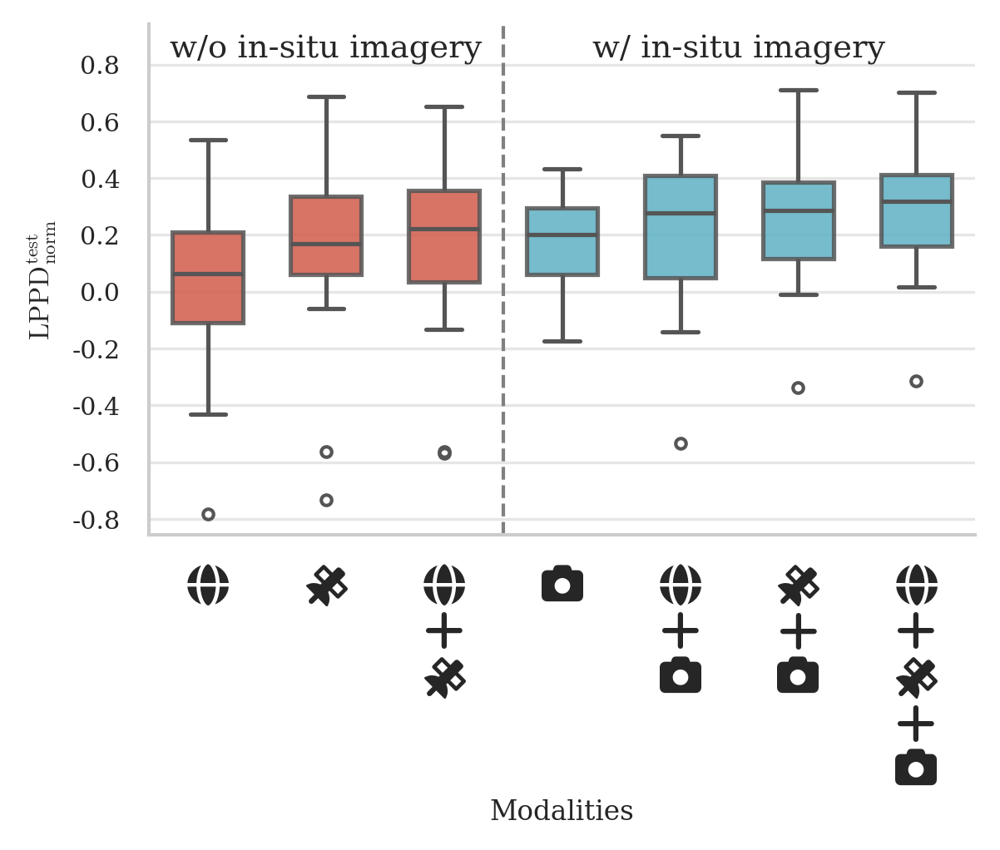

In [20]:
import seaborn as sns

color_cycle = plt.rcParams["axes.prop_cycle"].by_key()["color"]
no_image_combo_color = color_cycle[0]
with_image_combo_color = color_cycle[1]

dfn_boxplot = dfn.copy()
dfn_boxplot.loc[
    dfn_boxplot["modalities_label"] == r"$X_\text{img}$", "modality_sort_key"
] = (
    dfn_boxplot[dfn_boxplot["modalities_label"] == r"$X_\text{env},X_\text{sat}$"][
        "modality_sort_key"
    ].mean()
    + 1e-6
)

order = (
    dfn_boxplot.groupby("modalities_label")["modality_sort_key"]
    .first()
    .sort_values()
    .index
)
order_list = list(order)

if "group_meta" in globals():
    modalities_lookup = group_meta["modalities"].reindex(order_list)
else:
    modalities_lookup = pd.Series(dtype=object)

fallback_modalities = (
    dfn_boxplot.groupby("modalities_label")["modalities"].first().reindex(order_list)
)
combined_modalities = modalities_lookup.combine_first(fallback_modalities)

modality_palette = {}
for label in order_list:
    modalities_str = combined_modalities.get(label)
    if pd.isna(modalities_str):
        continue
    modality_keys = modalities_str.split(",")
    modality_palette[label] = (
        with_image_combo_color if "image" in modality_keys else no_image_combo_color
    )

fig, ax = plt.subplots(figsize=(fig_column_width, 5))
sns.boxplot(
    data=dfn_boxplot,
    x="modalities_label",
    y="lppd_test_norm",
    order=order_list,
    palette=modality_palette,
    ax=ax,
    width=0.6,
    fliersize=3,
    linewidth=1.25,
    boxprops={"alpha": 0.85},
)

fa_font = get_fontawesome_font()

icon_labels = []
for label in order_list:
    modalities_str = combined_modalities.get(label)
    if pd.isna(modalities_str):
        icon_labels.append(label)
        continue
    icons = "\n+\n".join(
        filter(None, (fa_icon_map.get(key, "") for key in modalities_str.split(",")))
    )
    icon_labels.append(icons or label)

ax.set_xticklabels(icon_labels)
for tick in ax.get_xticklabels():
    tick.set_fontproperties(fa_font)
    tick.set_fontsize(12)
    # tick.set_rotation(90)
    tick.set_ha("center")

image_start_idx = next(
    (
        i
        for i, label in enumerate(order_list)
        if pd.notna(combined_modalities.get(label))
        and "image" in combined_modalities[label].split(",")
    ),
    None,
)
separator_pos = None
if image_start_idx not in (None, 0, len(order_list)):
    separator_pos = image_start_idx - 0.5
    ax.axvline(x=separator_pos, color="grey", linestyle="--", linewidth=1)

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax * 1.2)
ymin, ymax = ax.get_ylim()
text_y = ymax - 0.02 * (ymax - ymin)

if separator_pos is not None:
    left_count = image_start_idx
    right_count = len(order_list) - image_start_idx
    if left_count > 0:
        left_center = (left_count - 1) / 2
        ax.text(left_center, text_y, "w/o in-situ imagery", ha="center", va="top")
    if right_count > 0:
        right_center = image_start_idx + (right_count - 1) / 2
        ax.text(right_center, text_y, "w/ in-situ imagery", ha="center", va="top")
else:
    label = "w/ in-situ imagery" if image_start_idx == 0 else "w/o in-situ imagery"
    ax.text((len(order_list) - 1) / 2, text_y, label, ha="center", va="top")

ax.set_xlabel("Modalities")
ax.set_ylabel(r"$\text{LPPD}_\text{norm}^\text{test}$")

plt.gca().set_box_aspect(1 / golden_ratio)
plt.tight_layout()

plt.savefig(
    f"{figures_dir}/normalized_lppd_test_boxplot.pdf",
    bbox_inches="tight",
    transparent=True,
)
plt.show()
plt.close()

/tmp/ipykernel_2406484/1782910817.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


/tmp/ipykernel_2406484/1782910817.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
/tmp/ipykernel_2406484/1782910817.py:50: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:56,167 INFO maxp pruned
2026-02-06 20:27:56,170 INFO cmap pruned
2026-02-06 20:27:56,171 INFO kern dropped
2026-02-06 20:27:56,171 INFO post pruned
2026-02-06 20:27:56,171 INFO FFTM dropped
2026-02-06 20:27:56,172 INFO GPOS pruned
2026-02-06 20:27:56,173 INFO GSUB pruned
2026-02-06 20:27:56,177 INFO glyf pruned
2026-02-06 20:27:56,178 INFO Added gid0 to subset
2026-02-06 20:27:56,178 INFO Added first four glyphs to subset
2026-02-06 20:27:56,179 INFO Closing glyph list over 'MATH': 28 glyphs before
2026-02-06 20:27:56,179 INFO Glyph names: ['.notdef', '.null', 'M', 'a', 'd', 'e', 'eight', 'four', 'g', 'hyphen', 'i', 'l', 'm'

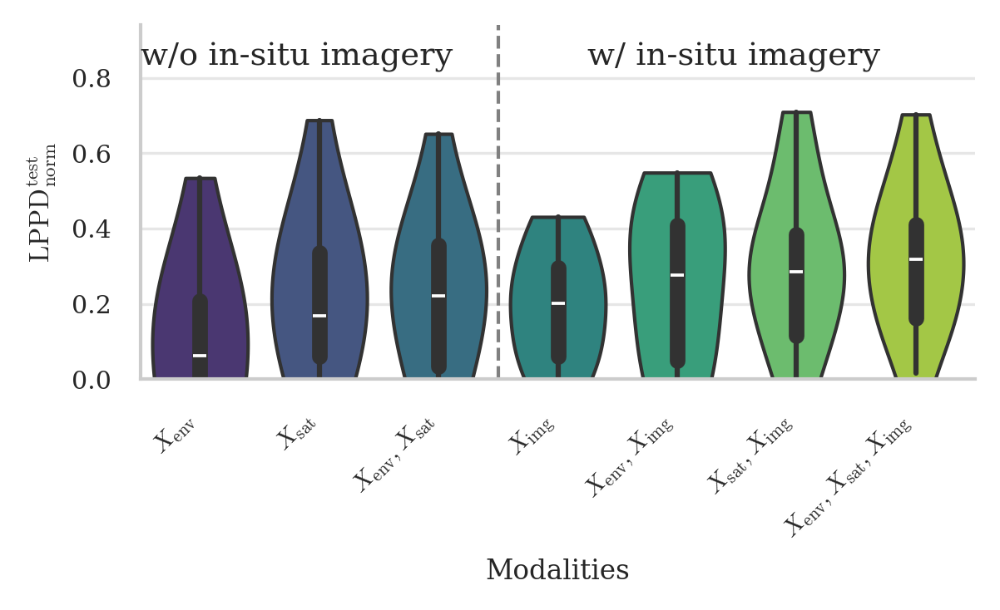

In [21]:
# Define a color map for the base modalities
modality_colors = {
    "covariates": "#e0f3db",
    "sat_feature": "#a8ddb5",
    "image": "#43a2ca",
}

dfn_violinplot = dfn.copy()
dfn_violinplot.loc[
    dfn_violinplot["modalities_label"] == r"$X_\text{img}$", "modality_sort_key"
] = (
    dfn_violinplot[
        dfn_violinplot["modalities_label"] == r"$X_\text{env},X_\text{sat}$"
    ]["modality_sort_key"].mean()
    + 1e-6
)

# Get the order for the plot
plot_order = (
    dfn_violinplot.groupby("modalities_label")["modality_sort_key"]
    .mean()
    .sort_values()
    .index
)

# Create the plot
fig, ax = plt.subplots(figsize=(fig_column_width, fig_column_width / golden_ratio))

sns.violinplot(
    data=dfn_violinplot,
    x="modalities_label",
    y="lppd_test_norm",
    order=plot_order,
    palette="viridis",
    cut=0,  # Trim the violins at the data limits
    ax=ax,
)

# Add a vertical dashed line as a separator
ax.axvline(x=2.5, color="grey", linestyle="--", linewidth=1)
ax.set_ylim(0, ax.get_ylim()[1] * 1.2)  # Extend y-axis to make space for text
ax.text(3.25, ax.get_ylim()[1] * 0.95, "w/ in-situ imagery", verticalalignment="top")
ax.text(-0.5, ax.get_ylim()[1] * 0.95, "w/o in-situ imagery", verticalalignment="top")

# Set labels and ticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_xlabel("Modalities")
ax.set_ylabel(r"$\text{LPPD}_\text{norm}^\text{test}$")

plt.tight_layout()

# Save the plot
plt.savefig(
    f"{figures_dir}/lppd_norm_by_modality_violin.pdf",
    bbox_inches="tight",
    transparent=True,
)
plt.show()
plt.close()

In [22]:
dfn_barplot.sort_values("modality_sort_key")["modalities"].unique()

array(['covariates', 'sat', 'covariates,sat', 'image', 'covariates,image',
       'sat,image', 'covariates,sat,image'], dtype=object)

In [23]:
dfn

,taxon_id,scientific_name,common_name,modalities,image_backbone,sat_backbone,limit_to_range,modalities_scaler,modalities_pca,mean_naive_occupancy_train,...,waic_test_waic,waic_test_p_waic,waic_test_lppd,waic_train_waic,waic_train_p_waic,waic_train_lppd,modality_sort_key,modalities_label,modalities_latex_icon,taxon_name
1793,febff896-db40-4ac8-bcfe-5bb99a600950,Odocoileus hemionus,mule deer,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.171047,...,7508.441956,126.826691,-3627.394287,7241.213570,38.693455,-3581.913330,1.00,$X_\text{env}$,\faGlobe[solid],Odocoileus hemionus
1296,b57debc1-dff2-48d3-a400-f2b5021e71b0,Procyon lotor,northern raccoon,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.227420,...,28031.587585,390.114105,-13625.679688,20037.830666,40.400684,-9978.514648,1.00,$X_\text{env}$,\faGlobe[solid],Procyon lotor
302,1db1c6e2-2ea9-45a6-ab69-a730133298eb,Tamias striatus,eastern chipmunk,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.024390,...,8484.503601,257.275238,-3984.976562,2083.889454,28.972986,-1012.971741,1.00,$X_\text{env}$,\faGlobe[solid],Tamias striatus
1225,ac0e8ba7-7261-4d17-8645-11ed3d02165a,Vulpes vulpes,red fox,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.053237,...,8821.431458,222.761139,-4187.954590,6374.411575,33.235817,-3153.969971,1.00,$X_\text{env}$,\faGlobe[solid],Vulpes vulpes
1651,f67c4346-bbbd-43d5-9b19-b541d493019b,Tamiasciurus douglasii,douglas's squirrel,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.009259,...,3357.101318,956.309021,-722.241638,320.843935,14.517106,-145.904861,1.00,$X_\text{env}$,\faGlobe[solid],Tamiasciurus douglasii
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
624,5acf63fb-339d-42b1-af7e-95f6151ae5fb,Pecari tajacu,collared peccary,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.166667,...,3754.550781,1374.755615,-502.519775,65.706303,2.275913,-30.577238,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Pecari tajacu
553,436ddfdd-bc43-44c3-a25d-34671d3430a0,Ursus americanus,american black bear,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.083498,...,6293.615051,274.501373,-2872.306152,7545.381439,193.440964,-3579.249756,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Ursus americanus
1689,f67c4346-bbbd-43d5-9b19-b541d493019b,Tamiasciurus douglasii,douglas's squirrel,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.009259,...,21959.864502,10454.215820,-525.716431,344.317696,19.184742,-152.974106,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Tamiasciurus douglasii
340,1db1c6e2-2ea9-45a6-ab69-a730133298eb,Tamias striatus,eastern chipmunk,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.024390,...,8379.779785,981.989746,-3207.900146,1942.986115,144.372025,-827.121033,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Tamias striatus


In [24]:
dfn["lppd_test_best"] = dfn[
    [
        c
        for c in ["lppd_test", "mlpregression_lppd_test", "bartregression_lppd_test"]
        if c in dfn.columns
    ]
].max(axis=1)
dfn["lppd_test_best_norm"] = (dfn["lppd_test_best"] - dfn["lppd_null_test"]) / (
    dfn["lppd_oracle_test"] - dfn["lppd_null_test"]
)

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:56,567 INFO maxp pruned
2026-02-06 20:27:56,571 INFO cmap pruned
2026-02-06 20:27:56,571 INFO kern dropped
2026-02-06 20:27:56,571 INFO post pruned
2026-02-06 20:27:56,571 INFO FFTM dropped
2026-02-06 20:27:56,572 INFO GPOS pruned
2026-02-06 20:27:56,573 INFO GSUB pruned
2026-02-06 20:27:56,576 INFO glyf pruned
2026-02-06 20:27:56,576 INFO Added gid0 to subset
2026-02-06 20:27:56,577 INFO Added first four glyphs to subset
2026-02-06 20:27:56,577 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:27:56,577 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

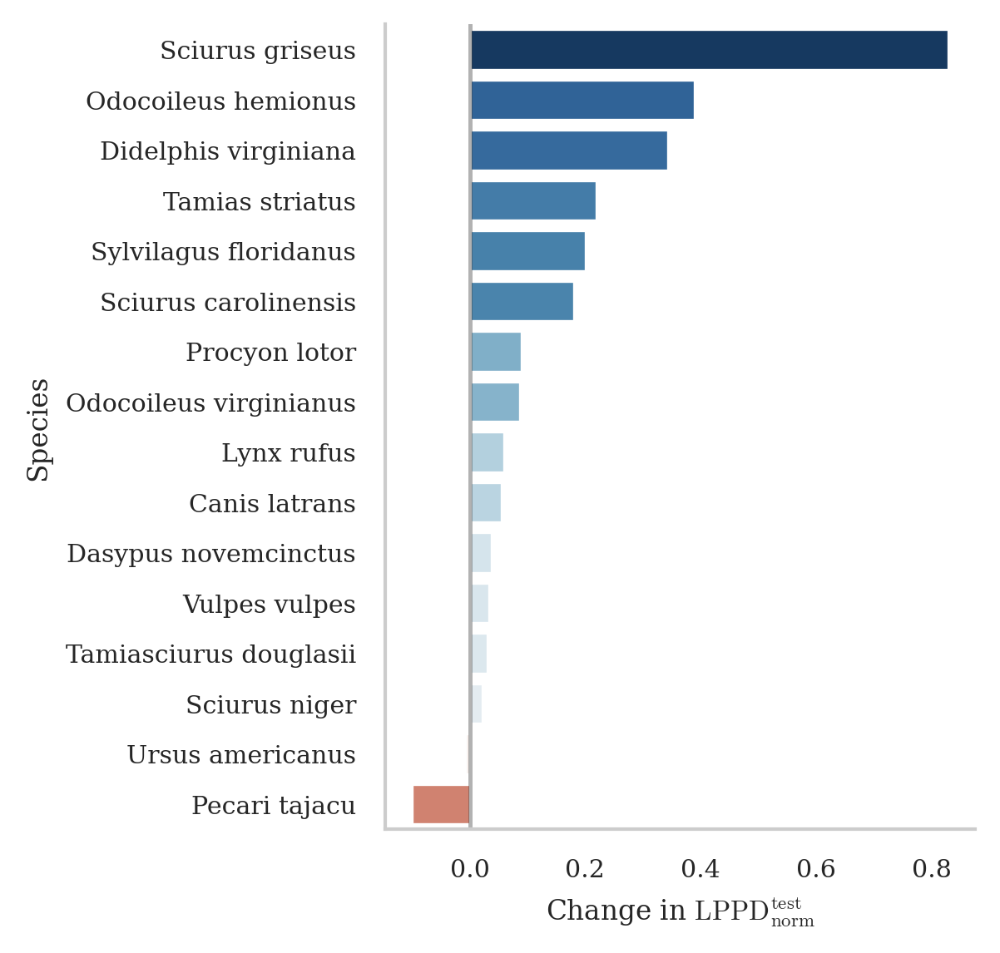

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:56,924 INFO maxp pruned
2026-02-06 20:27:56,927 INFO cmap pruned
2026-02-06 20:27:56,927 INFO kern dropped
2026-02-06 20:27:56,928 INFO post pruned
2026-02-06 20:27:56,928 INFO FFTM dropped
2026-02-06 20:27:56,929 INFO GPOS pruned
2026-02-06 20:27:56,930 INFO GSUB pruned
2026-02-06 20:27:56,932 INFO glyf pruned
2026-02-06 20:27:56,933 INFO Added gid0 to subset
2026-02-06 20:27:56,933 INFO Added first four glyphs to subset
2026-02-06 20:27:56,934 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:27:56,934 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

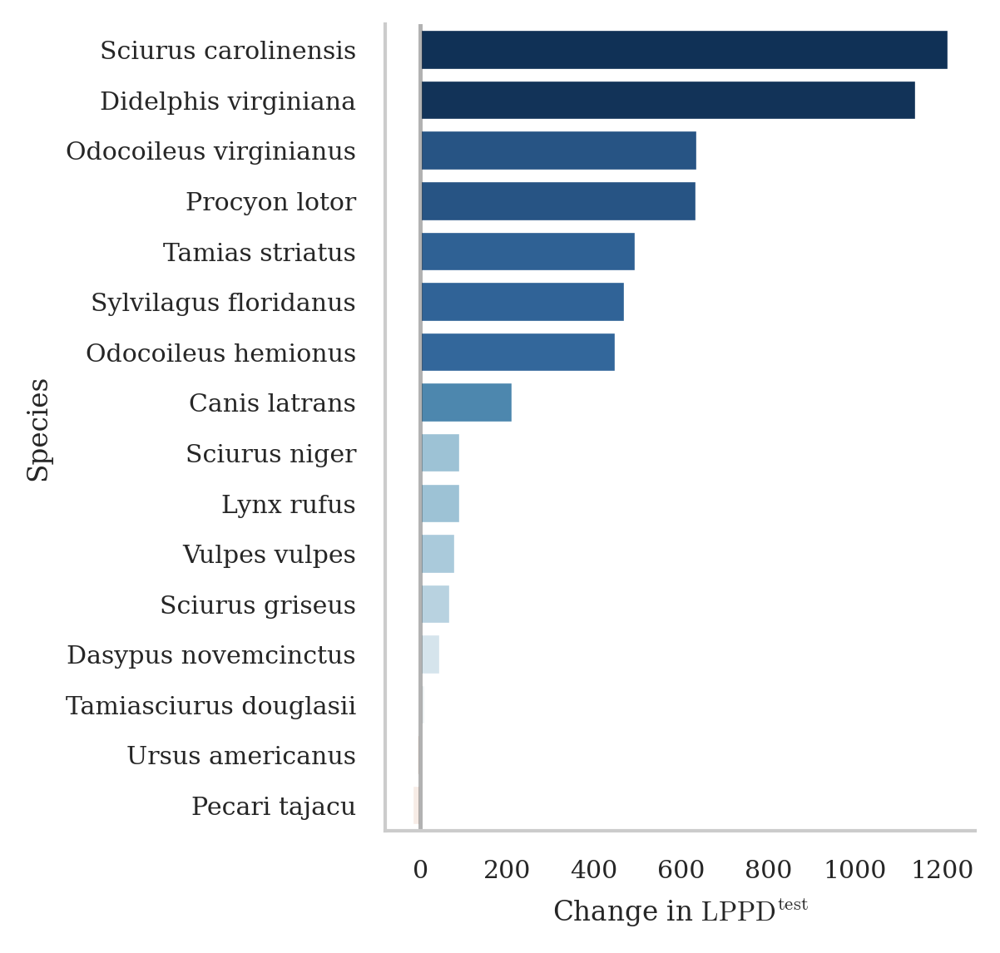

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:57,370 INFO maxp pruned
2026-02-06 20:27:57,374 INFO cmap pruned
2026-02-06 20:27:57,374 INFO kern dropped
2026-02-06 20:27:57,375 INFO post pruned
2026-02-06 20:27:57,375 INFO FFTM dropped
2026-02-06 20:27:57,376 INFO GPOS pruned
2026-02-06 20:27:57,376 INFO GSUB pruned
2026-02-06 20:27:57,379 INFO glyf pruned
2026-02-06 20:27:57,379 INFO Added gid0 to subset
2026-02-06 20:27:57,379 INFO Added first four glyphs to subset
2026-02-06 20:27:57,380 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:27:57,380 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

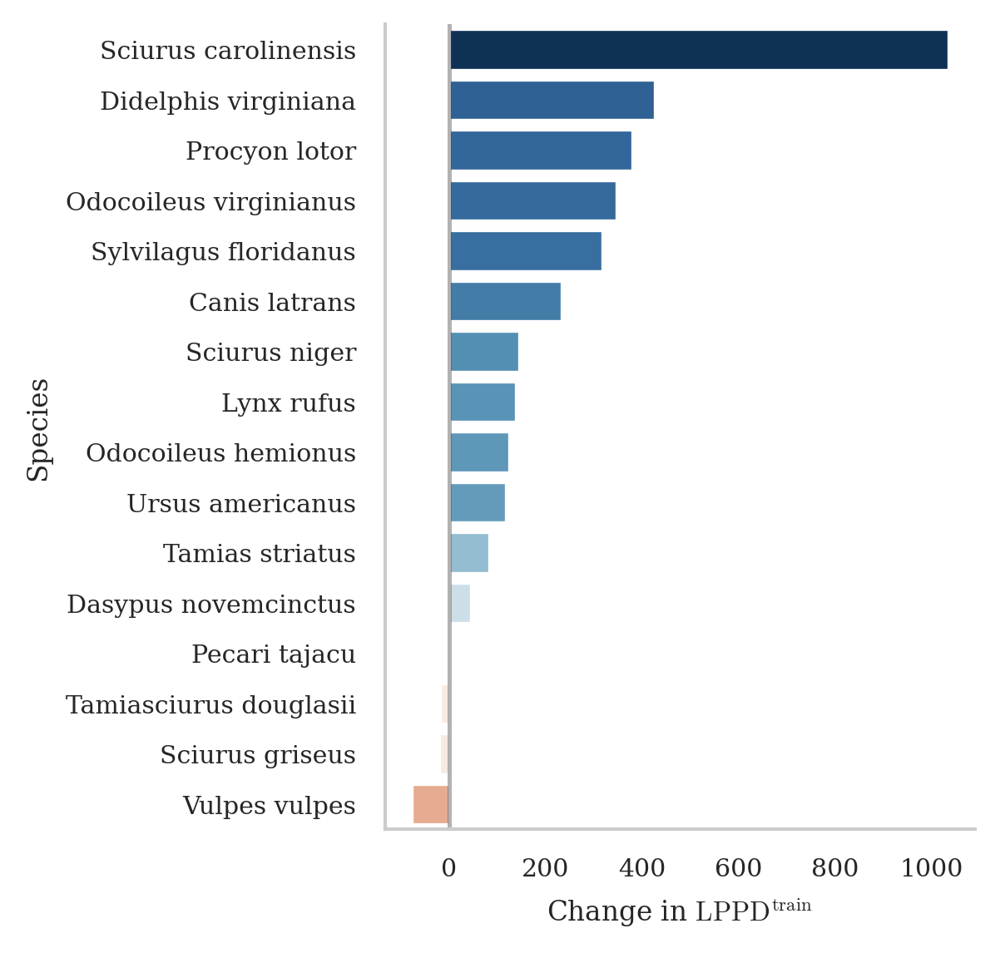

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:57,839 INFO maxp pruned
2026-02-06 20:27:57,843 INFO cmap pruned
2026-02-06 20:27:57,844 INFO kern dropped
2026-02-06 20:27:57,844 INFO post pruned
2026-02-06 20:27:57,844 INFO FFTM dropped
2026-02-06 20:27:57,845 INFO GPOS pruned
2026-02-06 20:27:57,846 INFO GSUB pruned
2026-02-06 20:27:57,849 INFO glyf pruned
2026-02-06 20:27:57,850 INFO Added gid0 to subset
2026-02-06 20:27:57,850 INFO Added first four glyphs to subset
2026-02-06 20:27:57,850 INFO Closing glyph list over 'MATH': 37 glyphs before
2026-02-06 20:27:57,851 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

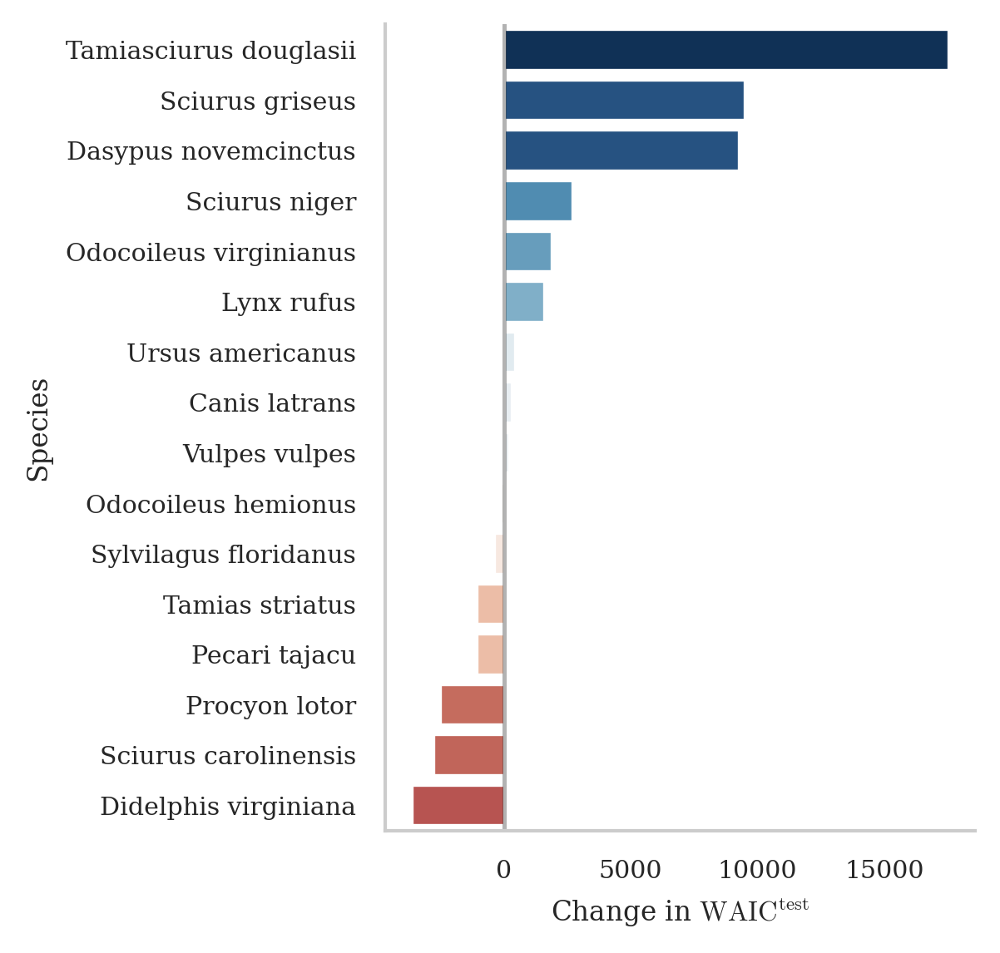

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:58,223 INFO maxp pruned
2026-02-06 20:27:58,226 INFO cmap pruned
2026-02-06 20:27:58,226 INFO kern dropped
2026-02-06 20:27:58,227 INFO post pruned
2026-02-06 20:27:58,227 INFO FFTM dropped
2026-02-06 20:27:58,228 INFO GPOS pruned
2026-02-06 20:27:58,228 INFO GSUB pruned
2026-02-06 20:27:58,232 INFO glyf pruned
2026-02-06 20:27:58,233 INFO Added gid0 to subset
2026-02-06 20:27:58,233 INFO Added first four glyphs to subset
2026-02-06 20:27:58,233 INFO Closing glyph list over 'MATH': 38 glyphs before
2026-02-06 20:27:58,234 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

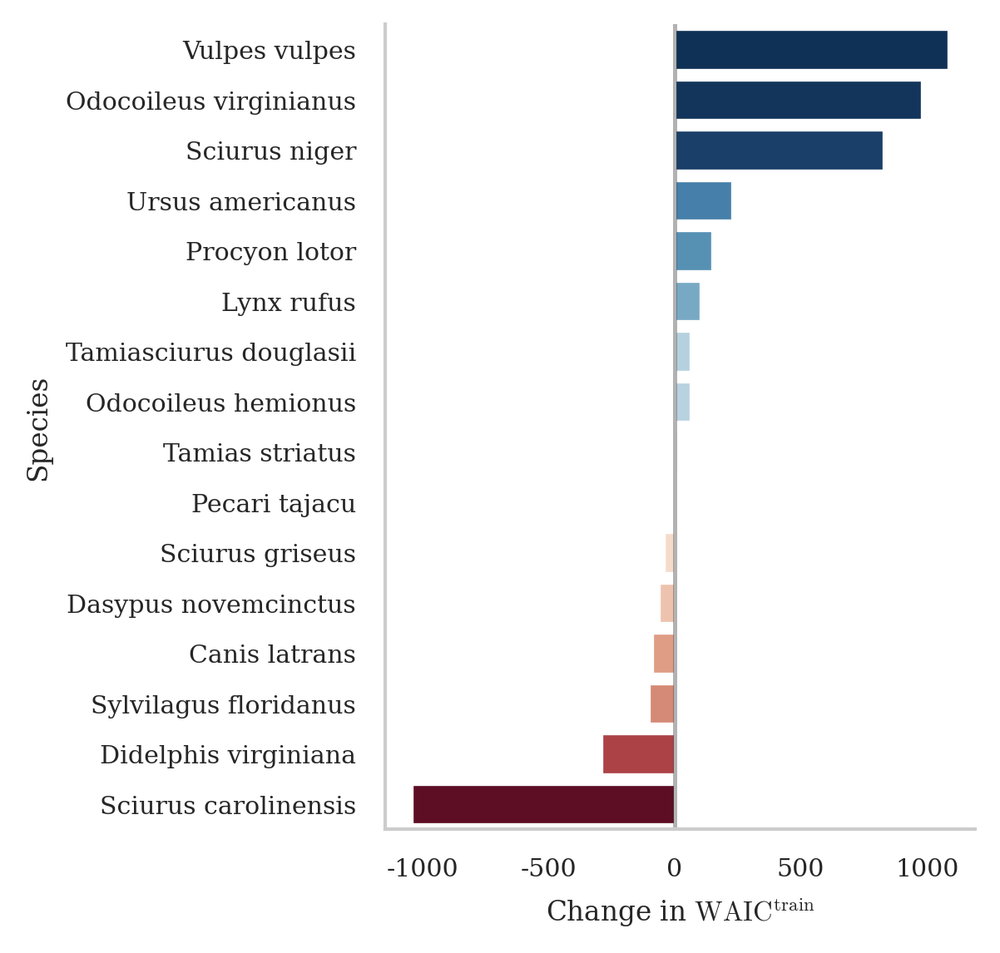

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:27:58,635 INFO maxp pruned
2026-02-06 20:27:58,638 INFO cmap pruned
2026-02-06 20:27:58,638 INFO kern dropped
2026-02-06 20:27:58,639 INFO post pruned
2026-02-06 20:27:58,639 INFO FFTM dropped
2026-02-06 20:27:58,640 INFO GPOS pruned
2026-02-06 20:27:58,640 INFO GSUB pruned
2026-02-06 20:27:58,644 INFO glyf pruned
2026-02-06 20:27:58,644 INFO Added gid0 to subset
2026-02-06 20:27:58,645 INFO Added first four glyphs to subset
2026-02-06 20:27:58,645 INFO Closing glyph list over 'MATH': 39 glyphs before
2026-02-06 20:27:58,645 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

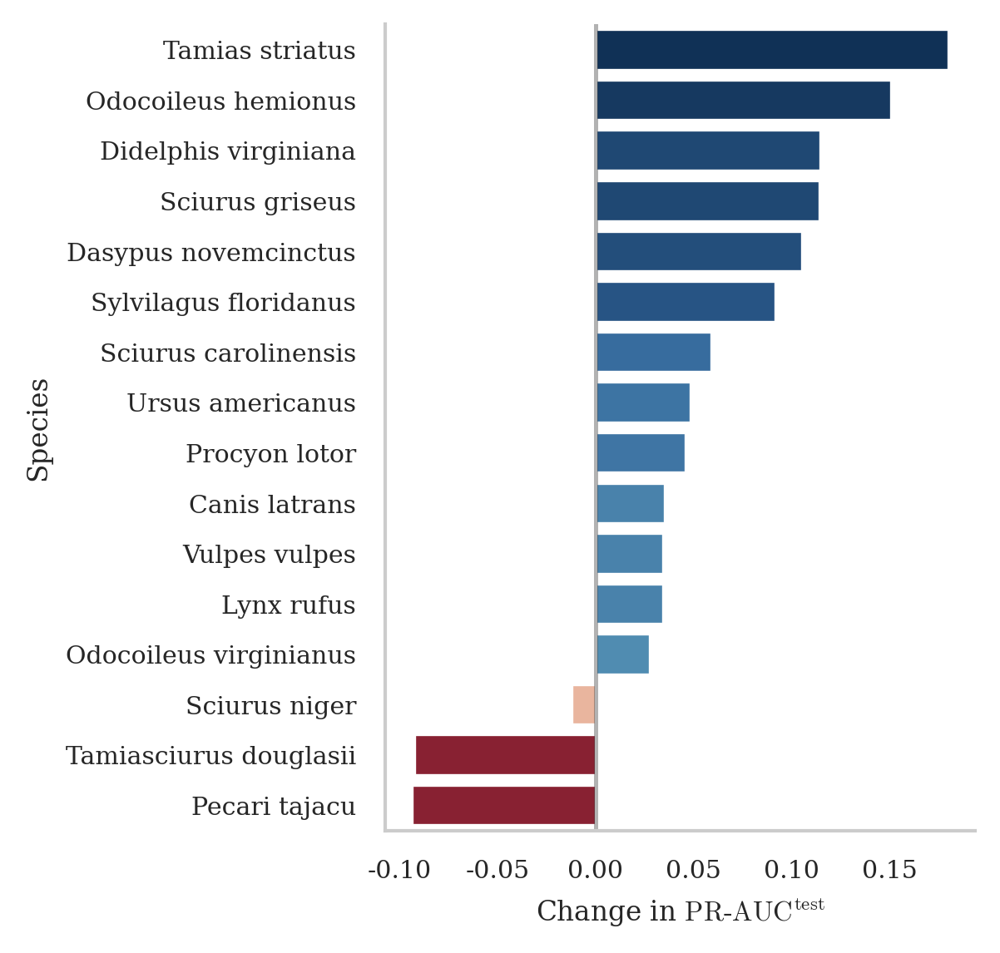

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:00,945 INFO maxp pruned
2026-02-06 20:28:00,949 INFO cmap pruned
2026-02-06 20:28:00,949 INFO kern dropped
2026-02-06 20:28:00,949 INFO post pruned
2026-02-06 20:28:00,949 INFO FFTM dropped
2026-02-06 20:28:00,950 INFO GPOS pruned
2026-02-06 20:28:00,951 INFO GSUB pruned
2026-02-06 20:28:00,954 INFO glyf pruned
2026-02-06 20:28:00,955 INFO Added gid0 to subset
2026-02-06 20:28:00,955 INFO Added first four glyphs to subset
2026-02-06 20:28:00,955 INFO Closing glyph list over 'MATH': 38 glyphs before
2026-02-06 20:28:00,955 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

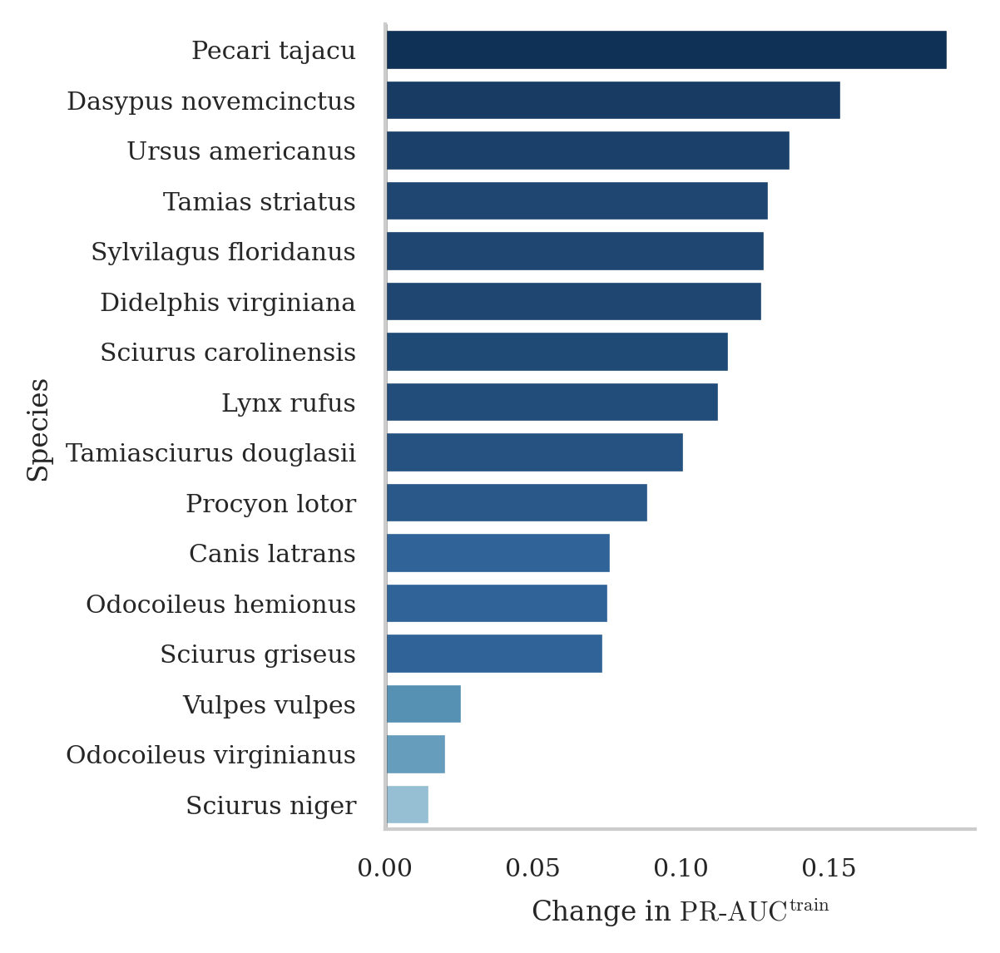

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:01,355 INFO maxp pruned
2026-02-06 20:28:01,359 INFO cmap pruned
2026-02-06 20:28:01,359 INFO kern dropped
2026-02-06 20:28:01,360 INFO post pruned
2026-02-06 20:28:01,360 INFO FFTM dropped
2026-02-06 20:28:01,361 INFO GPOS pruned
2026-02-06 20:28:01,362 INFO GSUB pruned
2026-02-06 20:28:01,364 INFO glyf pruned
2026-02-06 20:28:01,365 INFO Added gid0 to subset
2026-02-06 20:28:01,365 INFO Added first four glyphs to subset
2026-02-06 20:28:01,365 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:28:01,366 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

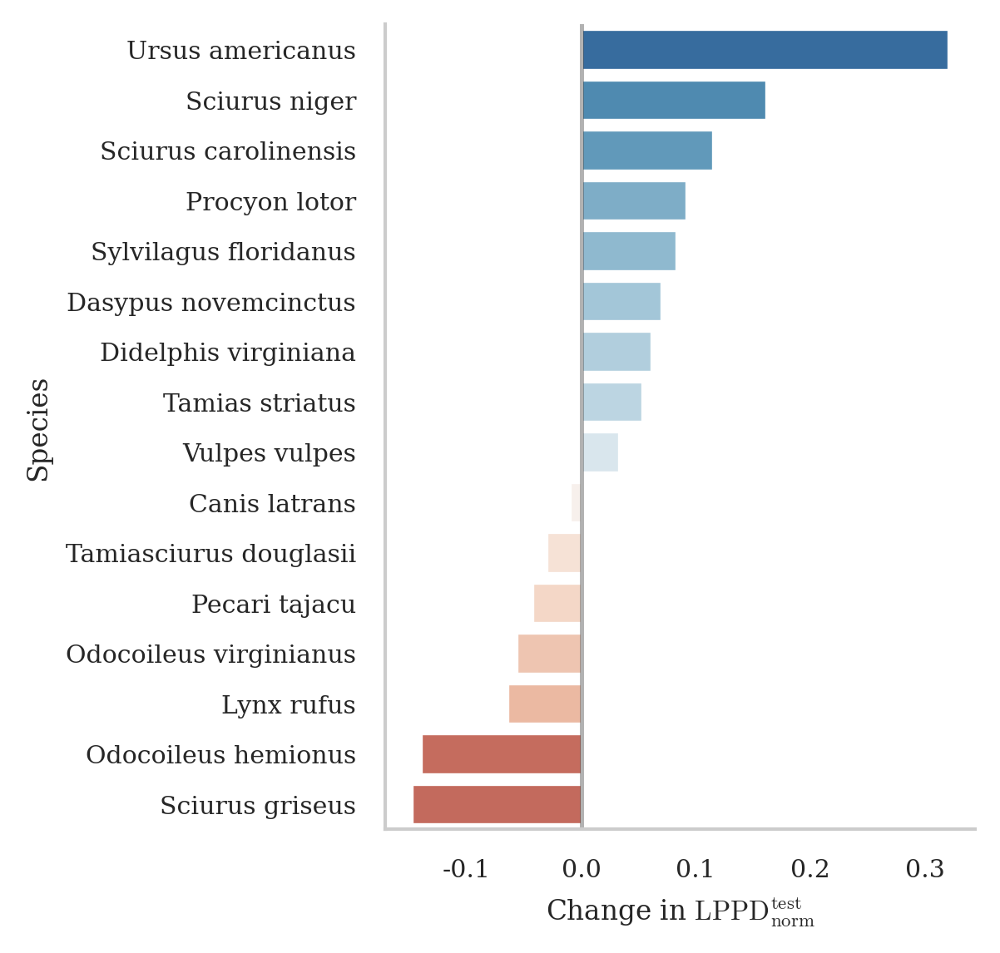

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:01,755 INFO maxp pruned
2026-02-06 20:28:01,759 INFO cmap pruned
2026-02-06 20:28:01,760 INFO kern dropped
2026-02-06 20:28:01,760 INFO post pruned
2026-02-06 20:28:01,760 INFO FFTM dropped
2026-02-06 20:28:01,761 INFO GPOS pruned
2026-02-06 20:28:01,762 INFO GSUB pruned
2026-02-06 20:28:01,765 INFO glyf pruned
2026-02-06 20:28:01,766 INFO Added gid0 to subset
2026-02-06 20:28:01,766 INFO Added first four glyphs to subset
2026-02-06 20:28:01,766 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:28:01,767 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

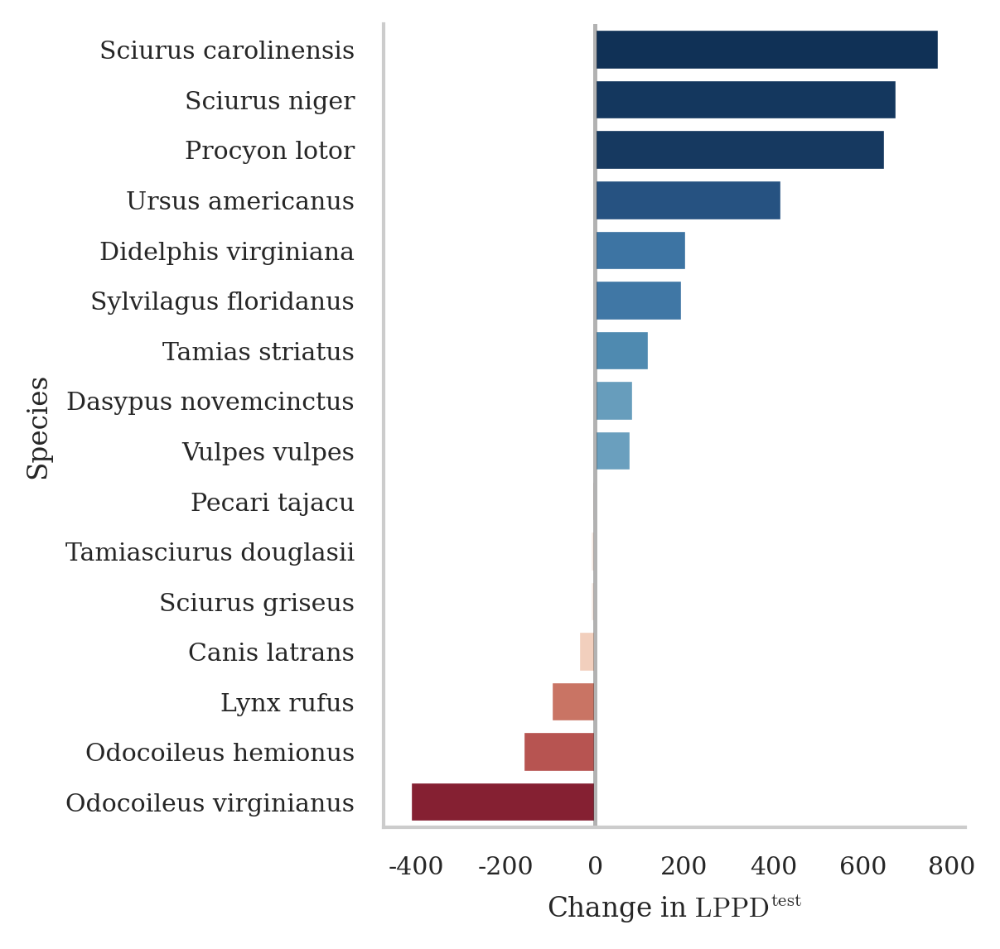

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:02,176 INFO maxp pruned
2026-02-06 20:28:02,180 INFO cmap pruned
2026-02-06 20:28:02,180 INFO kern dropped
2026-02-06 20:28:02,180 INFO post pruned
2026-02-06 20:28:02,180 INFO FFTM dropped
2026-02-06 20:28:02,181 INFO GPOS pruned
2026-02-06 20:28:02,182 INFO GSUB pruned
2026-02-06 20:28:02,185 INFO glyf pruned
2026-02-06 20:28:02,186 INFO Added gid0 to subset
2026-02-06 20:28:02,186 INFO Added first four glyphs to subset
2026-02-06 20:28:02,186 INFO Closing glyph list over 'MATH': 39 glyphs before
2026-02-06 20:28:02,187 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

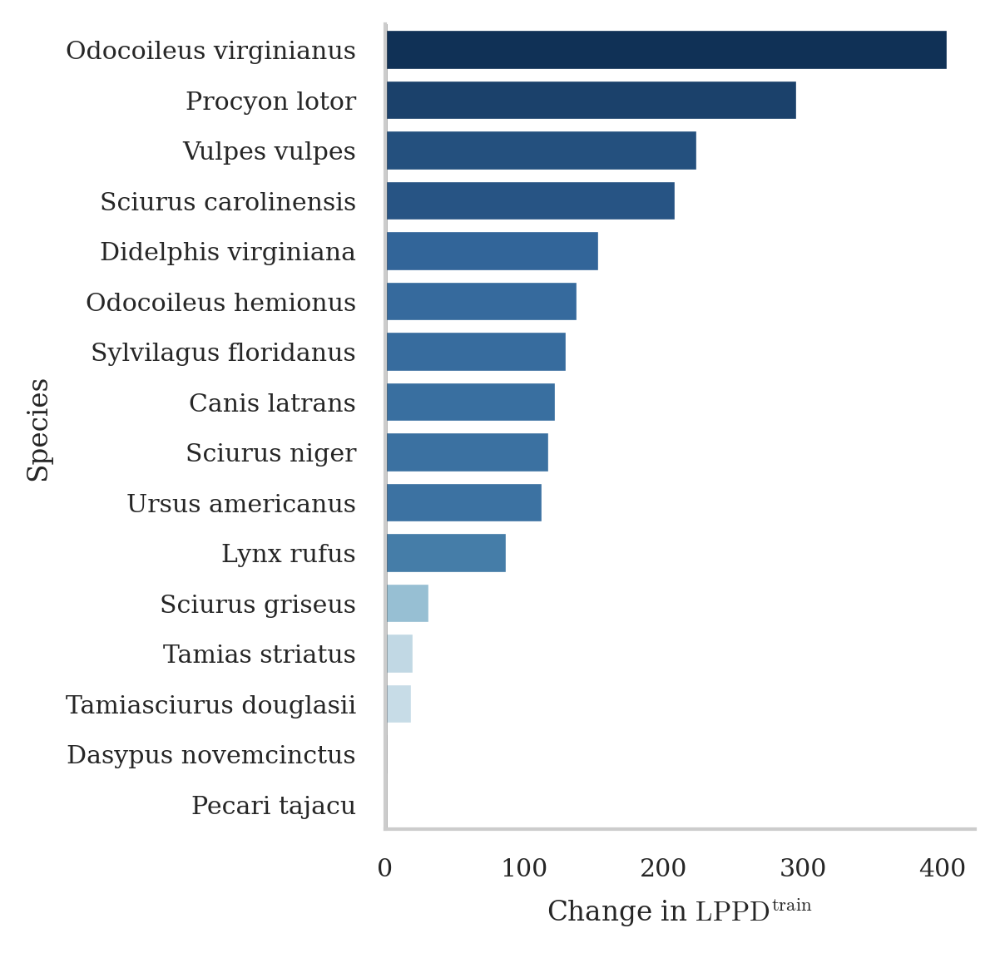

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:02,663 INFO maxp pruned
2026-02-06 20:28:02,667 INFO cmap pruned
2026-02-06 20:28:02,668 INFO kern dropped
2026-02-06 20:28:02,668 INFO post pruned
2026-02-06 20:28:02,668 INFO FFTM dropped
2026-02-06 20:28:02,669 INFO GPOS pruned
2026-02-06 20:28:02,670 INFO GSUB pruned
2026-02-06 20:28:02,673 INFO glyf pruned
2026-02-06 20:28:02,673 INFO Added gid0 to subset
2026-02-06 20:28:02,674 INFO Added first four glyphs to subset
2026-02-06 20:28:02,674 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:28:02,674 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

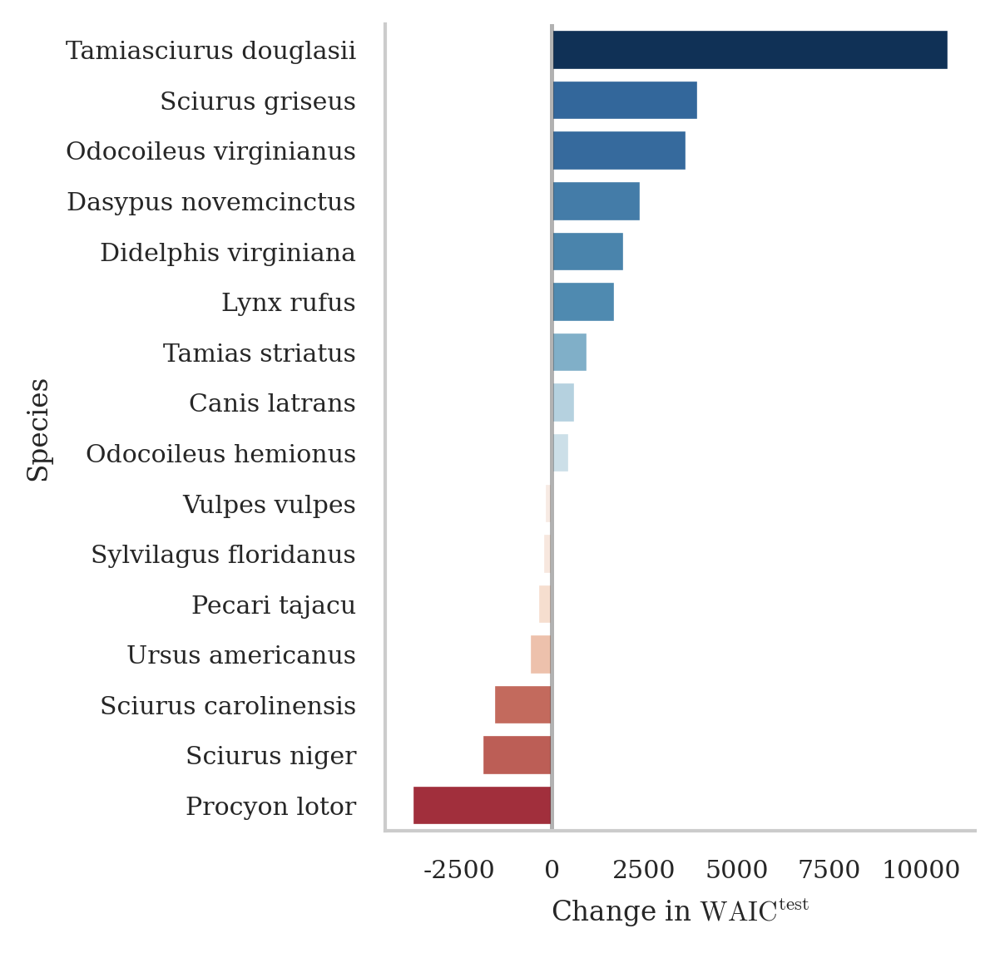

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:03,183 INFO maxp pruned
2026-02-06 20:28:03,187 INFO cmap pruned
2026-02-06 20:28:03,187 INFO kern dropped
2026-02-06 20:28:03,188 INFO post pruned
2026-02-06 20:28:03,188 INFO FFTM dropped
2026-02-06 20:28:03,189 INFO GPOS pruned
2026-02-06 20:28:03,190 INFO GSUB pruned
2026-02-06 20:28:03,193 INFO glyf pruned
2026-02-06 20:28:03,193 INFO Added gid0 to subset
2026-02-06 20:28:03,193 INFO Added first four glyphs to subset
2026-02-06 20:28:03,194 INFO Closing glyph list over 'MATH': 39 glyphs before
2026-02-06 20:28:03,194 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

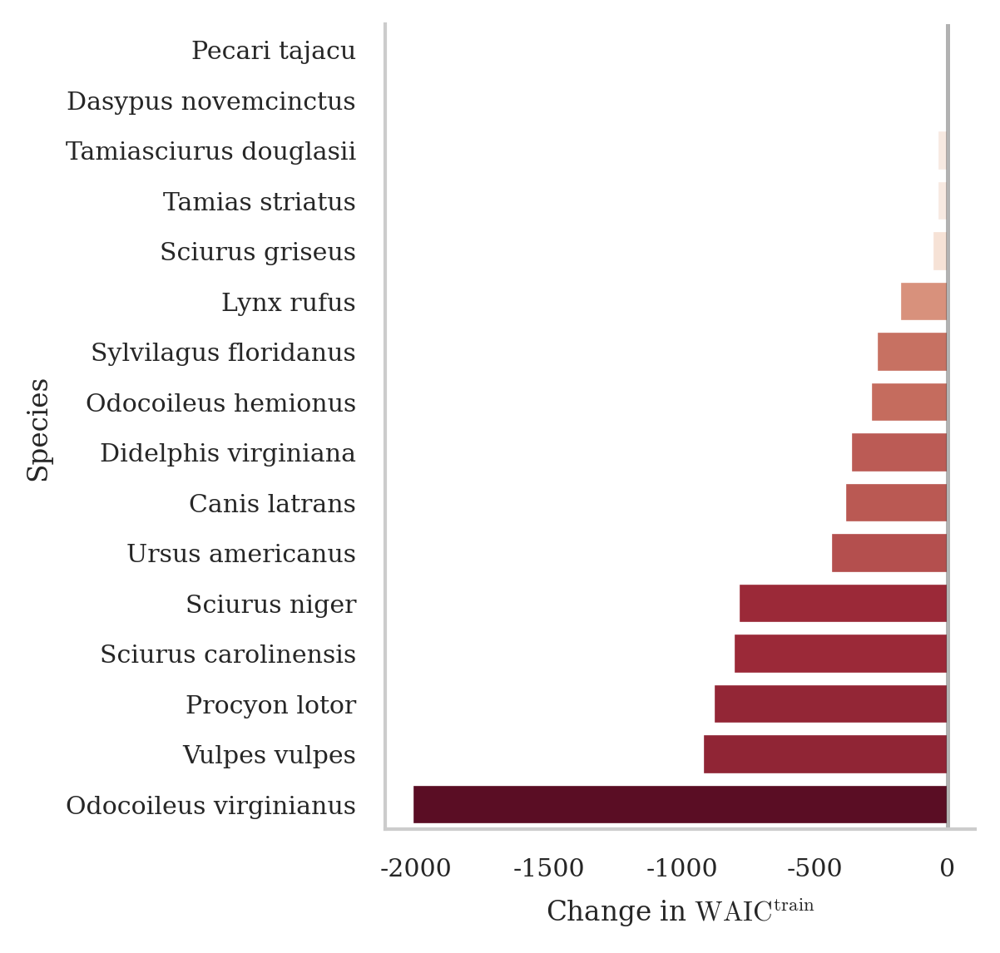

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:03,701 INFO maxp pruned
2026-02-06 20:28:03,706 INFO cmap pruned
2026-02-06 20:28:03,706 INFO kern dropped
2026-02-06 20:28:03,707 INFO post pruned
2026-02-06 20:28:03,707 INFO FFTM dropped
2026-02-06 20:28:03,708 INFO GPOS pruned
2026-02-06 20:28:03,709 INFO GSUB pruned
2026-02-06 20:28:03,712 INFO glyf pruned
2026-02-06 20:28:03,713 INFO Added gid0 to subset
2026-02-06 20:28:03,713 INFO Added first four glyphs to subset
2026-02-06 20:28:03,713 INFO Closing glyph list over 'MATH': 39 glyphs before
2026-02-06 20:28:03,714 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

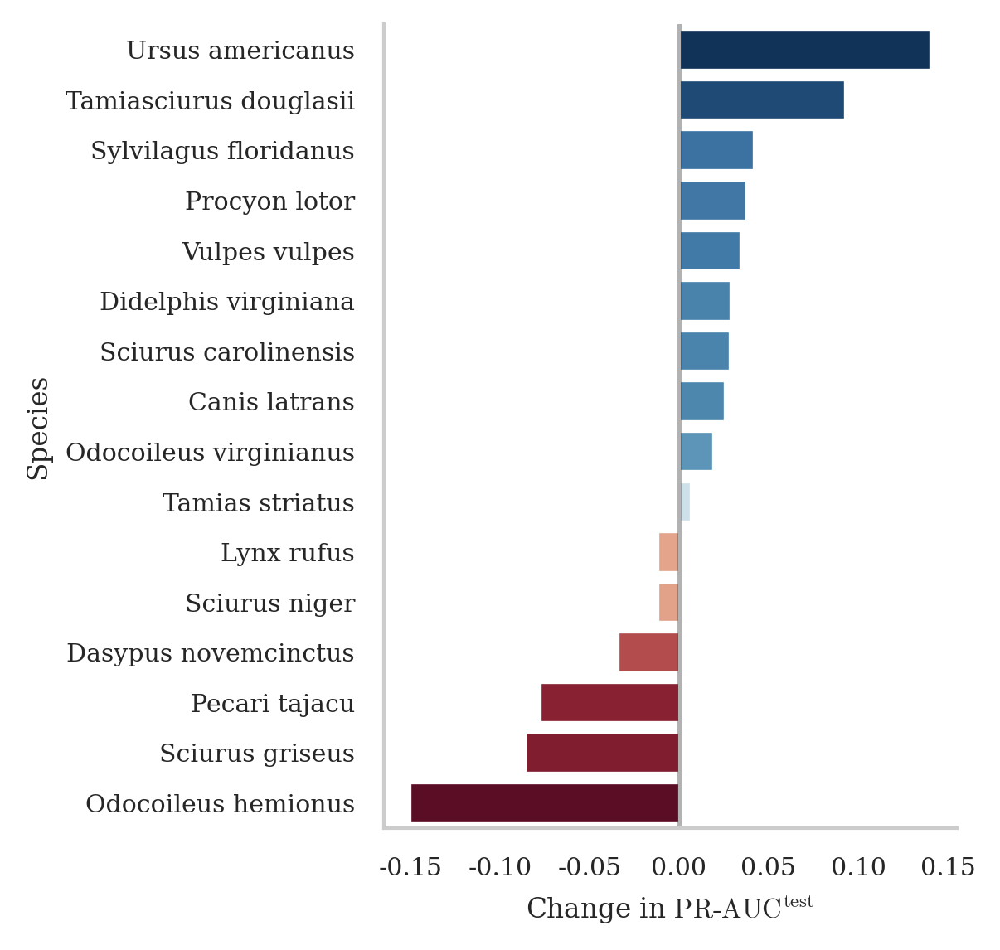

/tmp/ipykernel_2406484/1287964710.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/1287964710.py:75: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:04,211 INFO maxp pruned
2026-02-06 20:28:04,215 INFO cmap pruned
2026-02-06 20:28:04,216 INFO kern dropped
2026-02-06 20:28:04,216 INFO post pruned
2026-02-06 20:28:04,216 INFO FFTM dropped
2026-02-06 20:28:04,217 INFO GPOS pruned
2026-02-06 20:28:04,218 INFO GSUB pruned
2026-02-06 20:28:04,221 INFO glyf pruned
2026-02-06 20:28:04,222 INFO Added gid0 to subset
2026-02-06 20:28:04,222 INFO Added first four glyphs to subset
2026-02-06 20:28:04,223 INFO Closing glyph list over 'MATH': 39 glyphs before
2026-02-06 20:28:04,223 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e'

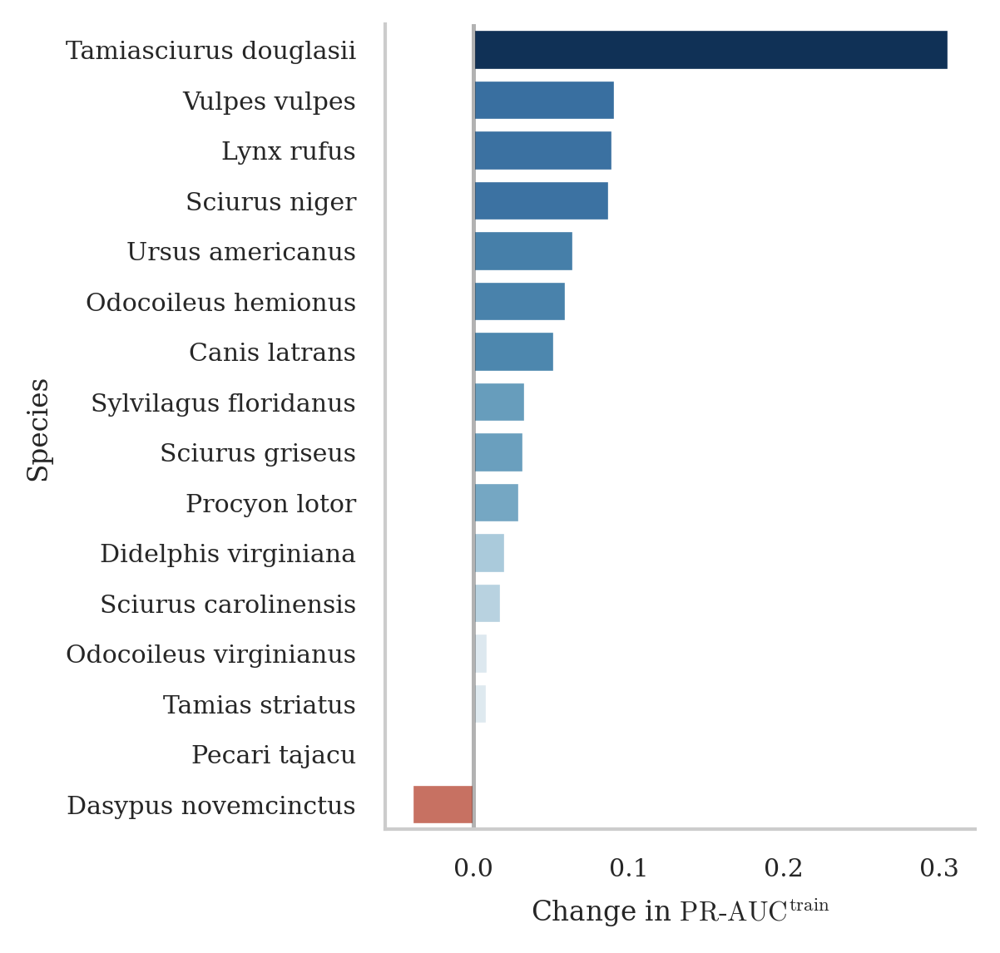

In [25]:
from matplotlib.colors import SymLogNorm

for modality in ["image", "sat"]:
    for metric in [
        "lppd_test_norm",
        "lppd_test",
        "lppd_train",
        "waic_test_waic",
        "waic_train_waic",
        "lr_map_test",
        "lr_map_train",
    ]:

        metric_label = metric_labels.get(metric, metric)

        # Calculate modality uplift for each species
        species_uplift = []
        for species in dfn["taxon_name"].unique():
            if pd.isna(species):
                continue

            species_data = dfn[dfn["taxon_name"] == species]

            # Get best model with the modality
            with_mod = species_data[species_data["modalities"].str.contains(modality)]
            best_with_mod = with_mod[metric].max() if not with_mod.empty else np.nan

            # Get best model without the modality
            without_mod = species_data[
                ~species_data["modalities"].str.contains(modality)
            ]
            best_without_mod = (
                without_mod[metric].max() if not without_mod.empty else np.nan
            )

            # Calculate uplift
            if pd.notna(best_with_mod) and pd.notna(best_without_mod):
                uplift = best_with_mod - best_without_mod
                species_uplift.append(
                    {"species": species, f"{modality}_uplift": uplift}
                )

        # Create DataFrame and sort by uplift
        uplift_df = pd.DataFrame(species_uplift).sort_values(
            f"{modality}_uplift", ascending=False
        )

        # Compute color mapping: set a symmetric range about zero so that 0 gets the zero-point color.

        values = uplift_df[f"{modality}_uplift"]
        if metric in {"lppd_test_norm", "map_test_lr", "map_train_lr"}:
            abs_max = 1
        else:
            abs_max = max(abs(values.min()), abs(values.max()))
        # Use a symmetric logarithmic normalization with a small linear threshold.
        norm = SymLogNorm(linthresh=0.1 * abs_max, vmin=-abs_max, vmax=abs_max, base=10)
        cmap = plt.get_cmap("RdBu")
        colors = [cmap(norm(val)) for val in values]

        height = 0.65 * min(16, max(6, 16 * df["taxon_id"].nunique() / 80))
        plt.figure(figsize=(fig_column_width, height))
        sns.barplot(
            data=uplift_df,
            x=f"{modality}_uplift",
            y="species",
            palette=colors,
            orient="h",
        )

        modality_title = modality.replace("_", " ").title()
        plt.axvline(x=0, color="black", linestyle="-", alpha=0.3)
        plt.xlabel(f"Change in {metric_label}")
        plt.ylabel("Species")
        # plt.title(f'{modality_title} Modality Performance Uplift by Species')
        plt.tight_layout()

        plt.savefig(
            f"{figures_dir}/{modality}_uplift_by_species_{metric}.pdf",
            bbox_inches="tight",
            dpi=300,
            transparent=True,
        )
        plt.show()
        plt.close()

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:04,891 INFO maxp pruned
2026-02-06 20:28:04,895 INFO cmap pruned
2026-02-06 20:28:04,896 INFO kern dropped
2026-02-06 20:28:04,896 INFO post pruned
2026-02-06 20:28:04,896 INFO FFTM dropped
2026-02-06 20:28:04,897 INFO GPOS pruned
2026-02-06 20:28:04,898 INFO GSUB pruned
2026-02-06 20:28:04,902 INFO glyf pruned
2026-02-06 20:28:04,902 INFO Added gid0 to subset
2026-02-06 20:28:04,903 INFO Added first four glyphs to subset
2026-02-06 20:28:04,903 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:28:04,903 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

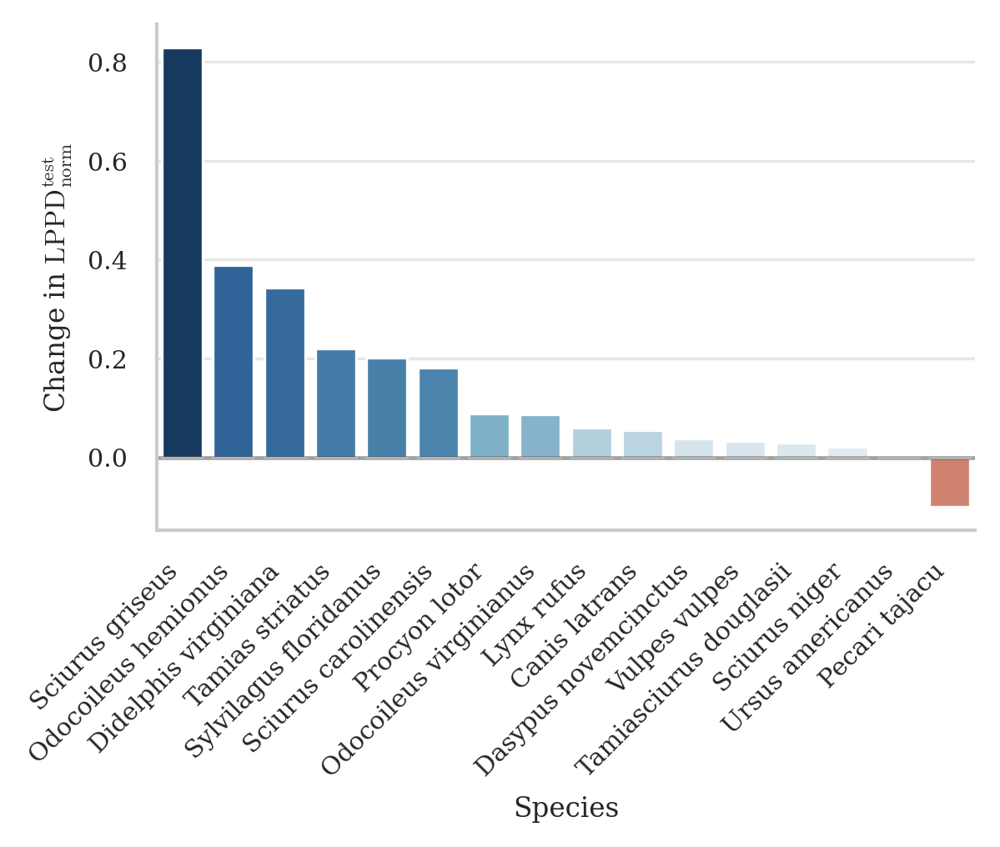

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:05,408 INFO maxp pruned
2026-02-06 20:28:05,411 INFO cmap pruned
2026-02-06 20:28:05,412 INFO kern dropped
2026-02-06 20:28:05,412 INFO post pruned
2026-02-06 20:28:05,412 INFO FFTM dropped
2026-02-06 20:28:05,413 INFO GPOS pruned
2026-02-06 20:28:05,414 INFO GSUB pruned
2026-02-06 20:28:05,739 INFO glyf pruned
2026-02-06 20:28:05,740 INFO Added gid0 to subset
2026-02-06 20:28:05,740 INFO Added first four glyphs to subset
2026-02-06 20:28:05,741 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:28:05,741 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

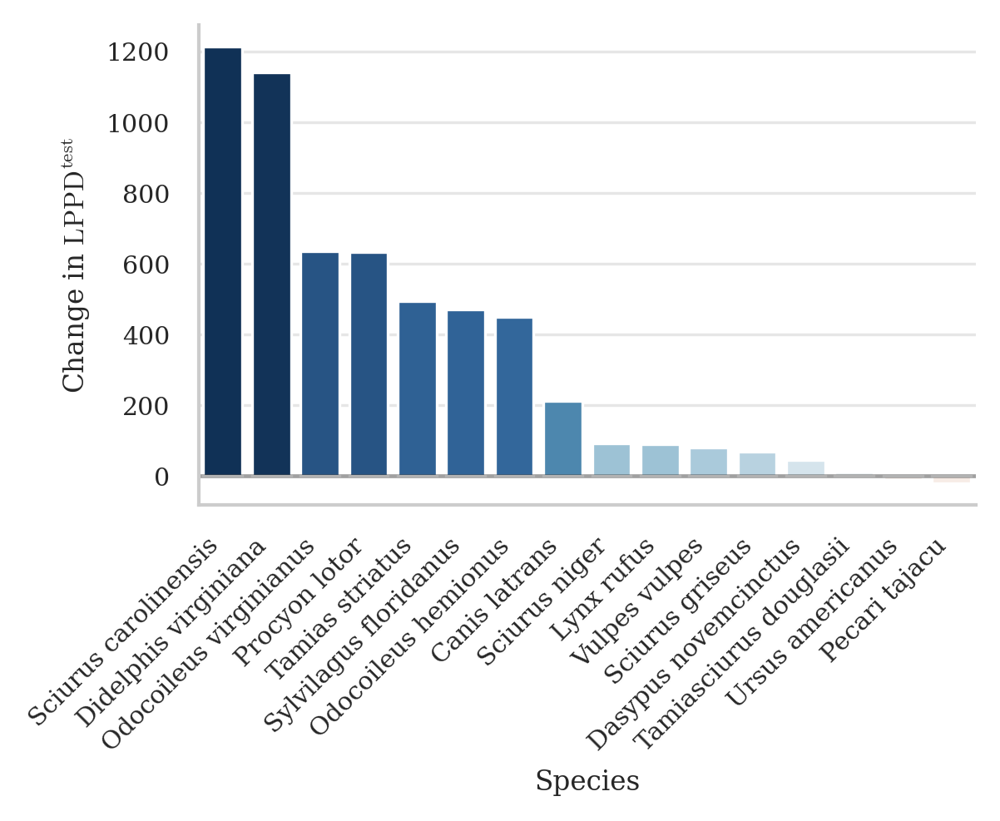

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:06,304 INFO maxp pruned
2026-02-06 20:28:06,308 INFO cmap pruned
2026-02-06 20:28:06,309 INFO kern dropped
2026-02-06 20:28:06,309 INFO post pruned
2026-02-06 20:28:06,309 INFO FFTM dropped
2026-02-06 20:28:06,310 INFO GPOS pruned
2026-02-06 20:28:06,311 INFO GSUB pruned
2026-02-06 20:28:06,313 INFO glyf pruned
2026-02-06 20:28:06,314 INFO Added gid0 to subset
2026-02-06 20:28:06,314 INFO Added first four glyphs to subset
2026-02-06 20:28:06,314 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:28:06,314 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

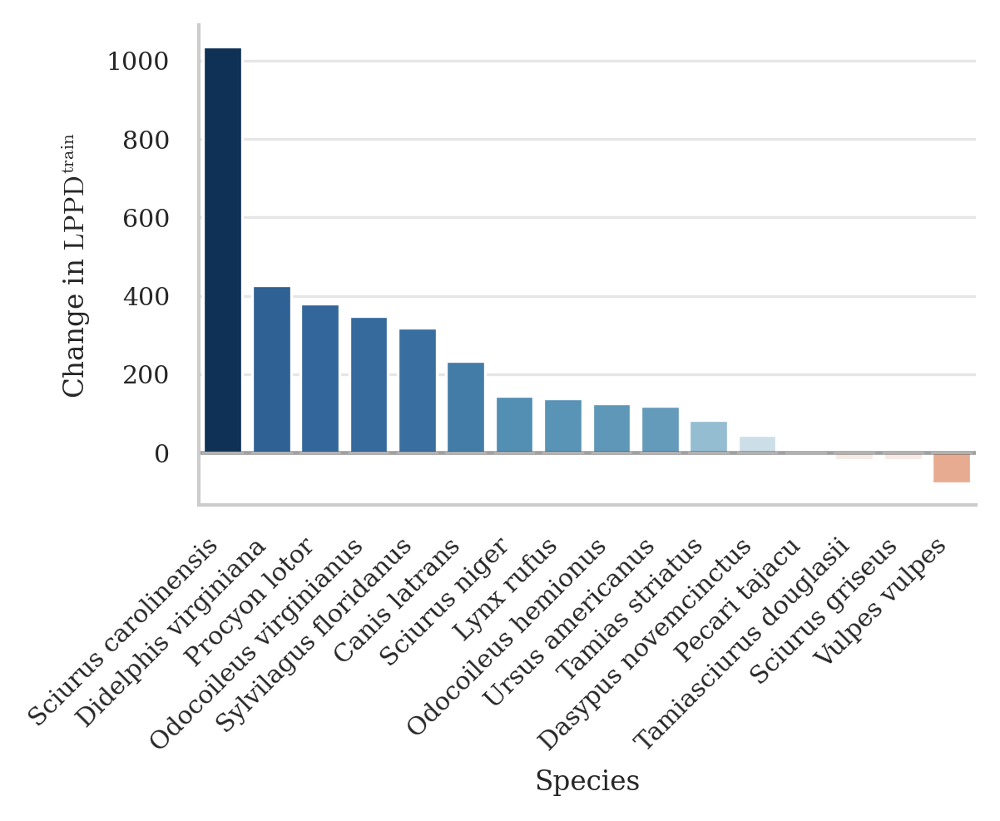

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:06,928 INFO maxp pruned
2026-02-06 20:28:06,932 INFO cmap pruned
2026-02-06 20:28:06,933 INFO kern dropped
2026-02-06 20:28:06,933 INFO post pruned
2026-02-06 20:28:06,933 INFO FFTM dropped
2026-02-06 20:28:06,934 INFO GPOS pruned
2026-02-06 20:28:06,935 INFO GSUB pruned
2026-02-06 20:28:06,937 INFO glyf pruned
2026-02-06 20:28:06,938 INFO Added gid0 to subset
2026-02-06 20:28:06,938 INFO Added first four glyphs to subset
2026-02-06 20:28:06,939 INFO Closing glyph list over 'MATH': 37 glyphs before
2026-02-06 20:28:06,939 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

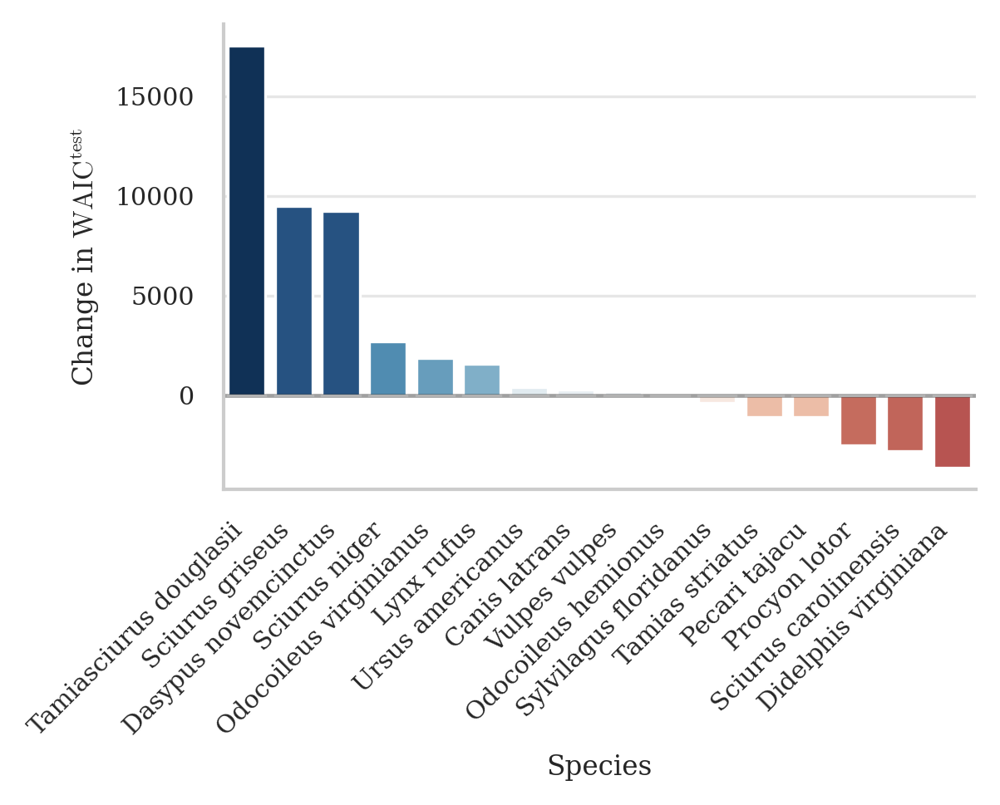

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:07,426 INFO maxp pruned
2026-02-06 20:28:07,430 INFO cmap pruned
2026-02-06 20:28:07,431 INFO kern dropped
2026-02-06 20:28:07,431 INFO post pruned
2026-02-06 20:28:07,432 INFO FFTM dropped
2026-02-06 20:28:07,433 INFO GPOS pruned
2026-02-06 20:28:07,433 INFO GSUB pruned
2026-02-06 20:28:07,436 INFO glyf pruned
2026-02-06 20:28:07,436 INFO Added gid0 to subset
2026-02-06 20:28:07,437 INFO Added first four glyphs to subset
2026-02-06 20:28:07,437 INFO Closing glyph list over 'MATH': 38 glyphs before
2026-02-06 20:28:07,437 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

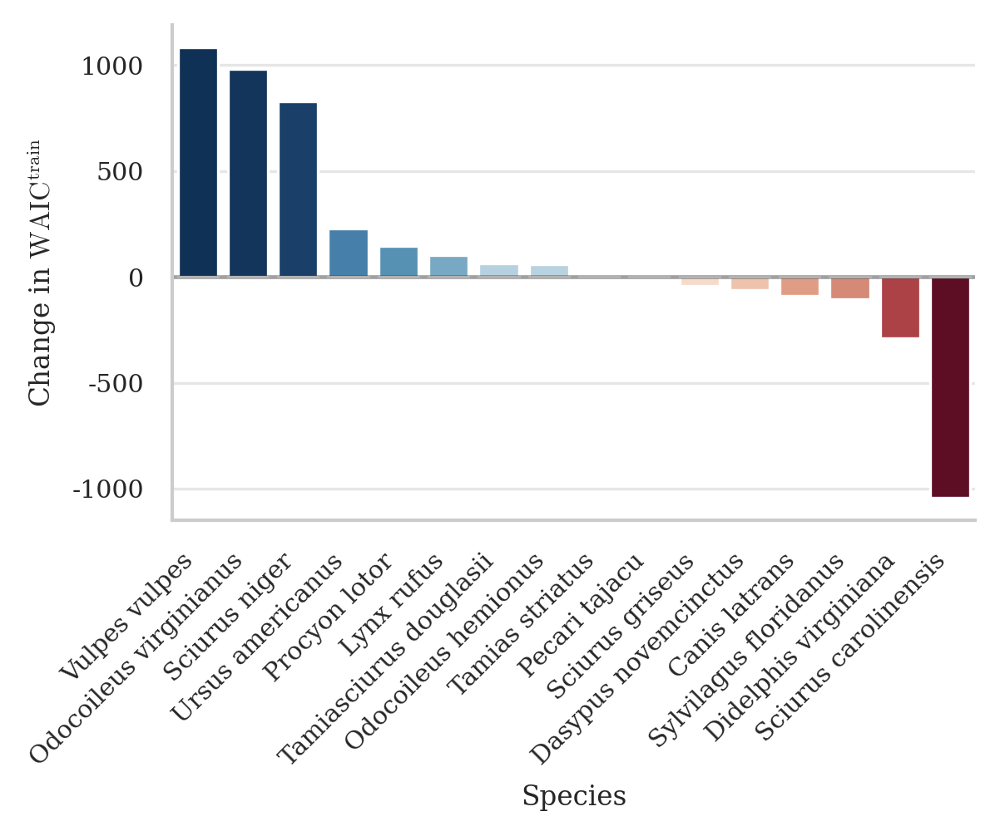

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:07,922 INFO maxp pruned
2026-02-06 20:28:07,926 INFO cmap pruned
2026-02-06 20:28:07,926 INFO kern dropped
2026-02-06 20:28:07,927 INFO post pruned
2026-02-06 20:28:07,927 INFO FFTM dropped
2026-02-06 20:28:07,928 INFO GPOS pruned
2026-02-06 20:28:07,928 INFO GSUB pruned
2026-02-06 20:28:07,931 INFO glyf pruned
2026-02-06 20:28:07,931 INFO Added gid0 to subset
2026-02-06 20:28:07,932 INFO Added first four glyphs to subset
2026-02-06 20:28:07,932 INFO Closing glyph list over 'MATH': 39 glyphs before
2026-02-06 20:28:07,932 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

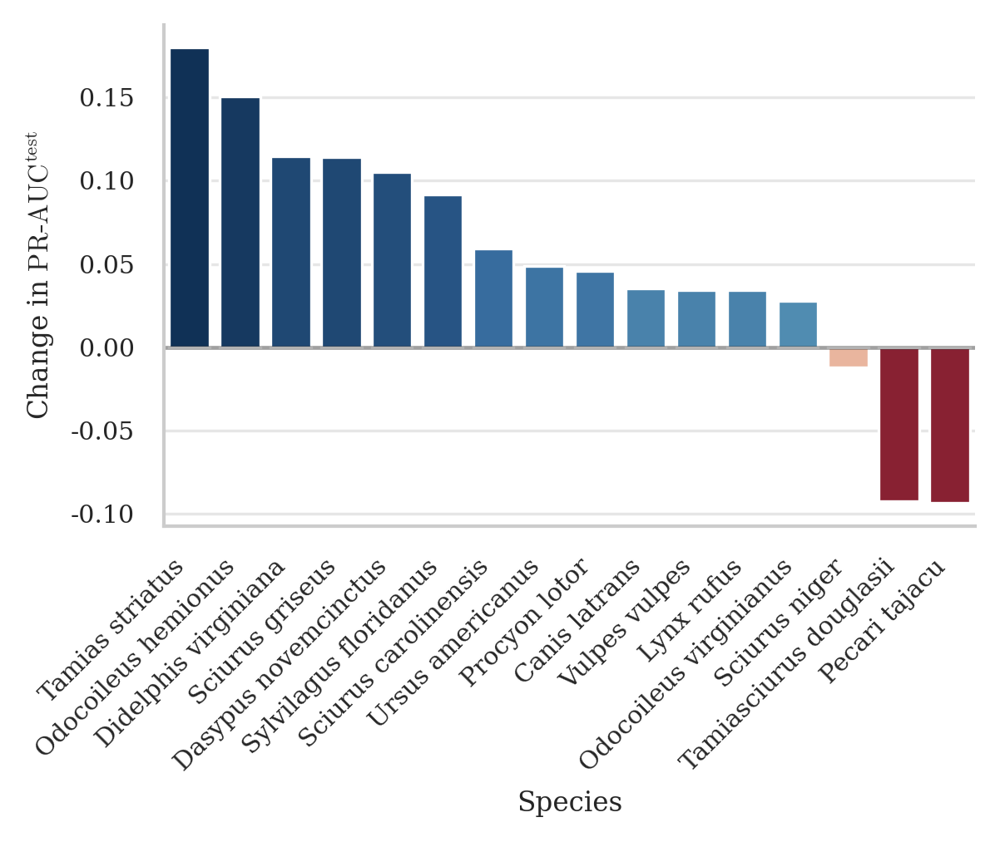

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:08,429 INFO maxp pruned
2026-02-06 20:28:08,433 INFO cmap pruned
2026-02-06 20:28:08,434 INFO kern dropped
2026-02-06 20:28:08,434 INFO post pruned
2026-02-06 20:28:08,434 INFO FFTM dropped
2026-02-06 20:28:08,435 INFO GPOS pruned
2026-02-06 20:28:08,436 INFO GSUB pruned
2026-02-06 20:28:08,438 INFO glyf pruned
2026-02-06 20:28:08,439 INFO Added gid0 to subset
2026-02-06 20:28:08,439 INFO Added first four glyphs to subset
2026-02-06 20:28:08,439 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:28:08,439 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

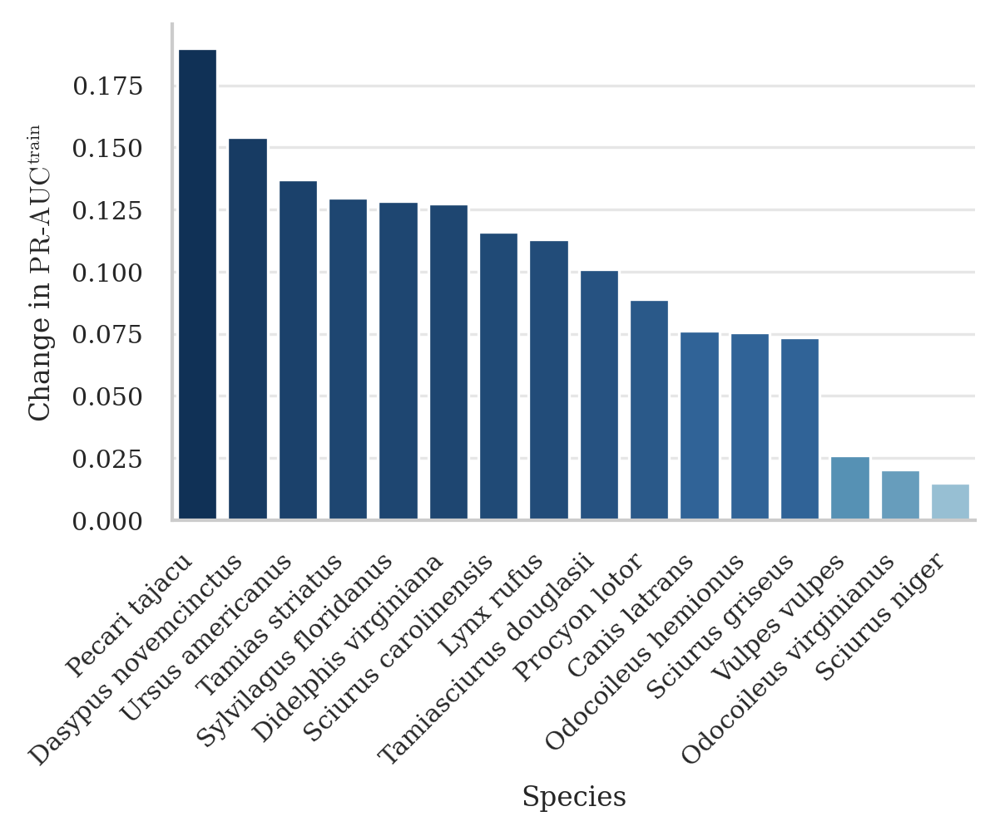

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:08,952 INFO maxp pruned
2026-02-06 20:28:08,957 INFO cmap pruned
2026-02-06 20:28:08,957 INFO kern dropped
2026-02-06 20:28:08,957 INFO post pruned
2026-02-06 20:28:08,958 INFO FFTM dropped
2026-02-06 20:28:08,959 INFO GPOS pruned
2026-02-06 20:28:08,960 INFO GSUB pruned
2026-02-06 20:28:08,963 INFO glyf pruned
2026-02-06 20:28:08,963 INFO Added gid0 to subset
2026-02-06 20:28:08,963 INFO Added first four glyphs to subset
2026-02-06 20:28:08,964 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:28:08,964 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

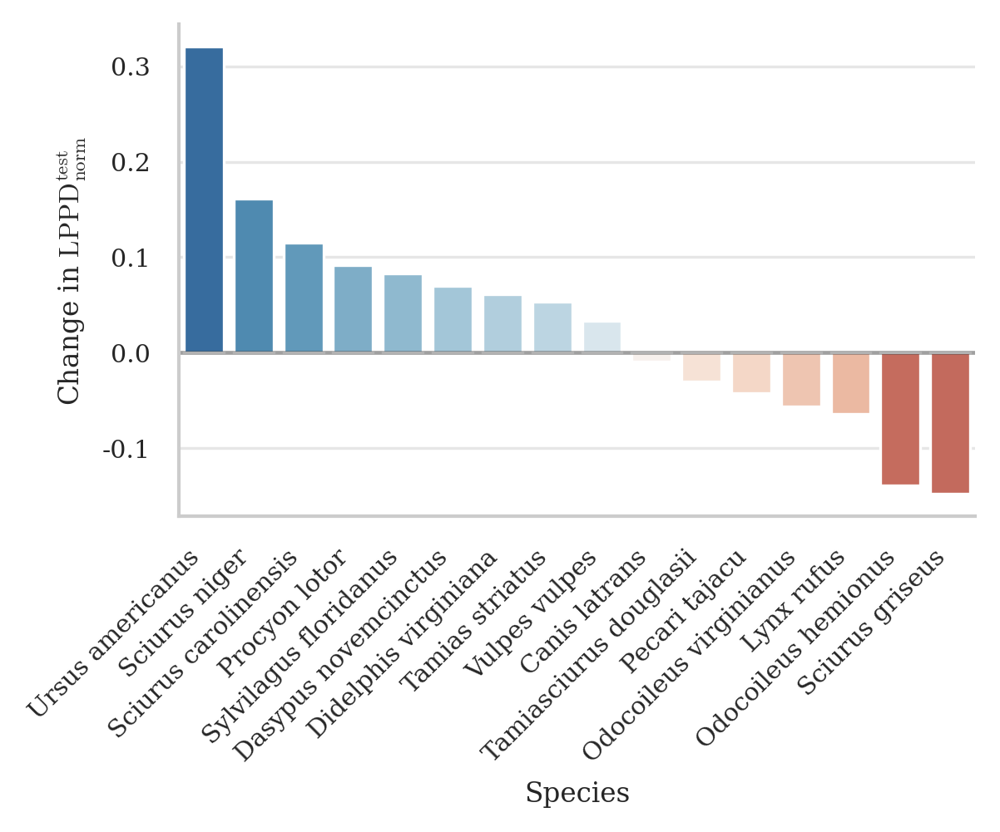

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:09,464 INFO maxp pruned
2026-02-06 20:28:09,468 INFO cmap pruned
2026-02-06 20:28:09,469 INFO kern dropped
2026-02-06 20:28:09,469 INFO post pruned
2026-02-06 20:28:09,469 INFO FFTM dropped
2026-02-06 20:28:09,470 INFO GPOS pruned
2026-02-06 20:28:09,471 INFO GSUB pruned
2026-02-06 20:28:09,474 INFO glyf pruned
2026-02-06 20:28:09,475 INFO Added gid0 to subset
2026-02-06 20:28:09,475 INFO Added first four glyphs to subset
2026-02-06 20:28:09,475 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:28:09,475 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

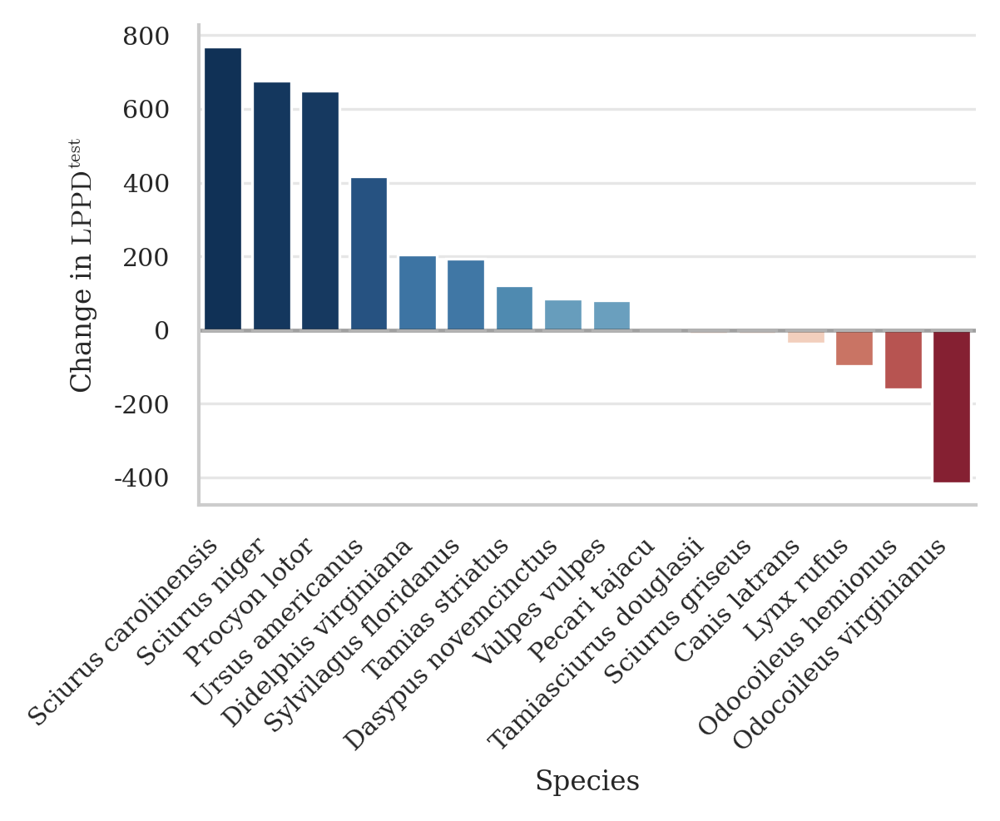

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:10,030 INFO maxp pruned
2026-02-06 20:28:10,034 INFO cmap pruned
2026-02-06 20:28:10,034 INFO kern dropped
2026-02-06 20:28:10,035 INFO post pruned
2026-02-06 20:28:10,035 INFO FFTM dropped
2026-02-06 20:28:10,036 INFO GPOS pruned
2026-02-06 20:28:10,037 INFO GSUB pruned
2026-02-06 20:28:10,039 INFO glyf pruned
2026-02-06 20:28:10,040 INFO Added gid0 to subset
2026-02-06 20:28:10,040 INFO Added first four glyphs to subset
2026-02-06 20:28:10,040 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:28:10,040 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

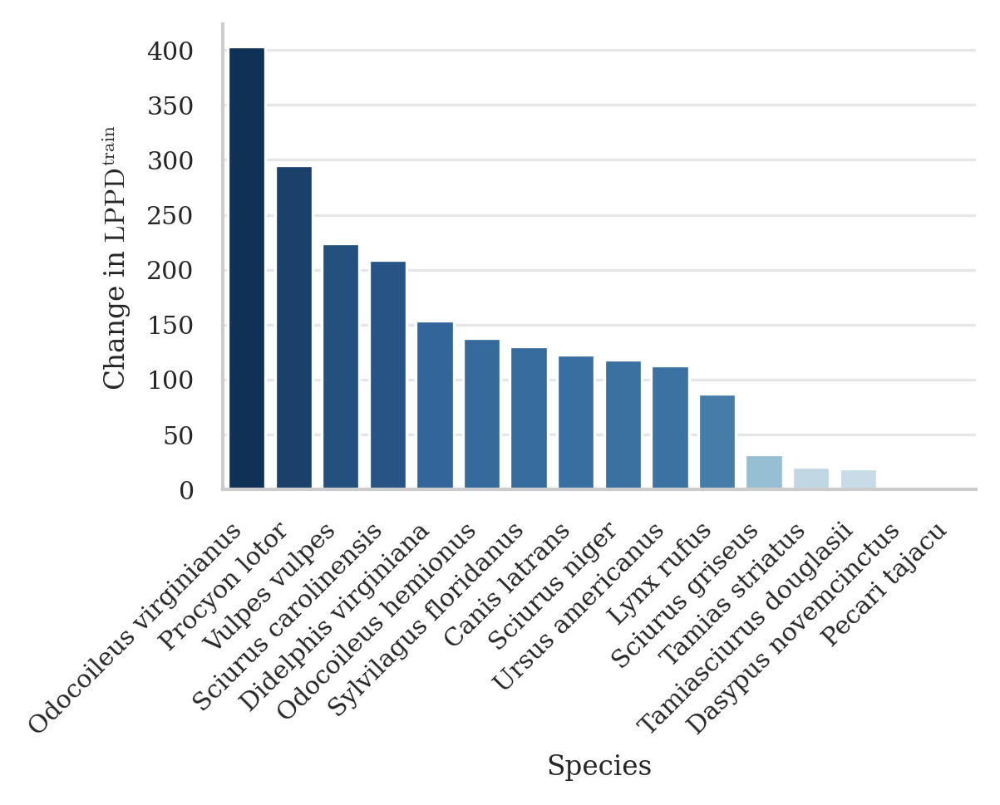

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:10,480 INFO maxp pruned
2026-02-06 20:28:10,484 INFO cmap pruned
2026-02-06 20:28:10,484 INFO kern dropped
2026-02-06 20:28:10,485 INFO post pruned
2026-02-06 20:28:10,485 INFO FFTM dropped
2026-02-06 20:28:10,486 INFO GPOS pruned
2026-02-06 20:28:10,486 INFO GSUB pruned
2026-02-06 20:28:10,489 INFO glyf pruned
2026-02-06 20:28:10,489 INFO Added gid0 to subset
2026-02-06 20:28:10,489 INFO Added first four glyphs to subset
2026-02-06 20:28:10,490 INFO Closing glyph list over 'MATH': 41 glyphs before
2026-02-06 20:28:10,490 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

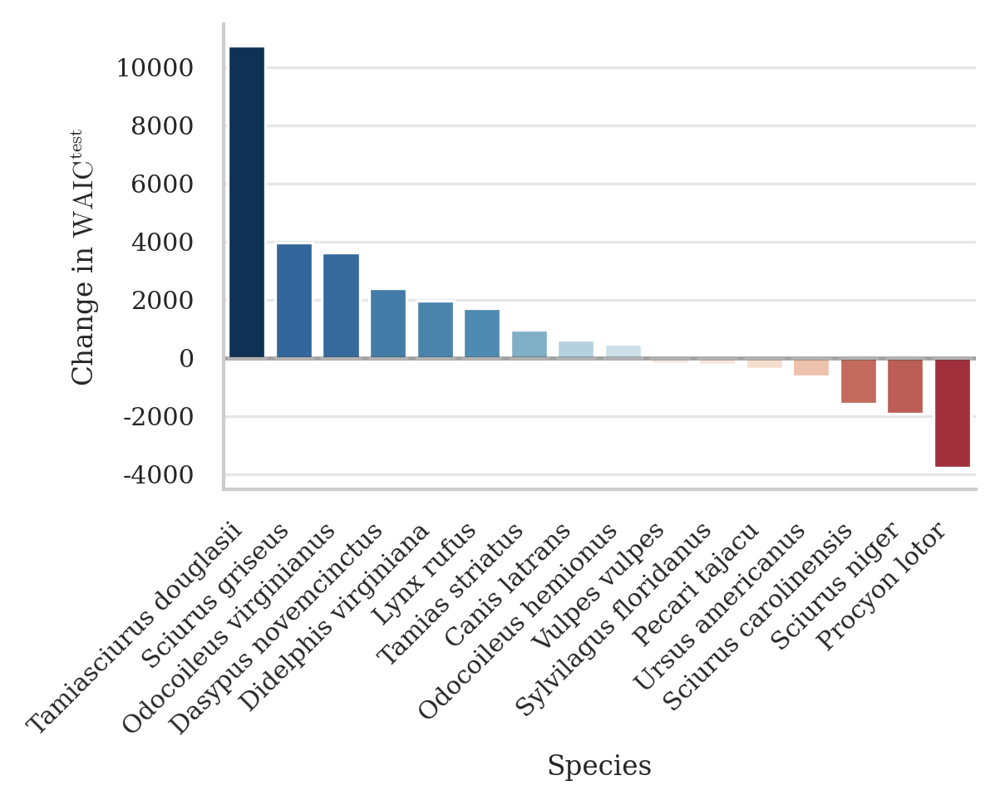

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:10,941 INFO maxp pruned
2026-02-06 20:28:10,945 INFO cmap pruned
2026-02-06 20:28:10,945 INFO kern dropped
2026-02-06 20:28:10,945 INFO post pruned
2026-02-06 20:28:10,945 INFO FFTM dropped
2026-02-06 20:28:10,946 INFO GPOS pruned
2026-02-06 20:28:10,947 INFO GSUB pruned
2026-02-06 20:28:10,949 INFO glyf pruned
2026-02-06 20:28:10,950 INFO Added gid0 to subset
2026-02-06 20:28:10,950 INFO Added first four glyphs to subset
2026-02-06 20:28:10,950 INFO Closing glyph list over 'MATH': 40 glyphs before
2026-02-06 20:28:10,950 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

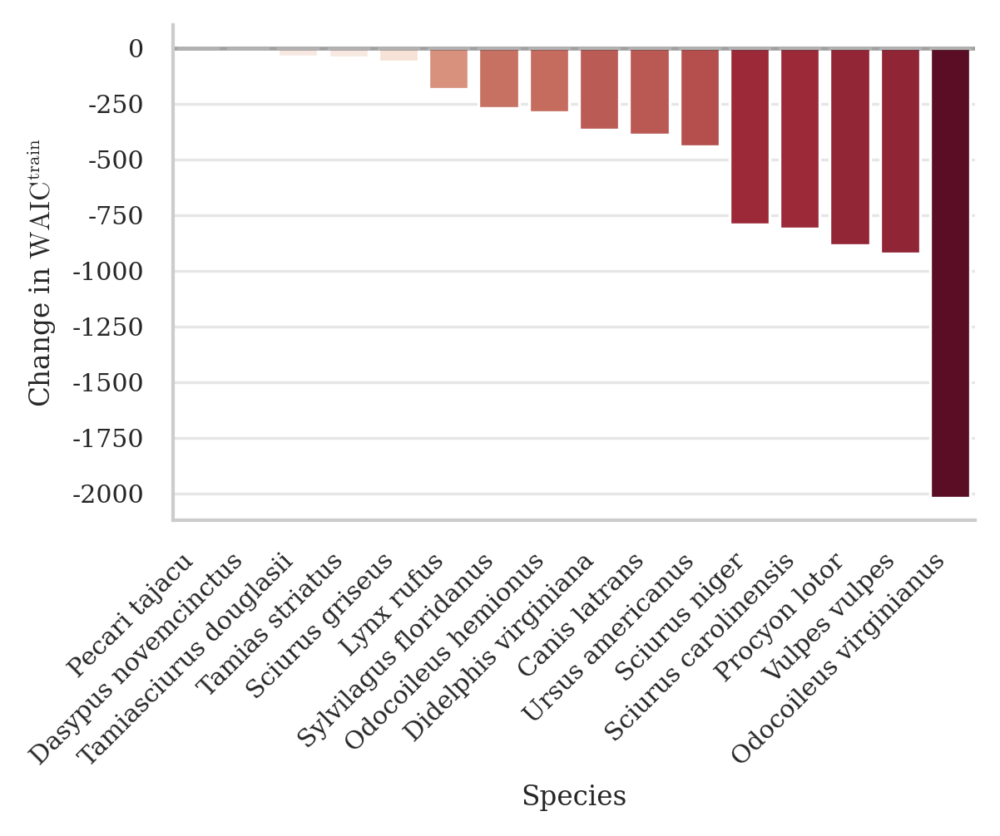

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:11,447 INFO maxp pruned
2026-02-06 20:28:11,451 INFO cmap pruned
2026-02-06 20:28:11,451 INFO kern dropped
2026-02-06 20:28:11,451 INFO post pruned
2026-02-06 20:28:11,451 INFO FFTM dropped
2026-02-06 20:28:11,452 INFO GPOS pruned
2026-02-06 20:28:11,453 INFO GSUB pruned
2026-02-06 20:28:11,455 INFO glyf pruned
2026-02-06 20:28:11,456 INFO Added gid0 to subset
2026-02-06 20:28:11,456 INFO Added first four glyphs to subset
2026-02-06 20:28:11,456 INFO Closing glyph list over 'MATH': 39 glyphs before
2026-02-06 20:28:11,456 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

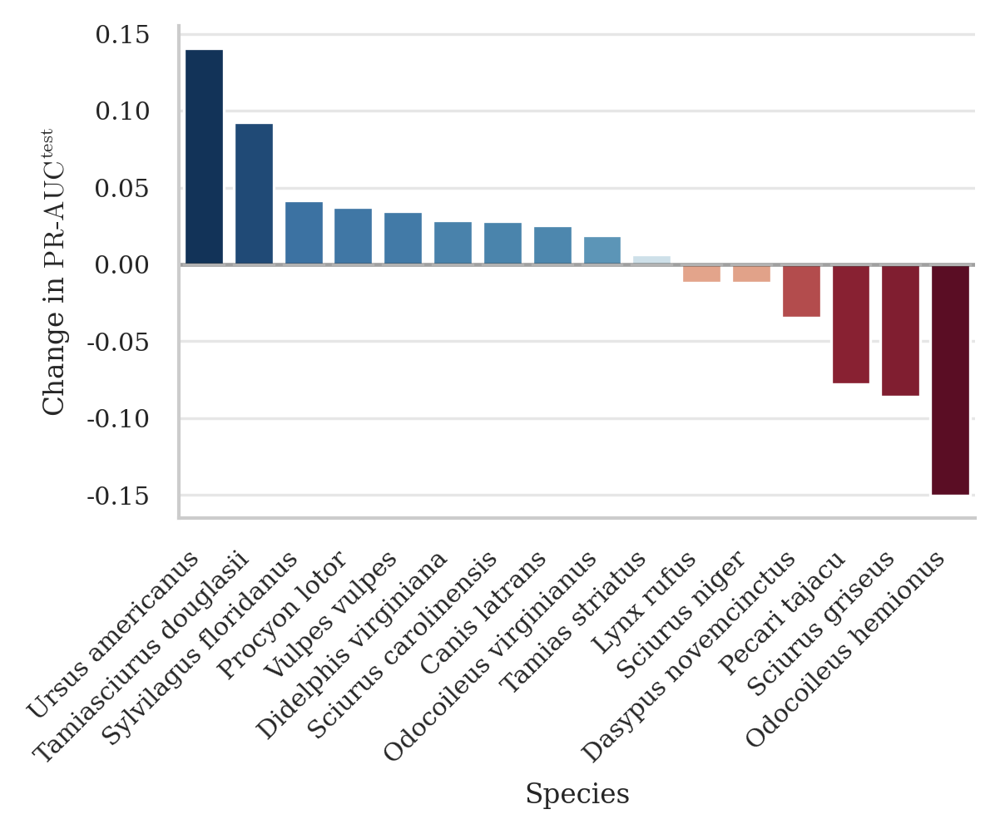

/tmp/ipykernel_2406484/903802401.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/903802401.py:78: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:11,995 INFO maxp pruned
2026-02-06 20:28:11,998 INFO cmap pruned
2026-02-06 20:28:11,999 INFO kern dropped
2026-02-06 20:28:11,999 INFO post pruned
2026-02-06 20:28:11,999 INFO FFTM dropped
2026-02-06 20:28:12,000 INFO GPOS pruned
2026-02-06 20:28:12,001 INFO GSUB pruned
2026-02-06 20:28:12,003 INFO glyf pruned
2026-02-06 20:28:12,004 INFO Added gid0 to subset
2026-02-06 20:28:12,004 INFO Added first four glyphs to subset
2026-02-06 20:28:12,004 INFO Closing glyph list over 'MATH': 41 glyphs before
2026-02-06 20:28:12,004 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 

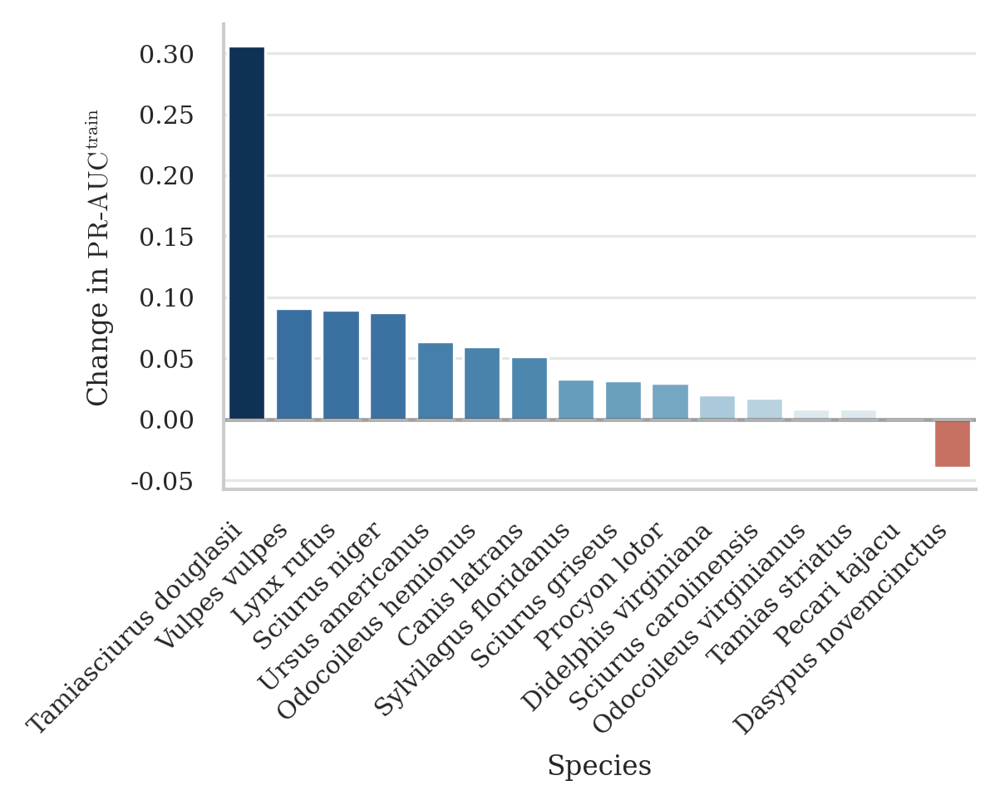

In [26]:
from matplotlib.colors import SymLogNorm

for modality in ["image", "sat"]:
    for metric in [
        "lppd_test_norm",
        "lppd_test",
        "lppd_train",
        "waic_test_waic",
        "waic_train_waic",
        "lr_map_test",
        "lr_map_train",
    ]:

        metric_label = metric_labels.get(metric, metric)

        # Calculate modality uplift for each species
        species_uplift = []
        for species in dfn["taxon_name"].unique():
            if pd.isna(species):
                continue

            species_data = dfn[dfn["taxon_name"] == species]

            # Get best model with the modality
            with_mod = species_data[species_data["modalities"].str.contains(modality)]
            best_with_mod = with_mod[metric].max() if not with_mod.empty else np.nan

            # Get best model without the modality
            without_mod = species_data[
                ~species_data["modalities"].str.contains(modality)
            ]
            best_without_mod = (
                without_mod[metric].max() if not without_mod.empty else np.nan
            )

            # Calculate uplift
            if pd.notna(best_with_mod) and pd.notna(best_without_mod):
                uplift = best_with_mod - best_without_mod
                species_uplift.append(
                    {"species": species, f"{modality}_uplift": uplift}
                )

        # Create DataFrame and sort by uplift
        uplift_df = pd.DataFrame(species_uplift).sort_values(
            f"{modality}_uplift", ascending=False
        )

        # Compute color mapping: set a symmetric range about zero so that 0 gets the zero-point color.

        values = uplift_df[f"{modality}_uplift"]
        if metric in {"lppd_test_norm", "map_test_lr", "map_train_lr"}:
            abs_max = 1
        else:
            abs_max = max(abs(values.min()), abs(values.max()))
        # Use a symmetric logarithmic normalization with a small linear threshold.
        norm = SymLogNorm(linthresh=0.1 * abs_max, vmin=-abs_max, vmax=abs_max, base=10)
        cmap = plt.get_cmap("RdBu")
        colors = [cmap(norm(val)) for val in values]

        width = 0.65 * min(16, max(6, 16 * df["taxon_id"].nunique() / 80))
        plt.figure(figsize=(fig_column_width, 99))
        sns.barplot(
            data=uplift_df,
            y=f"{modality}_uplift",
            x="species",
            palette=colors,
        )

        plt.gca().set_box_aspect(1 / golden_ratio)  # Maintain golden ratio aspect ratio

        modality_title = modality.replace("_", " ").title()
        plt.axhline(y=0, color="black", linestyle="-", alpha=0.3)
        plt.ylabel(f"Change in {metric_label}")
        plt.xlabel("Species")
        plt.xticks(rotation=45, ha="right")

        # plt.title(f'{modality_title} Modality Performance Uplift by Species')
        plt.tight_layout()

        plt.savefig(
            f"{figures_dir}/{modality}_uplift_by_species_{metric}_vertical.pdf",
            bbox_inches="tight",
            dpi=300,
            transparent=True,
        )
        plt.show()
        plt.close()

In [27]:
dfn

,taxon_id,scientific_name,common_name,modalities,image_backbone,sat_backbone,limit_to_range,modalities_scaler,modalities_pca,mean_naive_occupancy_train,...,waic_test_lppd,waic_train_waic,waic_train_p_waic,waic_train_lppd,modality_sort_key,modalities_label,modalities_latex_icon,taxon_name,lppd_test_best,lppd_test_best_norm
1793,febff896-db40-4ac8-bcfe-5bb99a600950,Odocoileus hemionus,mule deer,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.171047,...,-3627.394287,7241.213570,38.693455,-3581.913330,1.00,$X_\text{env}$,\faGlobe[solid],Odocoileus hemionus,-3627.394287,-0.781879
1296,b57debc1-dff2-48d3-a400-f2b5021e71b0,Procyon lotor,northern raccoon,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.227420,...,-13625.679688,20037.830666,40.400684,-9978.514648,1.00,$X_\text{env}$,\faGlobe[solid],Procyon lotor,-13625.679688,0.089224
302,1db1c6e2-2ea9-45a6-ab69-a730133298eb,Tamias striatus,eastern chipmunk,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.024390,...,-3984.976562,2083.889454,28.972986,-1012.971741,1.00,$X_\text{env}$,\faGlobe[solid],Tamias striatus,-3984.976562,0.179190
1225,ac0e8ba7-7261-4d17-8645-11ed3d02165a,Vulpes vulpes,red fox,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.053237,...,-4187.954590,6374.411575,33.235817,-3153.969971,1.00,$X_\text{env}$,\faGlobe[solid],Vulpes vulpes,-4187.954590,0.368252
1651,f67c4346-bbbd-43d5-9b19-b541d493019b,Tamiasciurus douglasii,douglas's squirrel,covariates,None,None,True,{'covariates': StandardScaler()},{'covariates': PCA(n_components=26)},0.009259,...,-722.241638,320.843935,14.517106,-145.904861,1.00,$X_\text{env}$,\faGlobe[solid],Tamiasciurus douglasii,-722.241638,-0.164668
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
624,5acf63fb-339d-42b1-af7e-95f6151ae5fb,Pecari tajacu,collared peccary,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.166667,...,-502.519775,65.706303,2.275913,-30.577238,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Pecari tajacu,-502.519775,0.128189
553,436ddfdd-bc43-44c3-a25d-34671d3430a0,Ursus americanus,american black bear,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.083498,...,-2872.306152,7545.381439,193.440964,-3579.249756,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Ursus americanus,-2872.306152,0.292999
1689,f67c4346-bbbd-43d5-9b19-b541d493019b,Tamiasciurus douglasii,douglas's squirrel,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.009259,...,-525.716431,344.317696,19.184742,-152.974106,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Tamiasciurus douglasii,-525.716431,0.354830
340,1db1c6e2-2ea9-45a6-ab69-a730133298eb,Tamias striatus,eastern chipmunk,"covariates,sat,image",dinov2_vitb14,alphaearth,True,"{'covariates': StandardScaler(), 'image': Stan...","{'covariates': PCA(n_components=26), 'image': ...",0.024390,...,-3207.900146,1942.986115,144.372025,-827.121033,3.06,"$X_\text{env},X_\text{sat},X_\text{img}$",\faGlobe[solid]$+$\faSatellite[solid]$+$\faCam...,Tamias striatus,-3207.900146,0.524296


/tmp/ipykernel_2406484/3369278208.py:110: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:14,789 INFO maxp pruned
2026-02-06 20:28:14,792 INFO cmap pruned
2026-02-06 20:28:14,793 INFO kern dropped
2026-02-06 20:28:14,793 INFO post pruned
2026-02-06 20:28:14,793 INFO FFTM dropped
2026-02-06 20:28:14,794 INFO GPOS pruned
2026-02-06 20:28:14,795 INFO GSUB pruned
2026-02-06 20:28:14,798 INFO glyf pruned
2026-02-06 20:28:14,799 INFO Added gid0 to subset
2026-02-06 20:28:14,799 INFO Added first four glyphs to subset
2026-02-06 20:28:14,799 INFO Closing glyph list over 'MATH': 42 glyphs before
2026-02-06 20:28:14,799 INFO Glyph names: ['.notdef', '.null', 'D', 'F', 'I', 'L', 'M', 'N', 'P', 'S', 'T', 'U', 'a', 'b', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
2026-02-06 20:28:14,800 INFO Glyph IDs:   [0,

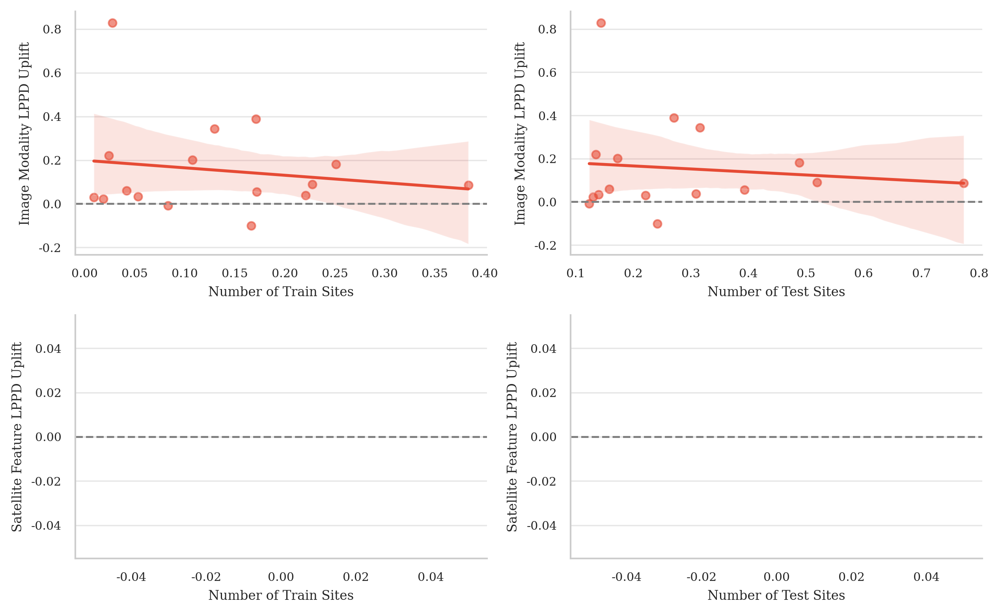

In [28]:
# Calculate uplift for image and sat_feature modalities
uplift_data = []
for species in dfn["taxon_name"].unique():
    if pd.isna(species):
        continue

    species_df = dfn[dfn["taxon_name"] == species]

    # Image modality uplift
    with_img = species_df[species_df["modalities"].str.contains("image")]
    without_img = species_df[~species_df["modalities"].str.contains("image")]

    best_with_img = with_img["lppd_test_norm"].max() if not with_img.empty else np.nan
    best_without_img = (
        without_img["lppd_test_norm"].max() if not without_img.empty else np.nan
    )

    image_uplift = (
        best_with_img - best_without_img
        if pd.notna(best_with_img) and pd.notna(best_without_img)
        else np.nan
    )

    # Satellite feature modality uplift
    with_satf = species_df[species_df["modalities"].str.contains("sat_feature")]
    without_satf = species_df[~species_df["modalities"].str.contains("sat_feature")]

    best_with_satf = (
        with_satf["lppd_test_norm"].max() if not with_satf.empty else np.nan
    )
    best_without_satf = (
        without_satf["lppd_test_norm"].max() if not without_satf.empty else np.nan
    )

    sat_feature_uplift = (
        best_with_satf - best_without_satf
        if pd.notna(best_with_satf) and pd.notna(best_without_satf)
        else np.nan
    )

    # Get site counts
    num_train_sites = species_df["mean_naive_occupancy_train"].iloc[0]
    num_test_sites = species_df["mean_naive_occupancy_test"].iloc[0]

    uplift_data.append(
        {
            "taxon_name": species,
            "image_uplift": image_uplift,
            "sat_feature_uplift": sat_feature_uplift,
            "num_train_sites": num_train_sites,
            "num_test_sites": num_test_sites,
        }
    )

plot_df = pd.DataFrame(uplift_data)

# Create scatter plots
fig, axes = plt.subplots(2, 2, figsize=(fig_page_width, fig_page_width / golden_ratio))

# Image uplift vs. Train sites
sns.regplot(
    ax=axes[0, 0],
    data=plot_df,
    x="num_train_sites",
    y="image_uplift",
    scatter_kws={"alpha": 0.6},
)
axes[0, 0].set_xlabel("Number of Train Sites")
axes[0, 0].set_ylabel("Image Modality LPPD Uplift")
axes[0, 0].axhline(0, color="grey", linestyle="--")

# Image uplift vs. Test sites
sns.regplot(
    ax=axes[0, 1],
    data=plot_df,
    x="num_test_sites",
    y="image_uplift",
    scatter_kws={"alpha": 0.6},
)
axes[0, 1].set_xlabel("Number of Test Sites")
axes[0, 1].set_ylabel("Image Modality LPPD Uplift")
axes[0, 1].axhline(0, color="grey", linestyle="--")

# Satellite feature uplift vs. Train sites
sns.regplot(
    ax=axes[1, 0],
    data=plot_df,
    x="num_train_sites",
    y="sat_feature_uplift",
    color="g",
    scatter_kws={"alpha": 0.6},
)
axes[1, 0].set_xlabel("Number of Train Sites")
axes[1, 0].set_ylabel("Satellite Feature LPPD Uplift")
axes[1, 0].axhline(0, color="grey", linestyle="--")

# Satellite feature uplift vs. Test sites
sns.regplot(
    ax=axes[1, 1],
    data=plot_df,
    x="num_test_sites",
    y="sat_feature_uplift",
    color="g",
    scatter_kws={"alpha": 0.6},
)
axes[1, 1].set_xlabel("Number of Test Sites")
axes[1, 1].set_ylabel("Satellite Feature LPPD Uplift")
axes[1, 1].axhline(0, color="grey", linestyle="--")

plt.tight_layout()
plt.savefig(
    f"{figures_dir}/lppd_uplift_vs_sites.pdf",
    bbox_inches="tight",
    dpi=300,
    transparent=True,
)
plt.show()
plt.close()

/tmp/ipykernel_2406484/964813242.py:60: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:15,357 INFO maxp pruned
2026-02-06 20:28:15,361 INFO cmap pruned
2026-02-06 20:28:15,362 INFO kern dropped
2026-02-06 20:28:15,362 INFO post pruned
2026-02-06 20:28:15,362 INFO FFTM dropped
2026-02-06 20:28:15,363 INFO GPOS pruned
2026-02-06 20:28:15,364 INFO GSUB pruned
2026-02-06 20:28:15,367 INFO glyf pruned
2026-02-06 20:28:15,368 INFO Added gid0 to subset
2026-02-06 20:28:15,368 INFO Added first four glyphs to subset
2026-02-06 20:28:15,369 INFO Closing glyph list over 'MATH': 43 glyphs before
2026-02-06 20:28:15,369 INFO Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'i', 'j', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'v', 'x', 'y', 'zero']
2026-02-06 20:28:15,369 INFO Glyph IDs:   [

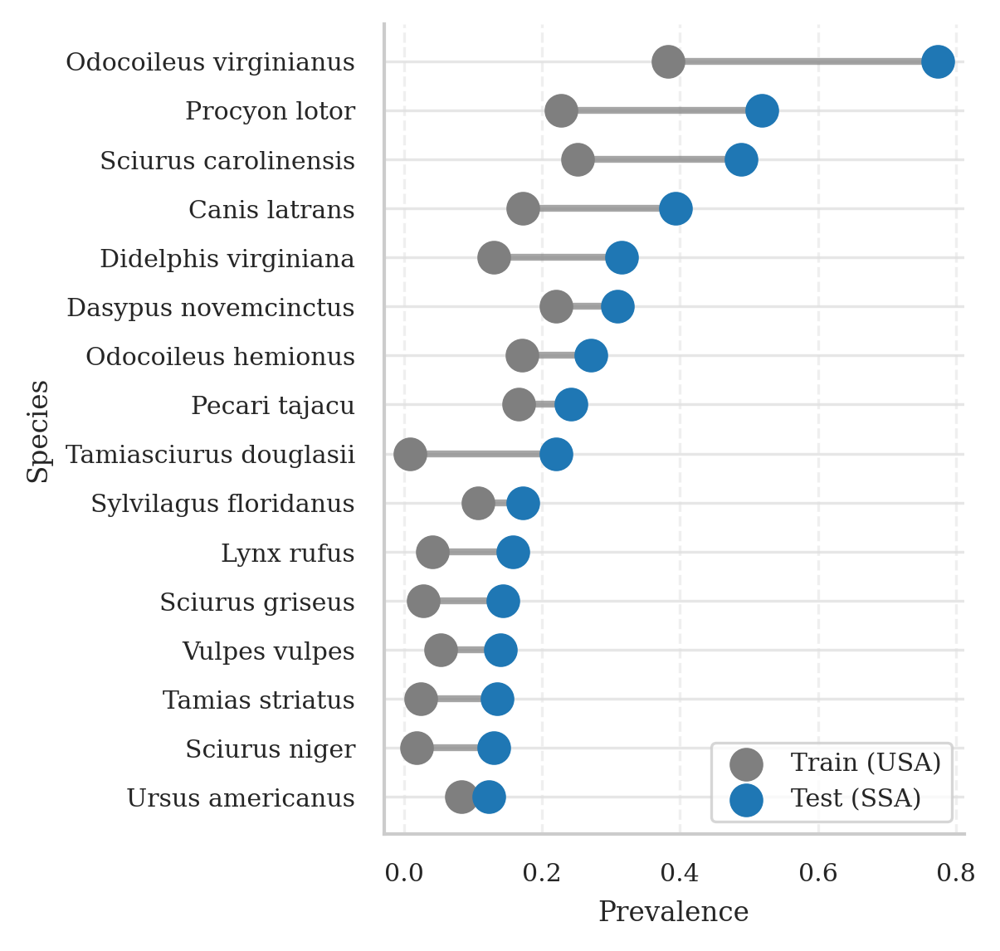

In [29]:
# Aggregate data to get the mean occupancy for train and test sets for each species
occupancy_shift_df = (
    dfn.groupby("taxon_name")
    .agg(
        {
            "mean_naive_occupancy_train": "mean",
            "mean_naive_occupancy_test": "mean",
            "taxon_color": "first",
        }
    )
    .reset_index()
)

# Sort species by their test set occupancy for a cleaner plot
occupancy_shift_df = occupancy_shift_df.sort_values(
    "mean_naive_occupancy_test", ascending=True
)

# Create the dumbbell plot
height = 0.65 * min(16, max(6, 16 * df["taxon_id"].nunique() / 80))
fig, ax = plt.subplots(figsize=(fig_column_width, height))

# Plot the lines connecting train and test values
ax.hlines(
    y=occupancy_shift_df["taxon_name"],
    xmin=occupancy_shift_df["mean_naive_occupancy_train"],
    xmax=occupancy_shift_df["mean_naive_occupancy_test"],
    color="grey",
    alpha=0.7,
    linewidth=2,
)

# Plot the points for train and test occupancy
train_color = sns.color_palette("tab10")[7]
test_color = sns.color_palette("tab10")[0]
ax.scatter(
    occupancy_shift_df["mean_naive_occupancy_train"],
    occupancy_shift_df["taxon_name"],
    color=train_color,
    s=80,
    label="Train (USA)",
    zorder=3,
)
ax.scatter(
    occupancy_shift_df["mean_naive_occupancy_test"],
    occupancy_shift_df["taxon_name"],
    color=test_color,
    s=80,
    label="Test (SSA)",
    zorder=3,
)

# Customize the plot
ax.set_xlabel("Prevalence")
ax.set_ylabel("Species")
ax.legend(loc="lower right")
ax.grid(True, which="major", axis="x", linestyle="--", alpha=0.5)

# Adjust layout and save the figure
plt.tight_layout()
plt.savefig(
    f"{figures_dir}/occupancy_shift.pdf", bbox_inches="tight", dpi=300, transparent=True
)
plt.show()
plt.close()

/tmp/ipykernel_2406484/3992521333.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_2406484/3992521333.py:35: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
2026-02-06 20:28:16,361 INFO maxp pruned
2026-02-06 20:28:16,364 INFO cmap pruned
2026-02-06 20:28:16,365 INFO kern dropped
2026-02-06 20:28:16,365 INFO post pruned
2026-02-06 20:28:16,365 INFO FFTM dropped
2026-02-06 20:28:16,366 INFO GPOS pruned
2026-02-06 20:28:16,368 INFO GSUB pruned
2026-02-06 20:28:16,370 INFO glyf pruned
2026-02-06 20:28:16,370 INFO Added gid0 to subset
2026-02-06 20:28:16,371 INFO Added first four glyphs to subset
2026-02-06 20:28:16,371 INFO Closing glyph list over 'MATH': 42 glyphs before
2026-02-06 20:28:16,371 INFO Glyph names: ['.notdef', '.null', 'C', 'D', 'L', 'O', 'P', 'S', 'T', 'U', 'V', 'a', 'b', 'c', 'd'

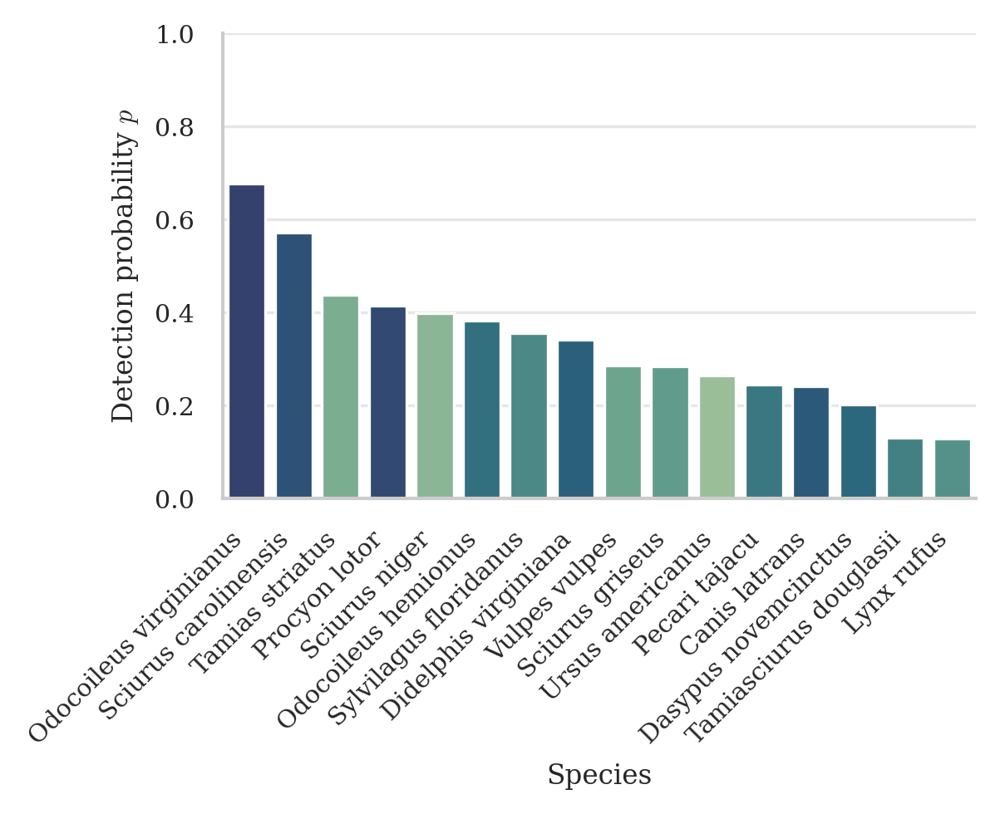

In [30]:
# Aggregate data to get the mean detection probability for the test set for each species
det_prob_df = (
    dfn.groupby("taxon_name")
    .agg({"mean_posterior_p_test": "mean", "taxon_color": "first"})
    .reset_index()
)

# Sort species by their detection probability for a cleaner plot
det_prob_df = det_prob_df.sort_values("mean_posterior_p_test", ascending=False)

# Create a color map from taxon name to color
color_map = pd.Series(
    det_prob_df.taxon_color.values, index=det_prob_df.taxon_name
).to_dict()

# Create the bar plot
plt.figure(figsize=(fig_column_width, 99 * fig_column_width))

sns.barplot(
    data=det_prob_df,
    x="taxon_name",
    y="mean_posterior_p_test",
    palette=color_map,
)
plt.xticks(rotation=45, ha="right")

plt.gca().set_box_aspect(1 / golden_ratio)

plt.ylim(0, 1)


# Customize the plot
plt.xlabel("Species")
plt.ylabel(r"Detection probability $p$")
plt.tight_layout()

# Save and show the plot
plt.savefig(
    f"{figures_dir}/detection_probability_by_species.pdf",
    bbox_inches="tight",
    dpi=300,
    transparent=True,
)
plt.show()
plt.close()

In [31]:
print("Estimated detection probabilities by species:")
det_prob_df[["taxon_name", "mean_posterior_p_test"]]

Estimated detection probabilities by species:


,taxon_name,mean_posterior_p_test
5,Odocoileus virginianus,0.676291
8,Sciurus carolinensis,0.571961
12,Tamias striatus,0.437800
7,Procyon lotor,0.415016
10,Sciurus niger,0.397687
4,Odocoileus hemionus,0.381500
11,Sylvilagus floridanus,0.355933
2,Didelphis virginiana,0.341543
15,Vulpes vulpes,0.286433
9,Sciurus griseus,0.284346


In [32]:
# ANOVA to test whether in-situ imagery improves normalized test LPPD
anova_rows = []
with_image_scores = []
without_image_scores = []

for species in sorted(dfn["taxon_name"].dropna().unique()):
    species_df = dfn[dfn["taxon_name"] == species]
    with_img = species_df[species_df["modalities"].str.contains("image")]
    without_img = species_df[~species_df["modalities"].str.contains("image")]
    if with_img.empty or without_img.empty:
        continue

    best_with = with_img["lppd_test_norm"].max()
    best_without = without_img["lppd_test_norm"].max()

    with_image_scores.append(best_with)
    without_image_scores.append(best_without)

    anova_rows.append(
        {
            "taxon_name": species,
            "best_with_image": best_with,
            "best_without_image": best_without,
            "image_improvement": best_with - best_without,
        }
    )

anova_df = pd.DataFrame(anova_rows)

if len(anova_df) < 2:
    print("Not enough species with and without imagery to run ANOVA.")
else:
    f_stat, p_value = stats.f_oneway(with_image_scores, without_image_scores)
    print("One-way ANOVA on best normalized test LPPD with vs. without in-situ imagery")
    print(f"Species included: {len(anova_df)}")
    print(
        f"Group means: with image = {np.mean(with_image_scores):.4f}, without image = {np.mean(without_image_scores):.4f}"
    )
    print(f"F-statistic = {f_stat:.4f}, p-value = {p_value:.4e}")

anova_df.sort_values("image_improvement", ascending=False)

One-way ANOVA on best normalized test LPPD with vs. without in-situ imagery
Species included: 16
Group means: with image = 0.3313, without image = 0.1769
F-statistic = 2.5136, p-value = 1.2335e-01


,taxon_name,best_with_image,best_without_image,image_improvement
9,Sciurus griseus,0.397799,-0.431607,0.829406
4,Odocoileus hemionus,-0.174060,-0.563477,0.389417
2,Didelphis virginiana,0.379438,0.035609,0.343829
12,Tamias striatus,0.548763,0.328712,0.220051
11,Sylvilagus floridanus,0.271104,0.069833,0.201270
8,Sciurus carolinensis,0.609625,0.428368,0.181257
7,Procyon lotor,0.444966,0.355715,0.089250
5,Odocoileus virginianus,0.444762,0.358414,0.086348
3,Lynx rufus,0.236418,0.176809,0.059609
0,Canis latrans,0.025391,-0.029668,0.055059


In [33]:
# Paired tests (per-species) for in-situ imagery uplift
paired_rows = []
with_image_scores = []
without_image_scores = []
diffs = []

for species in sorted(dfn["taxon_name"].dropna().unique()):
    species_df = dfn[dfn["taxon_name"] == species]
    with_img = species_df[species_df["modalities"].str.contains("image")]
    without_img = species_df[~species_df["modalities"].str.contains("image")]
    if with_img.empty or without_img.empty:
        continue

    best_with = with_img["lppd_test_norm"].max()
    best_without = without_img["lppd_test_norm"].max()
    diff = best_with - best_without

    with_image_scores.append(best_with)
    without_image_scores.append(best_without)
    diffs.append(diff)

    paired_rows.append(
        {
            "taxon_name": species,
            "best_with_image": best_with,
            "best_without_image": best_without,
            "image_improvement": diff,
        }
    )

paired_df = pd.DataFrame(paired_rows)

if paired_df.empty:
    print("Not enough species with and without imagery to run paired tests.")
else:
    diffs_arr = np.asarray(diffs)
    with_arr = np.asarray(with_image_scores)
    without_arr = np.asarray(without_image_scores)

    # Paired t-test on per-species best scores
    t_stat, t_p = stats.ttest_rel(with_arr, without_arr)
    print(
        "Paired t-test on best normalized test LPPD (with vs. without in-situ imagery)"
    )
    print(f"Species included: {len(paired_df)}")
    print(
        f"Group means: with image = {with_arr.mean():.4f}, without image = {without_arr.mean():.4f}, mean diff = {diffs_arr.mean():.4f}"
    )
    print(f"t-statistic = {t_stat:.4f}, p-value = {t_p:.4e}")

    # Wilcoxon signed-rank test on paired differences
    if np.allclose(diffs_arr, 0):
        w_stat, w_p = 0.0, 1.0
        print("Wilcoxon signed-rank test: all differences are zero; returning p = 1.0")
    else:
        w_stat, w_p = stats.wilcoxon(
            diffs_arr, alternative="two-sided", zero_method="wilcox"
        )
        print(f"Wilcoxon signed-rank test: W = {w_stat:.4f}, p-value = {w_p:.4e}")

    # Permutation test by random sign flips on paired differences
    rng = np.random.default_rng(0)
    n_perm = 10000
    obs_mean = diffs_arr.mean()
    perm_means = np.empty(n_perm)
    for i in range(n_perm):
        signs = rng.choice([-1, 1], size=diffs_arr.shape[0])
        perm_means[i] = np.mean(signs * diffs_arr)
    perm_p = (np.sum(np.abs(perm_means) >= abs(obs_mean)) + 1) / (n_perm + 1)
    print(
        f"Permutation test on mean paired difference: mean diff = {obs_mean:.4f}, p-value = {perm_p:.4e}"
    )

paired_df.sort_values("image_improvement", ascending=False)

Paired t-test on best normalized test LPPD (with vs. without in-situ imagery)
Species included: 16
Group means: with image = 0.3313, without image = 0.1769, mean diff = 0.1544
t-statistic = 2.7910, p-value = 1.3706e-02
Wilcoxon signed-rank test: W = 11.0000, p-value = 1.6785e-03
Permutation test on mean paired difference: mean diff = 0.1544, p-value = 2.2998e-03


,taxon_name,best_with_image,best_without_image,image_improvement
9,Sciurus griseus,0.397799,-0.431607,0.829406
4,Odocoileus hemionus,-0.174060,-0.563477,0.389417
2,Didelphis virginiana,0.379438,0.035609,0.343829
12,Tamias striatus,0.548763,0.328712,0.220051
11,Sylvilagus floridanus,0.271104,0.069833,0.201270
8,Sciurus carolinensis,0.609625,0.428368,0.181257
7,Procyon lotor,0.444966,0.355715,0.089250
5,Odocoileus virginianus,0.444762,0.358414,0.086348
3,Lynx rufus,0.236418,0.176809,0.059609
0,Canis latrans,0.025391,-0.029668,0.055059


In [34]:
# to get rpy2 working,
# conda install -c r r-base  r-essentials \
# r-matrix r-survival r-nloptr r-insight \
# r-ggpubr r-cowplot r-ggbeeswarm \ r-performance r-rstatix r-dplyr r-ggnewscale \
# cmake
# pip install rpy2

In [35]:
import rpy2

%load_ext rpy2.ipython

mmocc = df_raw.copy()
mmocc["lppd_test_norm"] = (mmocc["lppd_test"] - mmocc["lppd_null_test"]) / (
    mmocc["lppd_oracle_test"] - mmocc["lppd_null_test"]
)

2026-02-06 20:28:17,202 INFO cffi mode is CFFI_MODE.ANY
2026-02-06 20:28:17,210 INFO R home found: /data/vision/beery/scratch/timm/micromamba/envs/mmocc/lib/R
2026-02-06 20:28:17,986 INFO R library path: 
2026-02-06 20:28:17,987 INFO LD_LIBRARY_PATH: 
2026-02-06 20:28:18,048 INFO Default options to initialize R: rpy2, --quiet, --no-save
2026-02-06 20:28:18,453 INFO Environment variable "PWD" redefined by R and overriding existing variable. Current: "/data/vision/beery/scratch/timm", R: "/data/vision/beery/scratch/timm/multimodal_occupancy/mmocc/analysis"
2026-02-06 20:28:18,940 INFO R is already initialized. No need to initialize.


-0.7818792190966934 0.7099430207494962
-0.7818792190966934 0.7099430207494962
-0.7818792190966934 0.7099430207494962
mod_str
covariates            16
sat                   16
image                 16
covariatessat         16
covariatesimage       16
imagesat              16
covariatesimagesat    16
Name: count, dtype: int64


<Axes: xlabel='mean_frac_eff', ylabel='lppd_test_norm'>

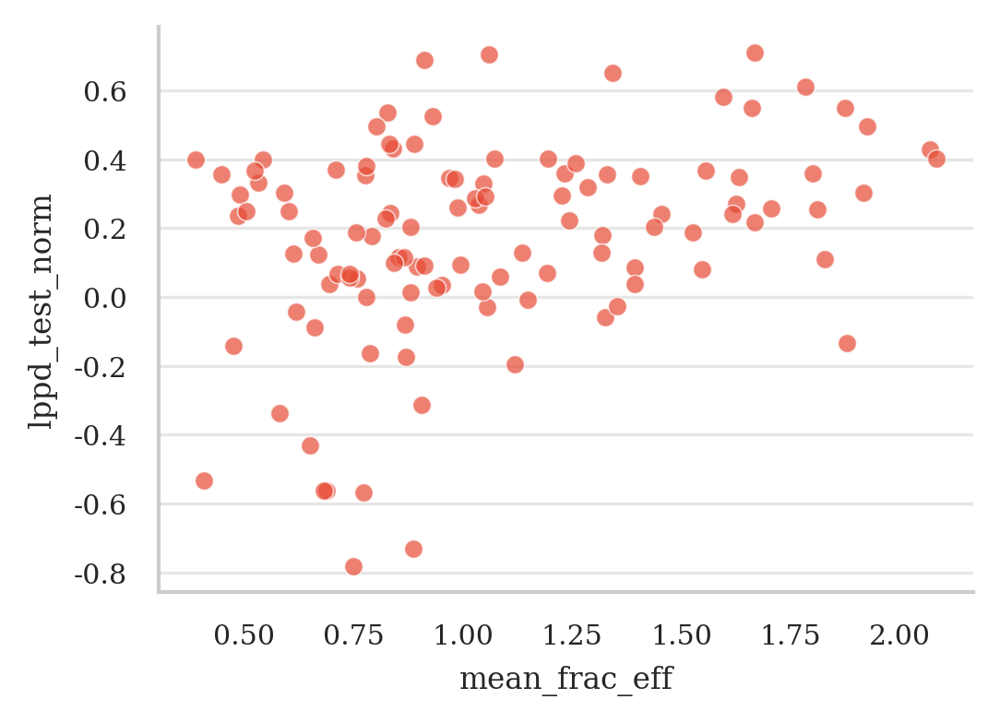

In [36]:
dfnr = dfn[
    (
        ~dfn["sat_backbone"].isin(
            [
                "dinov3",
            ]
        )
    )
]
print(dfnr.lppd_test_norm.min(), dfnr.lppd_test_norm.max())
# removes a lot of noise
min_occupancy = 0.1  # TODO
dfnr = dfnr[(dfnr["mean_naive_occupancy_test"] >= min_occupancy)]
print(dfnr.lppd_test_norm.min(), dfnr.lppd_test_norm.max())
# this recreates timm's filtering steps, will remove
default_image_backbone = "dinov2_vitb14"
default_sat_backbone = "alphaearth"
dfnr = dfnr[
    (
        (dfnr["image_backbone"] == default_image_backbone)
        ^ (dfnr["image_backbone"].isna())
    )
    & ((dfnr["sat_backbone"] == default_sat_backbone) ^ (dfnr["sat_backbone"].isna()))
]
print(dfnr.lppd_test_norm.min(), dfnr.lppd_test_norm.max())

dino_alpha = dfnr.copy()


def canonical_mod_str(modalities):
    if isinstance(modalities, (list, tuple, set)):
        raw_modalities = list(modalities)
    elif pd.isna(modalities):
        return None
    else:
        raw_modalities = [m.strip() for m in str(modalities).split(",") if m.strip()]

    alias_map = {
        "covariates": "covariates",
        "env": "covariates",
        "image": "image",
        "img": "image",
        "sat": "sat",
        "sat_feature": "sat",
    }

    normalized = []
    for modality in raw_modalities:
        canonical = alias_map.get(modality, modality)
        if canonical in ("covariates", "image", "sat") and canonical not in normalized:
            normalized.append(canonical)

    ordered = [m for m in ["covariates", "image", "sat"] if m in normalized]
    return "".join(ordered) if ordered else None


expected_mod_str = {
    "covariates",
    "image",
    "sat",
    "covariatesimage",
    "covariatessat",
    "imagesat",
    "covariatesimagesat",
}

dino_alpha["mod_str"] = dino_alpha["modalities"].apply(canonical_mod_str)
unexpected_mod_str = sorted(set(dino_alpha["mod_str"].dropna()) - expected_mod_str)
if unexpected_mod_str:
    print("Unexpected modality keys:", unexpected_mod_str)

print(dino_alpha.mod_str.value_counts(dropna=False))
sns.scatterplot(
    data=dino_alpha,
    x="mean_frac_eff",
    y="lppd_test_norm",
    # hue="modalities_label",
    # ax=ax,
    alpha=0.7,
)


In [37]:
# subset so R doesn't complain about datatype conversion
res = dino_alpha[["scientific_name", "mod_str", "lppd_test_norm"]]
means = res.groupby("mod_str").lppd_test_norm.mean().reset_index()

In [38]:
res.mod_str.value_counts()

mod_str
covariates            16
sat                   16
image                 16
covariatessat         16
covariatesimage       16
imagesat              16
covariatesimagesat    16
Name: count, dtype: int64

In [ ]:
%%R -i res -i means -i figures_dir

grDevices::dev.set(3)

options(
  repr.plot.width  = 6,
  repr.plot.height = 10,
  repr.plot.res    = 300
)

library(ggplot2)
library(ggpubr)
library(cowplot)
library(ggbeeswarm)
library(RColorBrewer)
library(ggnewscale)
library(dplyr)

# Match Matplotlib's Computer Modern family for all R-rendered text.
cm_font_family <- "serif"
if (requireNamespace("sysfonts", quietly = TRUE) &&
    requireNamespace("showtext", quietly = TRUE)) {
  font_dirs <- c(
    file.path(getwd(), ".cache", "fonts", "computer-modern"),
    file.path(getwd(), "..", ".cache", "fonts", "computer-modern"),
    file.path(getwd(), "..", "..", ".cache", "fonts", "computer-modern")
  )
  cm_font_dir <- NA_character_
  for (candidate in font_dirs) {
    if (file.exists(file.path(candidate, "cmunrm.ttf"))) {
      cm_font_dir <- candidate
      break
    }
  }
  if (!is.na(cm_font_dir)) {
    cm_regular <- file.path(cm_font_dir, "cmunrm.ttf")
    cm_bold <- file.path(cm_font_dir, "cmunbx.ttf")
    cm_italic <- file.path(cm_font_dir, "cmunti.ttf")
    cm_bolditalic <- file.path(cm_font_dir, "cmunbi.ttf")
    if (!("CMU Serif" %in% sysfonts::font_families())) {
      sysfonts::font_add(
        family = "CMU Serif",
        regular = cm_regular,
        bold = if (file.exists(cm_bold)) cm_bold else cm_regular,
        italic = if (file.exists(cm_italic)) cm_italic else cm_regular,
        bolditalic = if (file.exists(cm_bolditalic)) cm_bolditalic else cm_regular
      )
    }
    showtext::showtext_auto(enable = TRUE)
    cm_font_family <- "CMU Serif"
  }
}


# Get a coolwarm-like palette (red = low, blue = high)
pal <- colorRampPalette(brewer.pal(11, "RdBu"))

desired_order <- c(
  "covariates",
  "sat",
  "image",
  "covariatessat",
  "covariatesimage",
  "imagesat",
  "covariatesimagesat"
)

res <- res %>%
  mutate(
    mod_str = as.character(mod_str),
    lppd_test_norm = as.numeric(lppd_test_norm)
  ) %>%
  filter(!is.na(mod_str), !is.na(lppd_test_norm))

# Put mod_str into desired order
res$mod_str <- factor(res$mod_str, levels = desired_order)

y_span <- diff(range(res$lppd_test_norm, na.rm = TRUE))
if (!is.finite(y_span) || y_span == 0) {
  y_span <- 0.1
}

# Same significance test as lppd_norm_by_species_combined boxplot:
# one-sample, one-tailed Wilcoxon signed-rank test vs 0 (null model).
stat0 <- res %>%
  group_by(mod_str) %>%
  summarize(
    p = if (dplyr::n() < 3 || all(lppd_test_norm == 0)) {
      1
    } else {
      wilcox.test(lppd_test_norm, mu = 0, alternative = "greater")$p.value
    },
    y.position = max(lppd_test_norm, na.rm = TRUE) + 0.05 * y_span,
    .groups = "drop"
  ) %>%
  mutate(
    p.signif = case_when(
      p < 0.001 ~ "***",
      p < 0.01 ~ "**",
      p < 0.05 ~ "*",
      TRUE ~ ""
    )
  ) %>%
  filter(p.signif != "")

y_data_min <- min(res$lppd_test_norm, na.rm = TRUE)
y_data_max <- max(res$lppd_test_norm, na.rm = TRUE)
y_star_max <- if (nrow(stat0) > 0) max(stat0$y.position, na.rm = TRUE) else y_data_max
y_pad <- 0.05 * y_span
if (!is.finite(y_pad) || y_pad == 0) {
  y_pad <- 0.05
}
y_lower <- y_data_min - y_pad
y_upper <- y_star_max + y_pad

top_label_y <- y_upper - 0.25 * y_pad
bottom_label_y <- y_lower + 0.25 * y_pad

p <- ggplot(
  res,
  aes(
    x = mod_str,
    y = lppd_test_norm
  )
) +
  # Start a new fill scale for boxplots.
  ggnewscale::new_scale_fill() +

  # BOXplots: discrete fill by model using manual palette.
  geom_boxplot(
    aes(fill = mod_str),
    width = 0.5,
    outlier.shape = NA,
    color = "black"
  ) +
  scale_fill_manual(values = c(
    "image" = "#cfd8eb",
    "sat" = "#eecce0",
    "covariates" = "#c4c5c5",
    "imagesat" = "#c4b5d6",
    "covariatesimage" = "#b2b5c0",
    "covariatessat" = "#e2c8d0",
    "covariatesimagesat" = "#a8a1b5"
  )) +
  ggnewscale::new_scale_fill() +

  # POINTS: continuous fill (lppd_test_norm) using pal.
  geom_quasirandom(
    aes(fill = lppd_test_norm),
    alpha = 0.9,
    color = "black",
    shape = 21,
    stroke = 0.4,
    size = 5
  ) +
  scale_fill_gradientn(colors = pal(100)) +

  theme_cowplot(12, font_family = cm_font_family) +

  # Solid grey line at y = 0.
  geom_hline(yintercept = 0, color = "grey40", linewidth = 0.9) +

  # Stars from one-sample Wilcoxon test vs null.
  geom_text(
    data = stat0,
    aes(x = mod_str, y = y.position, label = p.signif),
    inherit.aes = FALSE,
    color = "black",
    size = 5,
    fontface = "bold"
  ) +
  theme(
    text = element_text(family = cm_font_family),
    legend.position = "none",
    axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)
  ) +
  scale_x_discrete(drop = FALSE) +
  coord_cartesian(ylim = c(y_lower, y_upper), clip = "off") +

  annotate(
    "text",
    x = Inf,
    y = top_label_y,
    label = "better than null model",
    hjust = 1.1,
    vjust = 1.2,
    size = 4,
    color = "darkgrey"
  ) +
  annotate(
    "text",
    x = Inf,
    y = bottom_label_y,
    label = "worse than null model",
    hjust = 1.1,
    vjust = -0.3,
    size = 4,
    color = "darkgrey"
  )

pdf()
ggsave(paste0(figures_dir, "/lppd_test_norm_alphaearth.pdf"), plot = p, width = 6, height = 10)



Attaching package: ‘cowplot’

The following object is masked from ‘package:ggpubr’:

    get_legend


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

In addition: Warning messages:
1: In grSoftVersion() :
  unable to load shared object '/data/vision/beery/scratch/timm/micromamba/envs/mmocc/lib/R/modules//R_X11.so':
  /data/vision/beery/scratch/timm/micromamba/envs/mmocc/lib/R/modules//../../libtiff.so.6: undefined symbol: jpeg12_write_raw_data, version LIBJPEG_8.0
2: In cairoVersion() :
  unable to load shared object '/data/vision/beery/scratch/timm/micromamba/envs/mmocc/lib/R/library/grDevices/libs//cairo.so':
  /data/vision/beery/scratch/timm/micromamba/envs/mmocc/lib/R/library/grDevices/libs//../../../../libtiff.so.6: undefined symbol: jpeg12_write_raw_data, version LIBJPEG_8.0
3: In (function (filename = "Rplot%03d.png", width = 480, 

In [40]:
# subset so R doesn't complain about datatype conversion
res = dino_alpha[["scientific_name", "mod_str", "biolith_roc_auc_test"]]
means = res.groupby("mod_str").biolith_roc_auc_test.mean().reset_index()

In [41]:
%%R -i res -i means -i figures_dir

library(ggplot2)
library(ggpubr)
library(cowplot)
library(ggbeeswarm)
library(RColorBrewer)
library(ggnewscale)
library(dplyr)
library(rstatix)

# Match Matplotlib's Computer Modern family for all R-rendered text.
cm_font_family <- "serif"
if (requireNamespace("sysfonts", quietly = TRUE) &&
    requireNamespace("showtext", quietly = TRUE)) {
  font_dirs <- c(
    file.path(getwd(), ".cache", "fonts", "computer-modern"),
    file.path(getwd(), "..", ".cache", "fonts", "computer-modern"),
    file.path(getwd(), "..", "..", ".cache", "fonts", "computer-modern")
  )
  cm_font_dir <- NA_character_
  for (candidate in font_dirs) {
    if (file.exists(file.path(candidate, "cmunrm.ttf"))) {
      cm_font_dir <- candidate
      break
    }
  }
  if (!is.na(cm_font_dir)) {
    cm_regular <- file.path(cm_font_dir, "cmunrm.ttf")
    cm_bold <- file.path(cm_font_dir, "cmunbx.ttf")
    cm_italic <- file.path(cm_font_dir, "cmunti.ttf")
    cm_bolditalic <- file.path(cm_font_dir, "cmunbi.ttf")
    if (!("CMU Serif" %in% sysfonts::font_families())) {
      sysfonts::font_add(
        family = "CMU Serif",
        regular = cm_regular,
        bold = if (file.exists(cm_bold)) cm_bold else cm_regular,
        italic = if (file.exists(cm_italic)) cm_italic else cm_regular,
        bolditalic = if (file.exists(cm_bolditalic)) cm_bolditalic else cm_regular
      )
    }
    showtext::showtext_auto(enable = TRUE)
    cm_font_family <- "CMU Serif"
  }
}



desired_order <- c(
  "covariates",
  "image",
  "sat",
  "covariatesimage",
  "covariatessat",
  "imagesat",
  "covariatesimagesat"
)

# Put mod_str into desired order
res$mod_str   <- factor(res$mod_str,   levels = desired_order)
means$mod_str <- factor(means$mod_str, levels = desired_order)

# Sort comparisons by horizontal distance (do this AFTER factoring)
comps <- list(
  c("covariatesimagesat", "covariates"),
  c("covariatesimagesat", "image"),
  c("covariatesimagesat", "sat"),
  c("covariatesimagesat", "covariatesimage"),
  c("covariatesimagesat", "covariatessat"),
  c("covariatesimagesat", "imagesat")
)

lev <- levels(res$mod_str)
distances    <- sapply(comps, function(x) abs(match(x[1], lev) - match(x[2], lev)))
comps_sorted <- comps[order(distances, decreasing = TRUE)]

ggplot(
  res,
  aes(
    x = mod_str,
    y = biolith_roc_auc_test
  )
) +

  # BOXplots: discrete fill by model using manual palette
  geom_boxplot(
    # aes(fill = mod_str),
    width         = .5,
    outlier.shape = NA,
    color         = "black"
  ) +
  # POINTS: continuous fill (lppd_test_norm) using pal
  geom_quasirandom(
    aes(fill = mod_str),
    alpha = 0.9,
    color = "black",
    shape = 21,
    stroke = 0.4,
    size  = 5
  ) +
  theme_cowplot(12, font_family = cm_font_family) +
  geom_text(
    data = means,
    aes(label = round(biolith_roc_auc_test, 3), y = .35),
    color = "black"
  ) +


  labs(
    title    = "Biolith ROC AUC w/ AlphaEarth backbone (DinoV2 GL)",
    subtitle = "16 species; Black stars pairwise wilcox test"
  ) +
  theme(
    text = element_text(family = cm_font_family),
    legend.position = "none",
    axis.text.x     = element_text(angle = 90, vjust = 0.5, hjust = 1)
  ) +

  # Existing pairwise Wilcoxon comparisons (between model categories)
  geom_signif(
    comparisons      = comps_sorted,
    test             = wilcox.test,
    map_signif_level = TRUE,
    textsize         = 5,
    color            = "black",
    step_increase    = 0.11
  ) +
  scale_fill_manual(values = c(
    "image"              = "#cfd8eb",
    "sat"                = "#eecce0",
    "covariates"         = "#c4c5c5",
    "imagesat"           = "#c4b5d6",
    "covariatesimage"    = "#b2b5c0",
    "covariatessat"      = "#e2c8d0",
    "covariatesimagesat" = "#a8a1b5"
  )) +
  scale_color_manual(values = c(
    "image"              = "#cfd8eb",
    "sat"                = "#eecce0",
    "covariates"         = "#c4c5c5",
    "imagesat"           = "#c4b5d6",
    "covariatesimage"    = "#b2b5c0",
    "covariatessat"      = "#e2c8d0",
    "covariatesimagesat" = "#a8a1b5"
  ))

pdf()
ggsave(paste0(figures_dir, "/biolith_roc_auc_test_alphaearth.pdf"), width = 6, height = 10)


Attaching package: ‘rstatix’

The following object is masked from ‘package:stats’:

    filter

In addition: Warning messages:
1: In (function (filename = "Rplot%03d.png", width = 480, height = 480,  :
  failed to load cairo DLL
2: No shared levels found between `names(values)` of the manual scale and the
data's colour values. 


In [42]:
# subset so R doesn't complain about datatype conversion
res = dino_alpha[["scientific_name", "mod_str", "lr_map_test"]]
means = res.groupby("mod_str").lr_map_test.mean().reset_index()

In [43]:
%%R -i res -i means -i figures_dir

library(ggplot2)
library(ggpubr)
library(cowplot)
library(ggbeeswarm)
library(RColorBrewer)
library(ggnewscale)
library(dplyr)
library(rstatix)

# Match Matplotlib's Computer Modern family for all R-rendered text.
cm_font_family <- "serif"
if (requireNamespace("sysfonts", quietly = TRUE) &&
    requireNamespace("showtext", quietly = TRUE)) {
  font_dirs <- c(
    file.path(getwd(), ".cache", "fonts", "computer-modern"),
    file.path(getwd(), "..", ".cache", "fonts", "computer-modern"),
    file.path(getwd(), "..", "..", ".cache", "fonts", "computer-modern")
  )
  cm_font_dir <- NA_character_
  for (candidate in font_dirs) {
    if (file.exists(file.path(candidate, "cmunrm.ttf"))) {
      cm_font_dir <- candidate
      break
    }
  }
  if (!is.na(cm_font_dir)) {
    cm_regular <- file.path(cm_font_dir, "cmunrm.ttf")
    cm_bold <- file.path(cm_font_dir, "cmunbx.ttf")
    cm_italic <- file.path(cm_font_dir, "cmunti.ttf")
    cm_bolditalic <- file.path(cm_font_dir, "cmunbi.ttf")
    if (!("CMU Serif" %in% sysfonts::font_families())) {
      sysfonts::font_add(
        family = "CMU Serif",
        regular = cm_regular,
        bold = if (file.exists(cm_bold)) cm_bold else cm_regular,
        italic = if (file.exists(cm_italic)) cm_italic else cm_regular,
        bolditalic = if (file.exists(cm_bolditalic)) cm_bolditalic else cm_regular
      )
    }
    showtext::showtext_auto(enable = TRUE)
    cm_font_family <- "CMU Serif"
  }
}


desired_order <- c(
  "covariates",
  "image",
  "sat",
  "covariatesimage",
  "covariatessat",
  "imagesat",
  "covariatesimagesat"
)

# Put mod_str into desired order
res$mod_str   <- factor(res$mod_str,   levels = desired_order)
means$mod_str <- factor(means$mod_str, levels = desired_order)

# Sort comparisons by horizontal distance (do this AFTER factoring)
comps <- list(
  c("covariatesimagesat", "covariates"),
  c("covariatesimagesat", "image"),
  c("covariatesimagesat", "sat"),
  c("covariatesimagesat", "covariatesimage"),
  c("covariatesimagesat", "covariatessat"),
  c("covariatesimagesat", "imagesat")
)

lev <- levels(res$mod_str)
distances    <- sapply(comps, function(x) abs(match(x[1], lev) - match(x[2], lev)))
comps_sorted <- comps[order(distances, decreasing = TRUE)]

ggplot(
  res,
  aes(
    x = mod_str,
    y = lr_map_test
  )
) +

  # BOXplots: discrete fill by model using manual palette
  geom_boxplot(
    # aes(fill = mod_str),
    width         = .5,
    outlier.shape = NA,
    color         = "black"
  ) +
  
  # POINTS: continuous fill (lppd_test_norm) using pal
  geom_quasirandom(
    aes(fill = mod_str),
    alpha = 0.9,
    color = "black",
    shape = 21,
    stroke = 0.4,
    size  = 5
  ) +

  theme_cowplot(12, font_family = cm_font_family) +
  geom_text(
    data = means,
    aes(label = round(lr_map_test, 3), y = .35),
    color = "black"
  ) +


  labs(
    title    = "Biolith PR-AUC w/ AlphaEarth backbone (DinoV2 GL)",
    subtitle = "16 species; Black stars pairwise wilcox test"
  ) +
  theme(
    text = element_text(family = cm_font_family),
    legend.position = "none",
    axis.text.x     = element_text(angle = 90, vjust = 0.5, hjust = 1)
  ) +
  # Existing pairwise Wilcoxon comparisons (between model categories)
  geom_signif(
    comparisons      = comps_sorted,
    test             = wilcox.test,
    map_signif_level = TRUE,
    textsize         = 5,
    color            = "black",
    step_increase    = 0.11
  ) +
  scale_fill_manual(values = c(
    "image"              = "#cfd8eb",
    "sat"                = "#eecce0",
    "covariates"         = "#c4c5c5",
    "imagesat"           = "#c4b5d6",
    "covariatesimage"    = "#b2b5c0",
    "covariatessat"      = "#e2c8d0",
    "covariatesimagesat" = "#a8a1b5"
  )) +
  scale_color_manual(values = c(
    "image"              = "#cfd8eb",
    "sat"                = "#eecce0",
    "covariates"         = "#c4c5c5",
    "imagesat"           = "#c4b5d6",
    "covariatesimage"    = "#b2b5c0",
    "covariatessat"      = "#e2c8d0",
    "covariatesimagesat" = "#a8a1b5"
  ))
pdf()
ggsave(paste0(figures_dir, "/lr_map_test_alphaearth.pdf"), width = 6, height = 10)

In addition: Warning messages:
1: In (function (filename = "Rplot%03d.png", width = 480, height = 480,  :
  failed to load cairo DLL
2: No shared levels found between `names(values)` of the manual scale and the
data's colour values. 


### AlphaEarth stats

In [44]:
dino_alpha["img"] = ~dino_alpha.image_backbone.isna()
dino_alpha["sat"] = ~dino_alpha.sat_backbone.isna()
dino_alpha["env"] = dino_alpha.modalities.apply(lambda x: "covariates" in x)

In [45]:
# subset so R doesn't complain about datatype conversion
res = dino_alpha[["scientific_name", "mod_str", "lppd_test_norm", "img", "sat", "env"]]

# add null model entries
null_df = res[["scientific_name"]].copy()

null_df["mod_str"] = "none"  # name of the null model
null_df["lppd_test_norm"] = 0.0  # null model is just 0 because we've already normalized

# encode the three binary predictors
null_df["env"] = 0
null_df["sat"] = 0
null_df["img"] = 0

# keep only columns that match lppd_long structure
null_df = null_df[
    ["scientific_name", "mod_str", "lppd_test_norm", "env", "sat", "img"]
].drop_duplicates()
res = pd.concat([res, null_df], ignore_index=True)

In [46]:
%%R -i res
library(tidyr)
library(ggplot2)
library(performance)
library(rstatix)
library(dplyr) 


res$mod_str   <- factor(res$mod_str)
lppd_long <- res %>% rename(taxon_name = scientific_name, covariates = mod_str, lppd = lppd_test_norm)

# all species basic one-way ANOVA  + non-env models
# lppd_long <- filter(lppd_long, covariates!='x_sat_img' & covariates!='x_sat_x' & covariates!='x_x_img')
ggplot(data=lppd_long, aes(x=covariates, y=lppd, group=covariates)) +
  geom_boxplot()
# 1. ANOVA across all covariates
# OLD DATA not significant :/ p-val = -.105
lppdaov <- aov(lppd~covariates, data=lppd_long)
print('---- ANOVA ----')
print(summary(lppdaov))
# 2. welch ANOVA across all covariates
#  OLD DATA still not sig, p-val = 0.134
print('---- Welch ANOVA ----')
lppd_clean <- lppd_long %>%
  filter(is.finite(lppd)) %>%              # drops NA/NaN/Inf
  mutate(covariates = droplevels(covariates)) %>%
  group_by(covariates) %>%
  filter(n() >= 2, sd(lppd) > 0) %>%       # enforce Welch requirements
  ungroup()
print(welch_anova_test(lppd ~ covariates, data = lppd_clean))
# 3. pairwise bonferroni t test across all covariates
# OLD DATA pairwise t test w/ bonferroni has barely significant p-values for env vs. env_sat_img (0.091) and nothing else
print('---- p-value with no correction ----')
print(pairwise.t.test(lppd_long$lppd, lppd_long$covariates, p.adjust.method="none"))
print('---- p-value with bonferroni ----')
print(pairwise.t.test(lppd_long$lppd, lppd_long$covariates, p.adjust.method="bonferroni"))
# 4. non-parametric Kruskal-Wallis test
print('---- Kruskal wallis ----')
# (GPT) Under the null hypothesis that all model categories have the same distribution of lppd, the probability of observing rank differences this large (or larger) is 0.0877%.
# (GPT) conclusion: There is a statistically significant difference in predictive performance (lppd) among the model classes.
# (GPT) sig KW strongly supports the claim that model formulation (covariate modality combinations) affects predictive performance.
print(kruskal_test(lppd ~ covariates, data = lppd_long))


[1] "---- ANOVA ----"
             Df Sum Sq Mean Sq F value Pr(>F)  
covariates    7  1.253 0.17897   2.519 0.0188 *
Residuals   120  8.526 0.07105                 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
[1] "---- Welch ANOVA ----"
# A tibble: 1 × 7
  .y.       n statistic   DFn   DFd     p method     
* <chr> <int>     <dbl> <dbl> <dbl> <dbl> <chr>      
1 lppd    112      1.58     6  46.3 0.174 Welch ANOVA
[1] "---- p-value with no correction ----"

	Pairwise comparisons using t tests with pooled SD 

data:  lppd_long$lppd and lppd_long$covariates 

                   covariates covariatesimage covariatesimagesat covariatessat
covariatesimage    0.0507     -               -                  -            
covariatesimagesat 0.0047     0.3673          -                  -            
covariatessat      0.2499     0.4150          0.0875             -            
image              0.0908     0.7882          0.2426             0.5842       
imagesat          

In addition: Warning message:
In (function (filename = "Rplot%03d.png", width = 480, height = 480,  :
  failed to load cairo DLL


In [47]:
%%R -i res
library(tidyr)
library(ggplot2)
library(performance)
library(rstatix)
library(effectsize)
library(dplyr) 

res$mod_str   <- factor(res$mod_str)
lppd_long <- res %>% rename(taxon_name = scientific_name, covariates = mod_str, lppd = lppd_test_norm)
lppd_long %>% 
  count(env, sat, img) %>% 
  arrange(env, sat, img)


lppd_long <- lppd_long %>%
  mutate(
    env = factor(env),
    sat = factor(sat),
    img = factor(img)
  )

print('---- 3 way ANOVA ----')
aov1<-aov(lppd~env*sat*img, data=lppd_long)
print(summary(aov1))

print('anova effects')
print(eta_squared(aov1, partial = TRUE))

# 3 way anova is ** significant for sat and img but not any of the interaction terms
print('---- Tukey ----')
pdf()
TukeyHSD(aov1)


[1] "---- 3 way ANOVA ----"
             Df Sum Sq Mean Sq F value   Pr(>F)    
env           1  0.008  0.0078   0.109 0.741481    
sat           1  0.338  0.3383   4.762 0.031043 *  
img           1  0.897  0.8972  12.628 0.000544 ***
env:sat       1  0.001  0.0010   0.015 0.903852    
env:img       1  0.001  0.0015   0.021 0.886052    
sat:img       1  0.007  0.0067   0.095 0.758581    
env:sat:img   1  0.000  0.0002   0.003 0.954785    
Residuals   120  8.526  0.0710                     
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
[1] "anova effects"
# Effect Size for ANOVA (Type I)

Parameter   | Eta2 (partial) |       95% CI
-------------------------------------------
env         |       9.10e-04 | [0.00, 1.00]
sat         |           0.04 | [0.00, 1.00]
img         |           0.10 | [0.03, 1.00]
env:sat     |       1.22e-04 | [0.00, 1.00]
env:img     |       1.72e-04 | [0.00, 1.00]
sat:img     |       7.90e-04 | [0.00, 1.00]
env:sat:img |       2.69e-05 | 


Attaching package: ‘effectsize’

The following objects are masked from ‘package:rstatix’:

    cohens_d, eta_squared

In addition: Warning message:
In (function (filename = "Rplot%03d.png", width = 480, height = 480,  :
  failed to load cairo DLL


In [48]:
res = dino_alpha[
    [
        "scientific_name",
        "mod_str",
        "biolith_roc_auc_test",
        "lr_map_test",
        "img",
        "sat",
        "env",
    ]
]

In [49]:
%%R -i res
library(tidyr)
library(ggplot2)
library(performance)
library(rstatix)
# library(effectsize)
library(dplyr)

biolith_roc_auc_test <- res$biolith_roc_auc_test
img <- res$img
sat <- res$sat
env <- res$env

res$mod_str   <- factor(res$mod_str)
lppd_long <- res %>% rename(taxon_name = scientific_name, covariates = mod_str, roc_auc = biolith_roc_auc_test)
lppd_long %>% 
  count(env, sat, img) %>% 
  arrange(env, sat, img)


lppd_long <- lppd_long %>%
  mutate(
    env = factor(env),
    sat = factor(sat),
    img = factor(img)
  )
print('ROC AUC')
print('---- 3 way ANOVA ----')
aov1<-aov(roc_auc~env*sat*img, data=lppd_long)
print(summary(aov1))

print('anova effects')
# print(eta_squared(aov1, partial = TRUE))

# 3 way anova is ** significant for sat and img but not any of the interaction terms
print('---- Tukey ----')
pdf()
TukeyHSD(aov1)


[1] "ROC AUC"
[1] "---- 3 way ANOVA ----"
             Df Sum Sq Mean Sq F value Pr(>F)  
env           1 0.0000 0.00000   0.000  0.989  
sat           1 0.0199 0.01988   1.631  0.204  
img           1 0.0448 0.04476   3.673  0.058 .
env:sat       1 0.0026 0.00255   0.209  0.648  
env:img       1 0.0007 0.00074   0.061  0.806  
sat:img       1 0.0001 0.00007   0.006  0.939  
Residuals   105 1.2797 0.01219                 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
[1] "anova effects"
[1] "---- Tukey ----"
  Tukey multiple comparisons of means
    95% family-wise confidence level

Fit: aov(formula = roc_auc ~ env * sat * img, data = lppd_long)

$env
                   diff         lwr        upr     p adj
TRUE-FALSE 0.0002957496 -0.04150007 0.04209157 0.9888323

$sat
                 diff         lwr        upr     p adj
TRUE-FALSE 0.02654607 -0.01524975 0.06834189 0.2106929

$img
                 diff          lwr        upr     p adj
TRUE-FALSE 0.03902674 -0.00

In addition: Warning message:
In (function (filename = "Rplot%03d.png", width = 480, height = 480,  :
  failed to load cairo DLL


In [50]:
%%R -i res
library(tidyr)
library(ggplot2)
library(performance)
library(rstatix)
# library(effectsize)
library(dplyr) 

res$mod_str   <- factor(res$mod_str)
lppd_long <- res %>% rename(taxon_name = scientific_name, covariates = mod_str, prc_auc = lr_map_test)
lppd_long %>% 
  count(env, sat, img) %>% 
  arrange(env, sat, img)


lppd_long <- lppd_long %>%
  mutate(
    env = factor(env),
    sat = factor(sat),
    img = factor(img)
  )
print('PRC AUC')
print('---- 3 way ANOVA ----')
aov1<-aov(prc_auc~env*sat*img, data=lppd_long)
print(summary(aov1))

print('anova effects')
# print(eta_squared(aov1, partial = TRUE))

# 3 way anova is ** significant for sat and img but not any of the interaction terms
print('---- Tukey ----')
pdf()
TukeyHSD(aov1)


[1] "PRC AUC"
[1] "---- 3 way ANOVA ----"
             Df Sum Sq Mean Sq F value Pr(>F)
env           1  0.002 0.00156   0.036  0.849
sat           1  0.015 0.01505   0.352  0.555
img           1  0.063 0.06310   1.474  0.227
env:sat       1  0.008 0.00843   0.197  0.658
env:img       1  0.000 0.00046   0.011  0.917
sat:img       1  0.000 0.00012   0.003  0.958
Residuals   105  4.495 0.04281               
[1] "anova effects"
[1] "---- Tukey ----"


  Tukey multiple comparisons of means
    95% family-wise confidence level

Fit: aov(formula = prc_auc ~ env * sat * img, data = lppd_long)

$env
                  diff         lwr        upr     p adj
TRUE-FALSE 0.007534715 -0.07080138 0.08587081 0.8491164

$sat
                 diff         lwr       upr    p adj
TRUE-FALSE 0.02309649 -0.05523961 0.1014326 0.560064

$img
               diff        lwr       upr     p adj
TRUE-FALSE 0.046336 -0.0320001 0.1246721 0.2435138

$`env:sat`
                               diff        lwr       upr     p adj
TRUE:FALSE-FALSE:FALSE  0.032572623 -0.1328200 0.1979653 0.9555473
FALSE:TRUE-FALSE:FALSE  0.044834897 -0.1205578 0.2102276 0.8938430
TRUE:TRUE-FALSE:FALSE   0.042276669 -0.1231160 0.2076693 0.9091543
FALSE:TRUE-TRUE:FALSE   0.012262274 -0.1227803 0.1473048 0.9952843
TRUE:TRUE-TRUE:FALSE    0.009704046 -0.1253385 0.1447466 0.9976439
TRUE:TRUE-FALSE:TRUE   -0.002558228 -0.1376008 0.1324843 0.9999563

$`env:img`
                             

In addition: Warning message:
In (function (filename = "Rplot%03d.png", width = 480, height = 480,  :
  failed to load cairo DLL


In [51]:
from pathlib import Path
from mmocc.config import num_habitat_descriptions

# Consolidate top habitat descriptors from VisDiff and expert sources for every focal species
# (restricted to focal species that pass the occupancy screen) and export a booktabs-ready LaTeX table.
descriptor_paths = {
    "VisDiff": cache_path / "visdiff_descriptions.csv",
    "Expert": cache_path / "expert_habitat_descriptions.csv",
}


def escape_latex(text: str) -> str:
    replacements = [
        ("\\", r"\\textbackslash{}"),
        ("&", r"\\&"),
        ("%", r"\\%"),
        ("$", r"\\$"),
        ("#", r"\\#"),
        ("_", r"\\_"),
        ("{", r"\\{"),
        ("}", r"\\}"),
        ("~", r"\\textasciitilde{}"),
        ("^", r"\\textasciicircum{}"),
    ]
    for old, new in replacements:
        text = text.replace(old, new)
    return text


def prepare_descriptor_frame(path: Path) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["taxon_id"] = df["taxon_id"].astype(str)
    df["difference"] = df["difference"].astype(str).str.strip()
    df = df.dropna(subset=["difference"])
    df = df[df["difference"] != ""]
    return df.drop_duplicates(subset=["taxon_id", "difference"])


descriptor_frames = {
    name: prepare_descriptor_frame(path) for name, path in descriptor_paths.items()
}

# Restrict to focal species that pass the mean_naive_occupancy_test filter used earlier.
occupancy_threshold = globals().get("min_occupancy", 0.0)
if "mean_naive_occupancy_test" in df.columns:
    occupancy_mask = (
        df.groupby("taxon_id")["mean_naive_occupancy_test"]
        .mean()
        .ge(occupancy_threshold)
    )
else:
    occupancy_mask = None

focal_ids = [str(tid) for tid in get_focal_species_ids()]
if occupancy_mask is not None:
    focal_ids = [tid for tid in focal_ids if occupancy_mask.get(tid, False)]

sorted_focal_ids = sorted(focal_ids, key=lambda tid: taxon_map.get(tid, tid).lower())


def format_descriptions(df: pd.DataFrame, taxon_id: str) -> str:
    subset = df[df["taxon_id"] == taxon_id].sort_values("auroc" if "auroc" in df.columns else "score", ascending=False)
    subset = subset.head(num_habitat_descriptions)
    descriptions = [escape_latex(text) for text in subset["difference"].tolist()]
    if not descriptions:
        return "N/A"
    return (r"\newline " + "\n").join([r"\textbullet\ " + d for d in descriptions])


table_rows = []
for taxon_id in sorted_focal_ids:
    species_name = taxon_map.get(taxon_id)
    if species_name is None or (
        isinstance(species_name, float) and pd.isna(species_name)
    ):
        continue
    species_name = str(species_name).strip()
    if species_name == "":
        continue
    row = {"Species": species_name}
    for label, frame in descriptor_frames.items():
        row[label] = format_descriptions(frame, taxon_id)
    table_rows.append(row)

habitat_table = pd.DataFrame(table_rows)

latex_habitat_table = habitat_table.to_latex(
    index=False,
    escape=False,
    column_format="p{0.18\\textwidth}p{0.41\\textwidth}p{0.41\\textwidth}",
    longtable=True,
)


def ensure_booktabs_rules(latex: str) -> str:
    if "\\toprule" in latex and "\\midrule" in latex and "\\bottomrule" in latex:
        return latex
    lines = latex.splitlines()
    for idx, line in enumerate(lines):
        if line.startswith("\\begin{longtable"):
            lines.insert(idx + 1, "\\toprule")
            break
    for idx, line in enumerate(lines):
        if "&" in line and line.rstrip().endswith("\\"):
            lines.insert(idx + 1, "\\midrule")
            break
    for idx in range(len(lines) - 1, -1, -1):
        if lines[idx].startswith("\\end{longtable"):
            lines.insert(idx, "\\bottomrule")
            break
    return "\n".join(lines)


latex_habitat_table = ensure_booktabs_rules(latex_habitat_table)

# Use longtable* so the table spans both columns in two-column layouts.
latex_habitat_table = latex_habitat_table.replace(
    "\\begin{longtable}", "\\begin{longtable*}"
)
latex_habitat_table = latex_habitat_table.replace(
    "\\end{longtable}", "\\end{longtable*}"
)

# comment out first and last line
latex_habitat_table_lines = latex_habitat_table.splitlines()
latex_habitat_table_lines[0] = "%" + latex_habitat_table_lines[0] + "\n" + r"\\"
latex_habitat_table_lines[-1] = "%" + latex_habitat_table_lines[-1]
latex_habitat_table = "\n".join(latex_habitat_table_lines)

habitat_table_path = f"{figures_dir}/habitat_descriptions.tex"
with open(habitat_table_path, "w") as f:
    f.write(latex_habitat_table)

print(f"Saved LaTeX habitat description table to {habitat_table_path}")
habitat_table

Saved LaTeX habitat description table to /data/vision/beery/scratch/timm/multimodal_occupancy/figures/habitat_descriptions.tex


,Species,VisDiff,Expert
0,Canis latrans,\textbullet\ snowy trail\newline \n\textbullet...,\textbullet\ Bogs (Low-lying and inadequately ...
1,Dasypus novemcinctus,\textbullet\ large boulder on the forest floor...,N/A
2,Didelphis virginiana,\textbullet\ autumn forest floor with dry leav...,\textbullet\ Acorns (Fruit of an oak)\newline ...
3,Lynx rufus,\textbullet\ paved road through the woods\newl...,\textbullet\ Tree/Water (Transition between an...
4,Odocoileus hemionus,\textbullet\ bare deciduous trees\newline \n\t...,\textbullet\ Shrubs (Woody plants of smaller s...
5,Odocoileus virginianus,\textbullet\ shaded understory\newline \n\text...,N/A
6,Pecari tajacu,\textbullet\ wide open sky\newline \n\textbull...,N/A
7,Procyon lotor,\textbullet\ muddy puddle on a forest floor\ne...,N/A
8,Sciurus carolinensis,\textbullet\ leaf-littered forest floor\newlin...,"\textbullet\ Tree, With Cavities (Trees posses..."
9,Sciurus griseus,\textbullet\ stream in a forest\newline \n\tex...,\textbullet\ Tree (Subcanopy trees greater tha...
